In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import glob
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibrations

[]

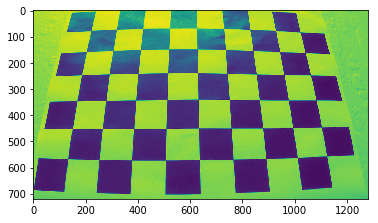

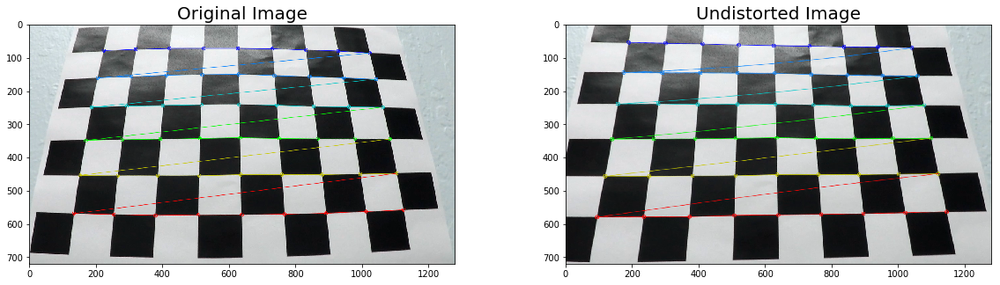

In [9]:
# call cv2 undistor
#def undistort(image, matrix, dis):
#    return cv2.undistort(image, matrix, dis, None, matrix)

nx = 9 # different than the course lecture
ny = 6
objpoints = []
imgpoints = []
# prepare object points, like (0,0,0), (1,0,0), ... 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

img = cv2.imread('camera_cal/calibration3.jpg') # pick one
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

#Finding chessboard corners (for an nx x ny board):
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# assume ret == True
imgpoints.append(corners)
objpoints.append(objp)
# Drawing detected corners on an image:
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

# Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, matrix, dist, rvecs, tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# where dist is distortion coefficent
# matrix, camera matrix to transform 3D to 2D image points

# Undistorting a test image:
undistorted = cv2.undistort(img, matrix, dist, None, matrix)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))                             
ax1.set_title('Original Image', fontsize=20)
ax2.set_title('Undistorted Image', fontsize=20)
ax1.imshow(img)
ax2.imshow(undistorted)
plt.plot()

mkdir: cannot create directory ‘undistorted_folder’: File exists


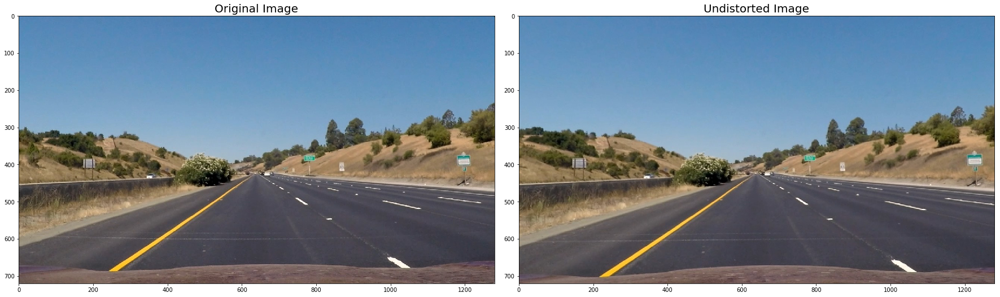

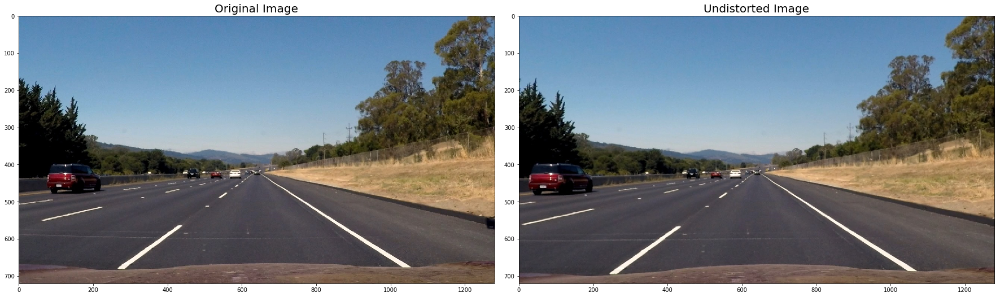

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


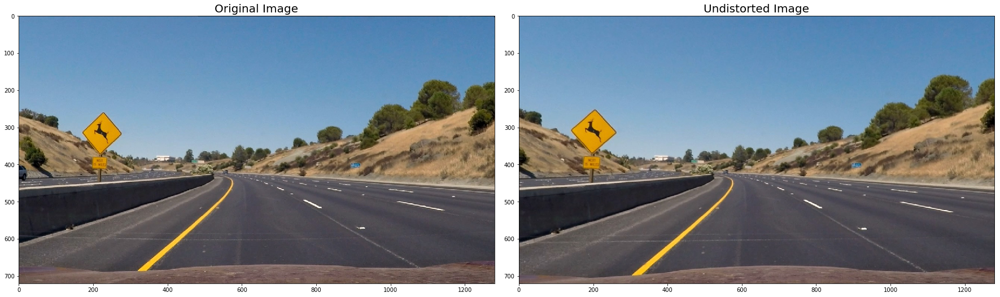

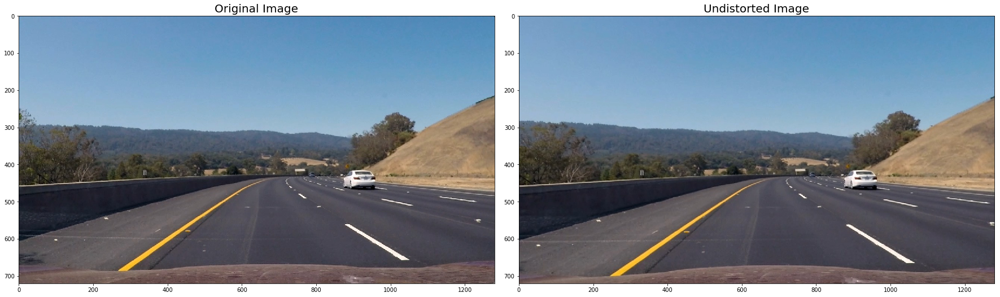

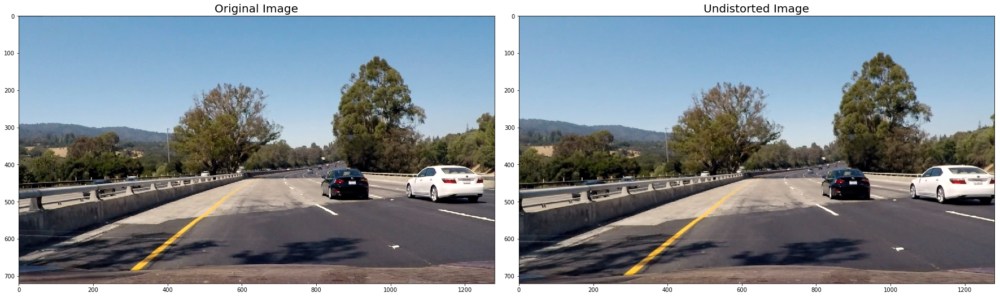

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


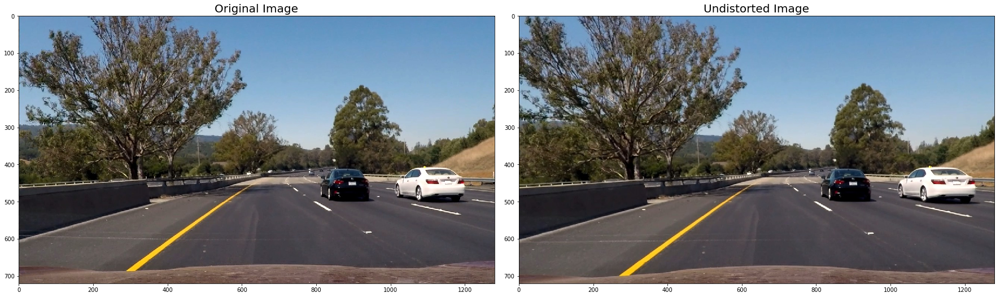

In [10]:
# mkdir system call
%mkdir undistorted_folder 

def save(dire, fname, img):
    #print(fname)
    fname = ''.join([dire,'undistorted_',fname])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(fname,img)

images = ['straight_lines1.jpg', 'straight_lines2.jpg',
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, matrix, dist, None, matrix) #undistort(img, matrix, dist)          
    save('undistorted_folder/', fname, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [11]:
# Code taken from Udacity lecture

# Sobel Absolute Threshold 
def abs_sobel_thresh(img, direction='x', 
                     sobel_kernel=3, thresh=(0, 255)):    
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    # Sobel x
    if direction == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx) 
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))  
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
        abs_sobely = np.absolute(sobely) 
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1    
    return sxbinary

In [12]:
# Sobel Magnitude Threshold 
def mag_thresh(img, sobel_kernel=3, 
               mag_thresh=(0, 255)):
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1    
    return mag_binary

In [13]:
# Sobel Direction Threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1    
    return dir_binary

In [14]:
def combined_sobel_gradient_thres(img, disp=False, s_thresh_min=150, s_thresh_max=255):    
    ksize = 3     # Sobel kernel size
    gradx = abs_sobel_thresh(img, direction='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, direction='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))|((mag_binary == 1) & (dir_binary == 1))] = 1    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1    
    combined_binary = np.zeros_like(combined)    
    combined_binary[(s_binary == 1) | (combined == 1)] = 1  
    fs = 30 # font size
    if disp == True:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(40,20))
        ax1[0].set_title('Original Image', fontsize=20)
        ax1[0].imshow(img)
        ax1[1].set_title('Combined gradx, grady, mag, dir', fontsize=fs)
        ax1[1].imshow(combined, cmap='gray')
        ax2[0].set_title('Color Thresholding', fontsize=fs)
        ax2[0].imshow(s_binary, cmap='gray')
        ax2[1].set_title('Combined S Binary', fontsize=fs)
        ax2[1].imshow(combined_binary, cmap='gray')        
    return combined_binary, img, combined, s_binary

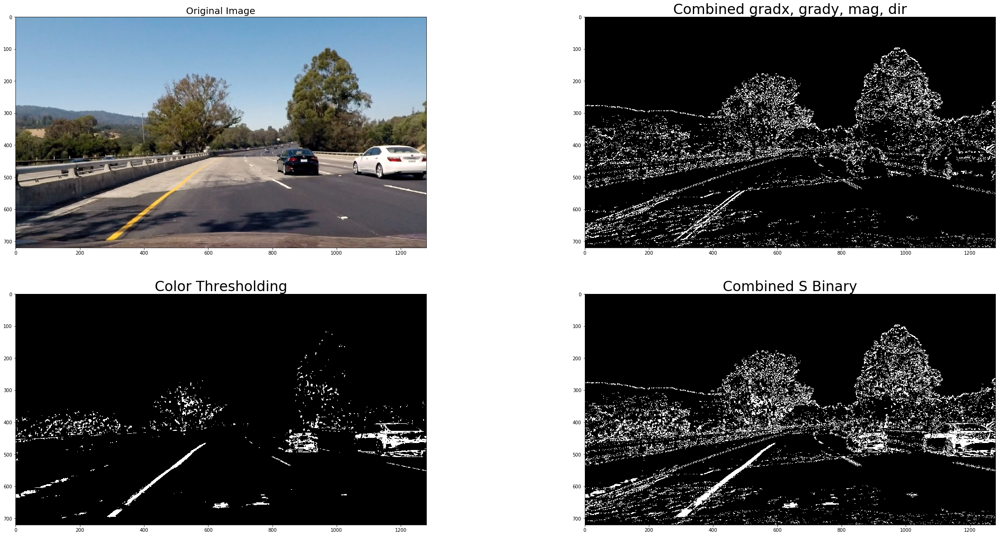

In [15]:
# check the plots
"""
img = 'undistorted_folder/undistorted_test6.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test2.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
"""
#img = 'undistorted_folder/undistorted_straight_lines1.jpg'
img = 'undistorted_folder/undistorted_test4.jpg'
img = cv2.imread(img)
combined_binary, img_color, combined_1, s_binary = combined_sobel_gradient_thres(img, disp=True)

In [16]:
def transform_image_warp(img, nx, ny): 
    offset = 100 # offset for dst points
    #type(img)
    # Grab the image shape
    
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    """
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 60,    img_size[1] / 2 + 60],
        [((img_size[0] / 6) ),       img_size[1]],
        [(img_size[0] * 5 / 6),      img_size[1]],
        [(img_size[0] / 2 + 60),     img_size[1] / 2 + 60]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])    
    """
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)    
    return warped, M


def display_transformed_image(combined_binary, warped_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_binary, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped_img,cmap='gray')
    ax2.set_title('Warped Image', fontsize=30)    
    plt.show()

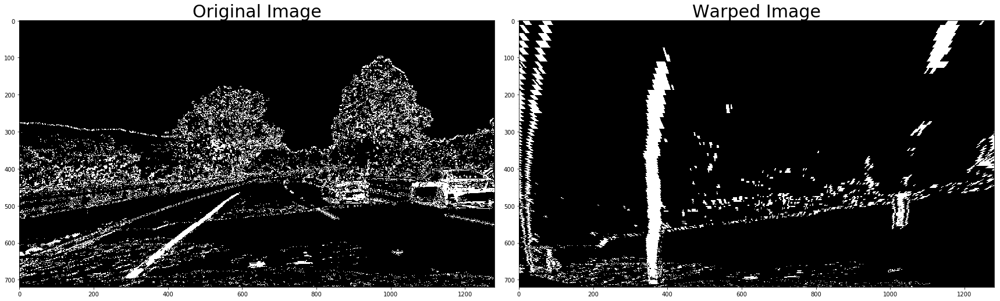

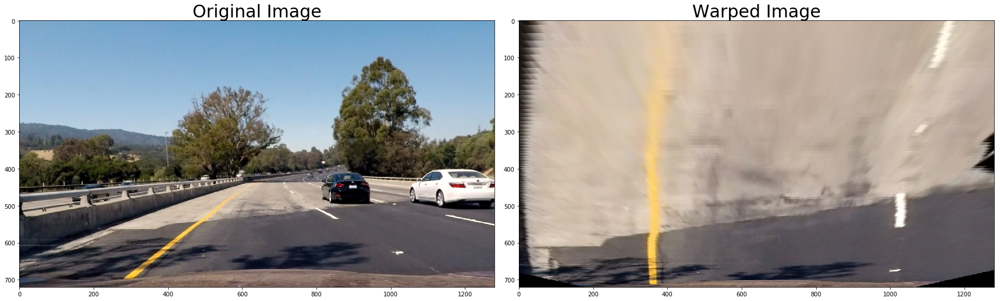

"\nimg1 = 'undistorted_folder/undistorted_test5.jpg'\nimg1 = cv2.imread(img1)\ncombined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)\nwarped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) \ndisplay_transformed_image(combined_binary_1, warped_img_1)\n"

In [17]:
#warped, M = transform_image(combined_binary, src, dst, matrix) 
warped_img, M = transform_image_warp(combined_binary, nx, ny) 
display_transformed_image(combined_binary, warped_img)

color_warped_img, color_M = transform_image_warp(img_color, nx, ny) 
display_transformed_image(img_color, color_warped_img)

"""
img1 = 'undistorted_folder/undistorted_test5.jpg'
img1 = cv2.imread(img1)
combined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)
warped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) 
display_transformed_image(combined_binary_1, warped_img_1)
"""

In [18]:
# Locating the Lanes
def locating_lanes(binary_warped, nwindows=9, margin=100, minpix=50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    
    ## Create an image to draw on and an image to show the selection window
    ##out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
     
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return  left_fit, right_fit,left_lane_inds, right_lane_inds, \
            nonzerox, nonzeroy, histogram


In [19]:
def display_lanes(left_fit, right_fit, left_lane_inds, 
                  right_lane_inds, binary_warped, 
                  nonzerox, nonzeroy, histogram, margin=85): #50):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),  (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(binary_warped)
    #plt.imshow(out_img)
    #plt.imshow(result)
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='red')    
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

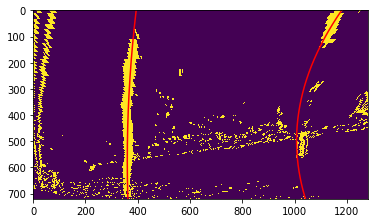

In [20]:
left_fit, right_fit, left_lane_inds, right_lane_inds,\
            nonzerox, nonzeroy, histogram = locating_lanes(warped_img)
    
display_lanes(left_fit, right_fit, left_lane_inds, \
              right_lane_inds, warped_img, nonzerox, nonzeroy, histogram)

......


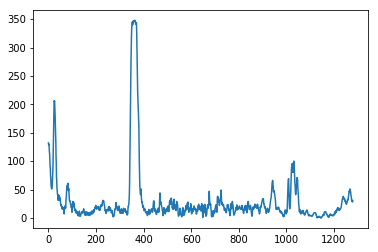

In [21]:
print('......')
plt.plot(histogram)  
plt.show()


# Radius of Curvature & Distance from Lane Center

In [22]:
def radius_curvature_center(binary_img, left_fit, right_fit):        
    ym_per_pix = 30/720 #3.048/100  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 #3.7/380 #3.7/700 # meters per pixel in x dimension
    h = binary_img.shape[0] 
    ploty = np.linspace(0, h-1, h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)    
    # follow udacity lecture formulat
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)    
    left_curv  = ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix \
                        + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)        
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix \
                        + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fi
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.0
    center_image = binary_img.shape[1]/2 #640
    center_dist = (lane_center - center_image) * xm_per_pix #Convert to meters
    return left_curv, right_curv, center_dist

In [23]:
left_curv, right_curv, center = radius_curvature_center(warped_img, left_fit, right_fit)


In [24]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, \
               left_curv, right_curv, center, show_values = False):    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image and draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lanes the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    M_inverse = np.linalg.inv(M)
    
    # Warp the blank back to original image space using inverse perspective matrix
    unwarped = cv2.warpPerspective(color_warp, M_inverse, \
                                  (undist.shape[1], img.shape[0])) 
        
    result = cv2.addWeighted(undist, 1, unwarped, 0.3, 0)
    
    cv2.putText(result, 'left curvature: {:.2f} m'.format(left_curv), \
                (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    cv2.putText(result, 'right curvature: {:.2f} m'.format(right_curv), \
                (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    lr = ''
    if(center > 0): lr = 'right'
    elif (center<0): lr = 'left'
    else: lr = 'center'
    
    cv2.putText(result, 'vehicle is {:.2f}m {}'.format(abs(center), lr), \
                (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(result)        
    return result

array([[[121, 167, 201],
        [121, 167, 201],
        [121, 167, 201],
        ..., 
        [110, 164, 202],
        [110, 164, 202],
        [110, 164, 202]],

       [[121, 167, 201],
        [121, 167, 201],
        [121, 167, 201],
        ..., 
        [110, 163, 203],
        [110, 163, 203],
        [110, 164, 202]],

       [[121, 167, 201],
        [121, 167, 201],
        [121, 167, 201],
        ..., 
        [110, 163, 203],
        [110, 163, 203],
        [110, 163, 203]],

       ..., 
       [[ 43,  40,  51],
        [ 41,  38,  49],
        [ 40,  37,  48],
        ..., 
        [120, 100,  93],
        [121, 101,  94],
        [122, 102,  95]],

       [[ 42,  36,  48],
        [ 43,  37,  47],
        [ 44,  38,  48],
        ..., 
        [116,  96,  89],
        [118,  98,  91],
        [119,  99,  92]],

       [[ 52,  44,  55],
        [ 52,  44,  55],
        [ 52,  44,  55],
        ..., 
        [112,  92,  85],
        [115,  95,  88],
        [117,  97,

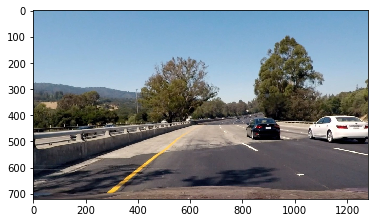

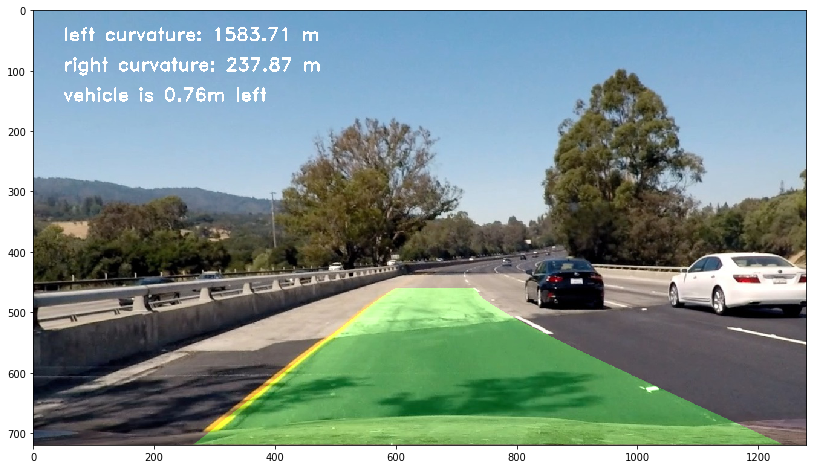

In [25]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curv, right_curv, center, True)

# Pipeline

In [106]:
# for pipeline based on time-series images from the video
def locating_lanes_with_prev(left_fit, right_fit, binary_warped):    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                    & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]    
    left_fit_ = []
    right_fit_ = []    
    if len(leftx) != 0:        
        left_fit_ = np.polyfit(lefty, leftx, 2)    
    if len(rightx) != 0:        
        right_fit_ = np.polyfit(righty, rightx, 2)     
    return left_fit_, right_fit_


def is_good_lane(lane_class):
    status = True
    #print(lane_class.prev_left_lanes)
    #print(lane_class.right_fit)
    dist = lane_class.left_fit[2] - lane_class.right_fit[2]
    if lane_class.nlen_in > 0:
        left_diff = np.sum(np.absolute(lane_class.prev_left_lanes - lane_class.left_fit))
        right_diff = np.sum(np.absolute(lane_class.prev_right_lanes - lane_class.right_fit))        
        #print(lane_class.prev_right_lanes)
        right_m = np.mean(lane_class.prev_right_lanes, axis=0)
        left_m = np.mean(lane_class.prev_left_lanes, axis=0)
        diff_rel = 0.5 # 20%
        diff_right = np.absolute((right_m  - lane_class.right_fit)/right_m)
        diff_left = np.absolute((left_m  - lane_class.left_fit)/left_m)
        #print('mean', left_m)# - lane_class.left_fit[0])/lane_class.prev_left_lanes[0] 
        #print('right', lane_class.right_fit)
        #diff_l0 = np.absolute(lane_class.prev_left_lanes[0] - lane_class.left_fit[0])
        print('right diff' , diff_right)
        print('left_diff', diff_left)
        #print(diff_right[1], diff_right[1]>0.5)
        if diff_right[0] > diff_rel or diff_left[0] > diff_rel: 
            return False
        thres_margin = 50
        diff_threshold = thres_margin * len(lane_class.prev_right_lanes)
        if left_diff > diff_threshold or right_diff > diff_threshold:
            print('previous diff', diff_threshold, left_diff, right_diff)
            #status = False
            return False        
        #print(lane_class.left_fit)
        #print(lane_class.right_fit)
        if np.sum(lane_class.left_fit[0:1] - lane_class.right_fit[0:1]) > 1e-3:
            print('not parallel', lane_class.left_fit, lane_class.right_fit, 
                  np.sum(lane_class.left_fit - lane_class.right_fit))
            #status = False
            return False
            #break
    else:
        #status = True
        return True
    return status


In [107]:
# create a global data structure to store the time-series images
class Laneline():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.count = 0 
        self.histograms = None
        self.prev_left_lanes = []
        self.prev_right_lanes = []
        self.bad_count = 0
        self.nlen = 50 # buffer size
        self.nlen_in = 0
        #self.current_left_lanes = None
        #self.current_right_lane = None
        

In [108]:

lane = Laneline()

def find_lanes(img):    
    img = cv2.undistort(img, matrix, dist, None, matrix)
    combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
    warped_img, M = transform_image_warp(combined_binary, nx, ny) 
    #print('lane counter --> ', lane.counter)
    if lane.count == 0:
        lane.left_fit, lane.right_fit, left_lane_inds,\
                right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
        #lane.count += 1    
    else:
        lane.left_fit, lane.right_fit  = \
                locating_lanes_with_prev(lane.left_fit, lane.right_fit, warped_img)        
    
    #print(lane.left_fit, lane.right_fit)
    #return warped_img, lane.left_fit, lane.right_fit, M
    #status, delta_l, delta_s = is_good_lane(lane.left_fit, lane.right_fit)
    status = is_good_lane(lane)
    #status = False
    print(status)
    #, delta_l, delta_s)
    if status == True:
        bad_count = 0
        lane.prev_left_lanes.append(lane.left_fit)
        lane.prev_right_lanes.append(lane.right_fit)
        nlen = lane.nlen
        lane.nlen_in += 1
        if lane.nlen_in >= nlen: #len(lane.prev_right_lanes) > nlen:
            lane.prev_right_lanes = lane.prev_right_lanes[-nlen::]            
            lane.prev_left_lanes = lane.prev_left_lanes[-nlen::]
            lane.nlen_in = nlen
    else:
        lane.bad_count += 1
        right_ls = lane.prev_right_lanes[0]
        len_rls = len(lane.prev_right_lanes)
        for i in range(1, len_rls):
            right_ls = np.add(right_ls, lane.prev_right_lanes[i])
            
        left_ls = lane.prev_left_lanes[0]
        len_lls = len(lane.prev_left_lanes)
        for i in range(1, len_lls):
            left_ls = np.add(left_ls, lane.prev_left_lanes[i])
        lane.left_fit = left_ls / len_lls
        lane.right_fit = right_ls / len_rls
        
    if lane.bad_count >= 30:
        print('clear bad lanes')
        lane.bad_count = 0
        lane.prev_left_lanes = []
        lane.prev_right_lanes = []
        lane.nlen_in = 0
    return warped_img, lane.left_fit, lane.right_fit, M

True
right diff [ 0.94909998  0.31202586  0.01332135]
left_diff [ 7.73615253  0.58683874  0.01296118]
False
right diff [ 1.09911127  1.51810392  0.14784603]
left_diff [ 28.99766204   7.44330124   0.34124019]
False
right diff [ 2.98716062  2.4212129   0.05797291]
left_diff [ 35.13915086   9.92287774   0.21108726]
False
right diff [ 0.2212523   1.45028557  0.15770872]
left_diff [ 22.04367981   9.82192133   0.58929008]
False
right diff [ 4.66178683  3.4652834   0.17186313]
left_diff [ 15.93450009   4.52249621   0.30408827]
False
right diff [ 1.2386019   0.49373742  0.05500921]
left_diff [ 26.5931361    7.36461144   0.18039217]
False
right diff [ 0.88144999  1.76777074  0.19216423]
left_diff [ 18.08808919   9.17116649   0.6276504 ]
False


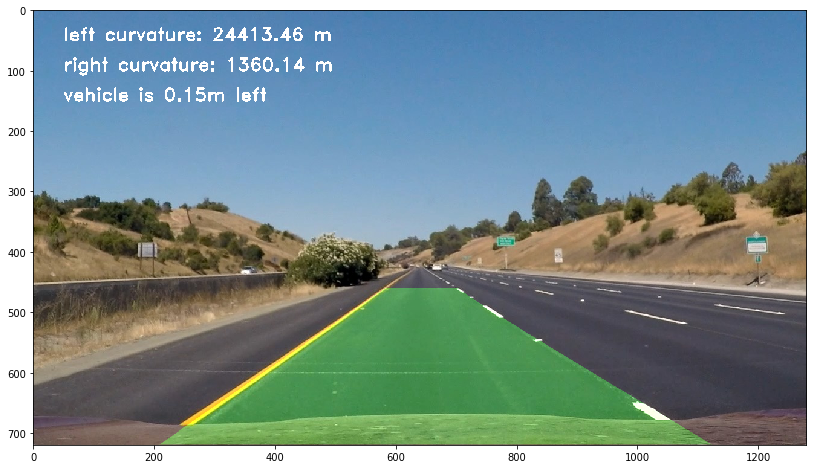

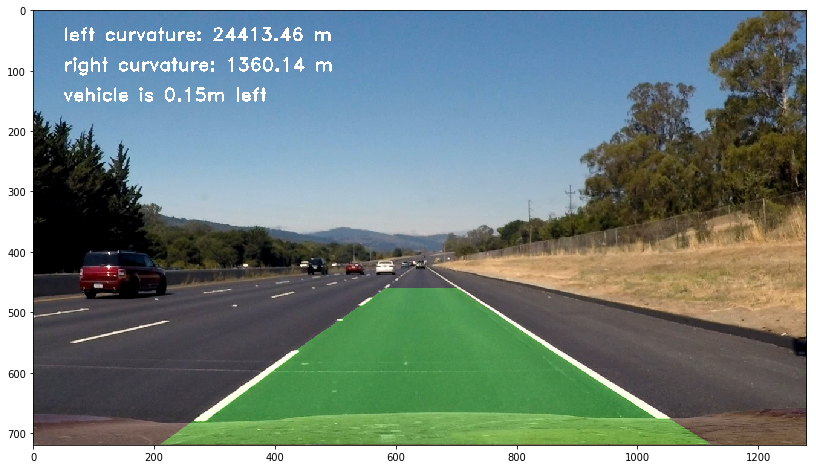

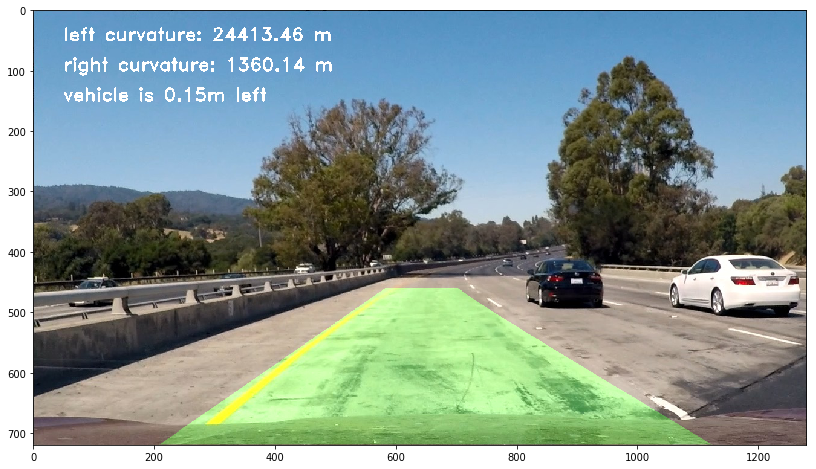

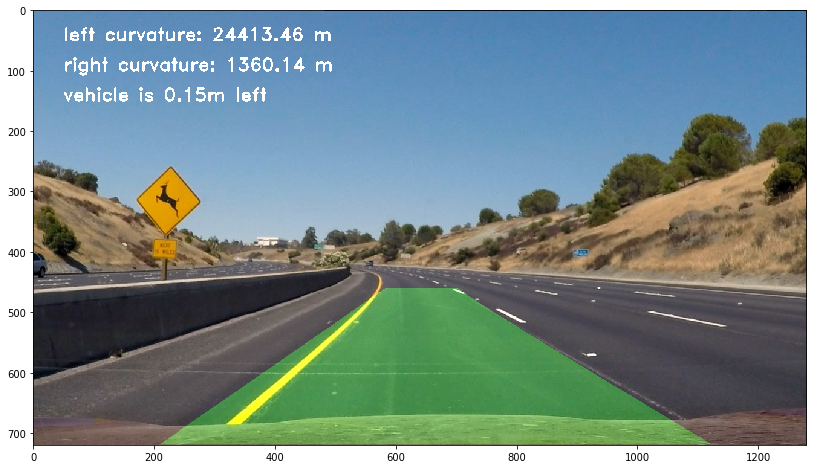

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


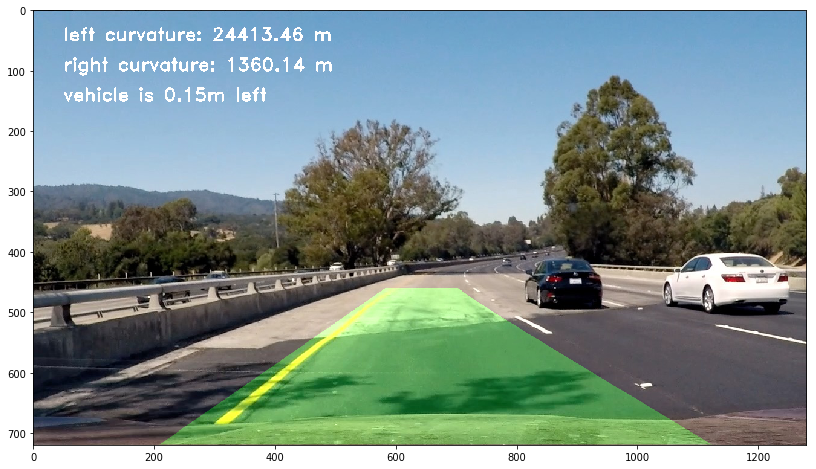

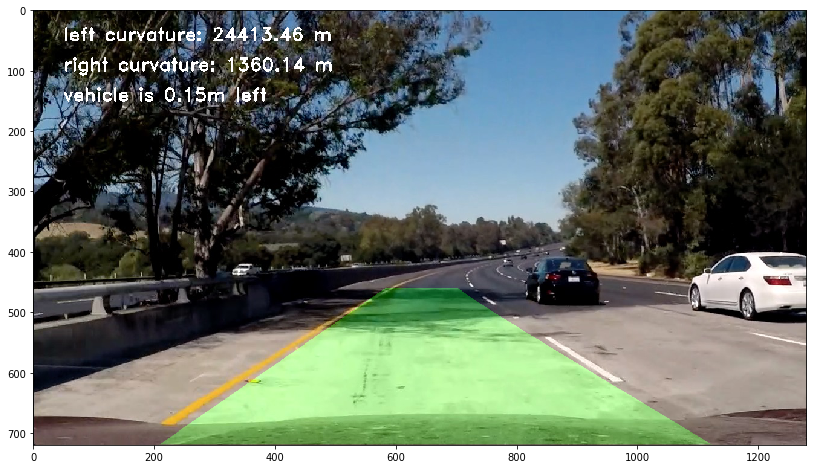

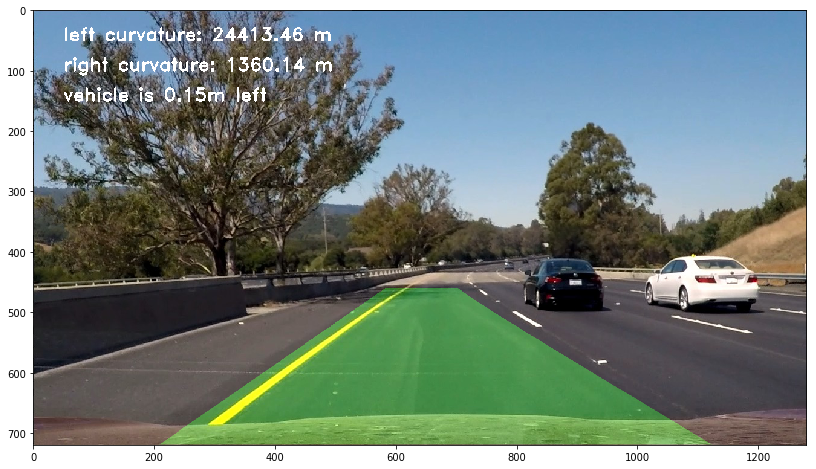

In [109]:
def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)    
    left_curvature, right_curvature, center = \
            radius_curvature_center(warped_img, left_fit, right_fit)
    return draw_on_image(img, warped_img, left_fit,\
                         right_fit, M, left_curvature, right_curvature, center, show_values)
    
images = ['straight_lines1.jpg', 'straight_lines2.jpg',\
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', \
          'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)

# Video Generations

In [110]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML 
lane = Laneline()
def process_video(img):
    return pipeline(img)

#%mkdir videos

In [114]:
lane = Laneline()
output_file = 'videos/project_video_small.mp4'
clip = VideoFileClip("project_video.mp4").subclip(29, 35)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
[MoviePy] >>>> Building video videos/project_video_small.mp4
[MoviePy] Writing video videos/project_video_small.mp4



  1%|          | 1/151 [00:00<00:41,  3.60it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True



  1%|▏         | 2/151 [00:00<00:41,  3.57it/s]

right diff [ 0.21315787  0.0746586   0.00498869]
left_diff [ 0.05774294  0.04950195  0.01375316]
True



  2%|▏         | 3/151 [00:00<00:40,  3.65it/s]

right diff [ 0.64291796  0.17746482  0.00637507]
left_diff [ 0.05075053  0.0420684   0.0158999 ]
False



  3%|▎         | 4/151 [00:01<00:40,  3.62it/s]

right diff [ 0.96104543  0.28760152  0.01256766]
left_diff [ 0.1083207   0.0860875   0.02713637]
False



  3%|▎         | 5/151 [00:01<00:40,  3.61it/s]

right diff [ 0.60771882  0.19522284  0.01122855]
left_diff [ 0.11419457  0.09392337  0.03224004]
False



  4%|▍         | 6/151 [00:01<00:40,  3.57it/s]

right diff [ 0.01209606  0.00149877  0.00168657]
left_diff [ 0.1830311   0.14655576  0.04673287]
True



  5%|▍         | 7/151 [00:01<00:38,  3.74it/s]

right diff [ 0.28461254  0.09103403  0.00259384]
left_diff [ 0.07553002  0.11870043  0.05171017]
True



  5%|▌         | 8/151 [00:02<00:39,  3.62it/s]

right diff [ 0.01880391  0.0333593   0.00628643]
left_diff [ 0.05882181  0.12590072  0.05946221]
True



  6%|▌         | 9/151 [00:02<00:38,  3.67it/s]

right diff [ 0.18983876  0.0834208   0.00621008]
left_diff [ 0.00089412  0.08098619  0.04787346]
True



  7%|▋         | 10/151 [00:02<00:38,  3.64it/s]

right diff [ 0.30977034  0.12531292  0.00677686]
left_diff [ 0.03559883  0.08107624  0.04148413]
True



  7%|▋         | 11/151 [00:03<00:37,  3.70it/s]

right diff [ 0.17352552  0.07031966  0.00337789]
left_diff [ 0.11751662  0.10775619  0.04292171]
True



  8%|▊         | 12/151 [00:03<00:38,  3.62it/s]

right diff [ 0.06494603  0.00806014  0.00305632]
left_diff [ 0.02386518  0.05369464  0.03286806]
True



  9%|▊         | 13/151 [00:03<00:37,  3.70it/s]

right diff [ 0.17397244  0.05243744  0.00394464]
left_diff [ 0.00481065  0.04673848  0.03589661]
True



  9%|▉         | 14/151 [00:03<00:37,  3.67it/s]

right diff [ 0.29841484  0.11133129  0.01099653]
left_diff [ 0.06915512  0.06445274  0.03205399]
True



 10%|▉         | 15/151 [00:04<00:36,  3.70it/s]

right diff [ 0.74396711  0.22835729  0.01135663]
left_diff [ 0.04323144  0.06495311  0.0400281 ]
False



 11%|█         | 16/151 [00:04<00:36,  3.72it/s]

right diff [ 0.46490515  0.15352327  0.00932431]
left_diff [ 0.0149308   0.05407553  0.04042526]
True



 11%|█▏        | 17/151 [00:04<00:35,  3.79it/s]

right diff [ 0.32737401  0.10608691  0.00528067]
left_diff [ 0.00584306  0.05219119  0.0455258 ]
True



 12%|█▏        | 18/151 [00:04<00:35,  3.75it/s]

right diff [ 0.51982707  0.19856964  0.01112326]
left_diff [ 0.00558443  0.05142149  0.04295614]
False



 13%|█▎        | 19/151 [00:05<00:33,  3.89it/s]

right diff [ 0.19389867  0.06725989  0.00354254]
left_diff [ 0.08723674  0.10047163  0.05463438]
True



 13%|█▎        | 20/151 [00:05<00:33,  3.87it/s]

right diff [ 0.00395479  0.01539971  0.00476655]
left_diff [ 0.08544414  0.0105078   0.03889453]
True



 14%|█▍        | 21/151 [00:05<00:33,  3.89it/s]

right diff [ 0.0201737   0.01087019  0.00677591]
left_diff [ 0.03882475  0.01399931  0.03361151]
True



 15%|█▍        | 22/151 [00:05<00:33,  3.82it/s]

right diff [ 0.26104651  0.08435731  0.00373725]
left_diff [ 0.16596639  0.05503658  0.02294556]
True



 15%|█▌        | 23/151 [00:06<00:33,  3.86it/s]

right diff [  9.77573899e-02   2.82508007e-05   1.25809105e-02]
left_diff [ 0.1979832   0.08200002  0.01460438]
True



 16%|█▌        | 24/151 [00:06<00:32,  3.86it/s]

right diff [ 0.11472071  0.01470174  0.01752802]
left_diff [ 0.23169965  0.11481961  0.00638524]
True



 17%|█▋        | 25/151 [00:06<00:31,  3.97it/s]

right diff [ 0.15241509  0.10614334  0.0220957 ]
left_diff [ 0.14691967  0.06582951  0.0169546 ]
True



 17%|█▋        | 26/151 [00:06<00:32,  3.89it/s]

right diff [ 0.32047018  0.1875053   0.02934302]
left_diff [ 0.22606488  0.1012755   0.01446561]
True



 18%|█▊        | 27/151 [00:07<00:31,  3.96it/s]

right diff [ 0.65651408  0.29738239  0.03804072]
left_diff [ 0.24762152  0.12806476  0.00769238]
False



 19%|█▊        | 28/151 [00:07<00:31,  3.87it/s]

right diff [ 0.49598343  0.24498778  0.03631989]
left_diff [ 0.17469424  0.08184154  0.02033824]
True



 19%|█▉        | 29/151 [00:07<00:30,  3.96it/s]

right diff [ 0.04499551  0.09074401  0.02718999]
left_diff [ 0.15500968  0.0482256   0.03760364]
True



 20%|█▉        | 30/151 [00:07<00:31,  3.88it/s]

right diff [ 0.26834619  0.17114881  0.0313436 ]
left_diff [ 0.12259642  0.02395634  0.04542441]
True



 21%|██        | 31/151 [00:08<00:30,  3.93it/s]

right diff [ 0.21663634  0.18380996  0.0394263 ]
left_diff [ 0.07436861  0.02560901  0.03664029]
True



 21%|██        | 32/151 [00:08<00:30,  3.88it/s]

right diff [ 0.05263038  0.13436246  0.04012729]
left_diff [ 0.1199508   0.05904525  0.02895179]
True



 22%|██▏       | 33/151 [00:08<00:30,  3.90it/s]

right diff [ 0.16416106  0.04795466  0.03577818]
left_diff [ 0.15383353  0.08383388  0.02173591]
True



 23%|██▎       | 34/151 [00:08<00:30,  3.83it/s]

right diff [ 0.31432479  0.0239911   0.03093481]
left_diff [ 0.14976574  0.09982031  0.01439957]
True



 23%|██▎       | 35/151 [00:09<00:29,  3.95it/s]

right diff [ 0.31475606  0.03450054  0.02887173]
left_diff [ 0.14802224  0.10037661  0.01433744]
True



 24%|██▍       | 36/151 [00:09<00:29,  3.86it/s]

right diff [ 0.35151732  0.06647713  0.02452915]
left_diff [ 0.0501649   0.06495125  0.01562678]
True



 25%|██▍       | 37/151 [00:09<00:28,  3.96it/s]

right diff [ 3.35263222  0.14774795  0.02855227]
left_diff [ 0.06264866  0.1012979   0.00017889]
False



 25%|██▌       | 38/151 [00:09<00:28,  3.91it/s]

right diff [ 3.97791105  0.36875153  0.03693938]
left_diff [ 0.05956971  0.04838226  0.00513353]
False



 26%|██▌       | 39/151 [00:10<00:27,  4.05it/s]

right diff [ 0.22934345  0.11448042  0.03477656]
left_diff [ 0.11148053  0.04795062  0.00084983]
True



 26%|██▋       | 40/151 [00:10<00:27,  3.99it/s]

right diff [ 0.3137121   0.15855754  0.03753812]
left_diff [ 0.17026972  0.0212541   0.00099365]
True



 27%|██▋       | 41/151 [00:10<00:26,  4.08it/s]

right diff [ 0.0434897   0.02361499  0.02707185]
left_diff [ 0.19708947  0.00809314  0.00968038]
True



 28%|██▊       | 42/151 [00:10<00:27,  3.99it/s]

right diff [ 0.34015415  0.08926226  0.02136445]
left_diff [ 0.1737031   0.01017549  0.00332285]
True



 28%|██▊       | 43/151 [00:11<00:27,  3.95it/s]

right diff [ 0.23279233  0.05763557  0.02015662]
left_diff [ 0.22364353  0.03068765  0.01295813]
True



 29%|██▉       | 44/151 [00:11<00:27,  3.93it/s]

right diff [ 0.27349766  0.09040646  0.01365662]
left_diff [ 0.2391696  0.0610657  0.0245141]
True



 30%|██▉       | 45/151 [00:11<00:26,  4.01it/s]

right diff [ 0.44736515  0.17297829  0.00667178]
left_diff [ 0.1802372   0.05290962  0.02910321]
True



 30%|███       | 46/151 [00:11<00:26,  3.99it/s]

right diff [ 0.56618751  0.21903209  0.00560794]
left_diff [ 0.20367621  0.06435439  0.02895207]
False



 31%|███       | 47/151 [00:12<00:25,  4.03it/s]

right diff [ 0.72372265  0.27800514  0.00603798]
left_diff [ 0.12549517  0.0062268   0.01367993]
False



 32%|███▏      | 48/151 [00:12<00:25,  3.99it/s]

right diff [ 0.55616442  0.2120046   0.01065439]
left_diff [ 0.16672137  0.01675221  0.00955294]
False



 32%|███▏      | 49/151 [00:12<00:25,  4.02it/s]

right diff [ 3.33565437  0.01658415  0.01178879]
left_diff [ 0.21854114  0.04041761  0.01282299]
False



 33%|███▎      | 50/151 [00:12<00:25,  4.02it/s]

right diff [ 0.00114606  0.03563728  0.01625337]
left_diff [ 0.21930687  0.04672854  0.0144908 ]
True



 34%|███▍      | 51/151 [00:13<00:24,  4.09it/s]

right diff [ 0.27176975  0.03346022  0.01537992]
left_diff [ 0.12128122  0.01940809  0.01893806]
True



 34%|███▍      | 52/151 [00:13<00:24,  3.97it/s]

right diff [ 0.14818585  0.13278903  0.00305791]
left_diff [ 0.0891786   0.01946563  0.02381958]
True



 35%|███▌      | 53/151 [00:13<00:23,  4.10it/s]

right diff [ 0.03309475  0.10997135  0.00270013]
left_diff [ 0.02827859  0.01199278  0.03020024]
True



 36%|███▌      | 54/151 [00:13<00:24,  3.96it/s]

right diff [ 0.06049336  0.07802713  0.00217602]
left_diff [ 0.06259122  0.03017329  0.02455565]
True



 36%|███▋      | 55/151 [00:14<00:23,  4.11it/s]

right diff [ 0.06509021  0.11269762  0.00300914]
left_diff [ 0.05947252  0.04441951  0.01792073]
True



 37%|███▋      | 56/151 [00:14<00:23,  4.00it/s]

right diff [ 0.19886493  0.15318027  0.0031527 ]
left_diff [ 0.05806709  0.06850679  0.00616655]
True



 38%|███▊      | 57/151 [00:14<00:22,  4.16it/s]

right diff [ 0.25664921  0.15060096  0.00156931]
left_diff [ 0.15238209  0.15227737  0.02039932]
True



 38%|███▊      | 58/151 [00:14<00:22,  4.06it/s]

right diff [ 0.54802849  0.2937811   0.01180092]
left_diff [ 0.1681351   0.15748681  0.02058655]
False



 39%|███▉      | 59/151 [00:15<00:22,  4.13it/s]

right diff [ 0.47291769  0.26376023  0.01015718]
left_diff [ 0.21001647  0.19385489  0.03161766]
True



 40%|███▉      | 60/151 [00:15<00:22,  4.03it/s]

right diff [ 0.43215228  0.24239998  0.00773208]
left_diff [ 0.29024248  0.2517176   0.04609047]
True



 40%|████      | 61/151 [00:15<00:21,  4.12it/s]

right diff [ 0.18999864  0.16625509  0.00753669]
left_diff [ 0.21321563  0.2052302   0.0359965 ]
True



 41%|████      | 62/151 [00:15<00:22,  4.00it/s]

right diff [ 0.1671772   0.02990497  0.00054958]
left_diff [ 0.21779584  0.21625559  0.0406513 ]
True



 42%|████▏     | 63/151 [00:16<00:21,  4.06it/s]

right diff [ 0.38601262  0.01535546  0.00256802]
left_diff [ 0.13584526  0.17217607  0.03060361]
True



 42%|████▏     | 64/151 [00:16<00:22,  3.95it/s]

right diff [ 0.16522544  0.06824315  0.01198062]
left_diff [ 0.17851863  0.16984845  0.0234592 ]
True



 43%|████▎     | 65/151 [00:16<00:21,  4.08it/s]

right diff [ 0.42994544  0.24555111  0.01929692]
left_diff [ 0.16469123  0.16906646  0.02480499]
True



 44%|████▎     | 66/151 [00:16<00:21,  3.95it/s]

right diff [ 0.32517078  0.2303363   0.02064892]
left_diff [ 0.19724139  0.19401222  0.03191489]
True



 44%|████▍     | 67/151 [00:17<00:21,  3.93it/s]

right diff [ 0.16311713  0.14534707  0.01322062]
left_diff [ 0.27991352  0.24149777  0.04237078]
True



 45%|████▌     | 68/151 [00:17<00:20,  3.98it/s]

right diff [ 0.32522673  0.21752726  0.02076339]
left_diff [ 0.33883819  0.25275995  0.03903119]
True



 46%|████▌     | 69/151 [00:17<00:19,  4.14it/s]

right diff [ 0.4988574   0.30095221  0.02909699]
left_diff [ 0.39112844  0.28466355  0.04529092]
True



 46%|████▋     | 70/151 [00:17<00:20,  3.99it/s]

right diff [ 0.67276518  0.40070533  0.04060652]
left_diff [ 0.43227753  0.29607772  0.04294297]
False



 47%|████▋     | 71/151 [00:18<00:20,  3.99it/s]

right diff [ 0.30396664  0.26763847  0.03754271]
left_diff [ 0.43689791  0.2964176   0.04043059]
True



 48%|████▊     | 72/151 [00:18<00:19,  3.96it/s]

right diff [ 0.17916924  0.20614494  0.03274496]
left_diff [ 0.54260638  0.36511902  0.05575483]
False



 48%|████▊     | 73/151 [00:18<00:19,  4.04it/s]

right diff [ 0.08852654  0.18630452  0.03287193]
left_diff [ 0.54221021  0.38537631  0.06324188]
False



 49%|████▉     | 74/151 [00:18<00:19,  4.03it/s]

right diff [ 0.00769351  0.1428295   0.02675601]
left_diff [ 0.51049073  0.41400393  0.08161375]
False



 50%|████▉     | 75/151 [00:19<00:18,  4.08it/s]

right diff [ 0.25650426  0.05741675  0.02105692]
left_diff [ 0.50205966  0.4407721   0.09560034]
False



 50%|█████     | 76/151 [00:19<00:18,  4.03it/s]

right diff [ 0.09790021  0.18859214  0.02845748]
left_diff [ 0.50188823  0.46515309  0.10752049]
False



 51%|█████     | 77/151 [00:19<00:18,  4.11it/s]

right diff [ 0.51874956  0.33291122  0.03466826]
left_diff [ 0.49863194  0.48388043  0.11830008]
False



 52%|█████▏    | 78/151 [00:19<00:18,  4.01it/s]

right diff [ 0.95527486  0.50891257  0.04643481]
left_diff [ 0.45734708  0.46763739  0.1187981 ]
False



 52%|█████▏    | 79/151 [00:20<00:17,  4.05it/s]

right diff [ 0.64276213  0.43284455  0.05202204]
left_diff [ 0.41768445  0.42752904  0.10586663]
False



 53%|█████▎    | 80/151 [00:20<00:18,  3.90it/s]

right diff [ 0.7569995   0.50980883  0.06421238]
left_diff [ 0.32922222  0.36833936  0.0913725 ]
False



 54%|█████▎    | 81/151 [00:20<00:17,  4.03it/s]

right diff [ 0.87826405  0.58549398  0.07298329]
left_diff [ 0.27244603  0.35446483  0.09438459]
False



 54%|█████▍    | 82/151 [00:20<00:17,  3.99it/s]

right diff [ 0.84149462  0.58279645  0.07368559]
left_diff [ 0.23286443  0.35568559  0.10162939]
False



 55%|█████▍    | 83/151 [00:21<00:16,  4.08it/s]

right diff [ 0.6636255   0.53612693  0.07574091]
left_diff [ 0.15076367  0.31932618  0.09750014]
False



 56%|█████▌    | 84/151 [00:21<00:16,  3.99it/s]

right diff [ 0.56355278  0.46179324  0.06598764]
left_diff [ 0.06387575  0.32149732  0.11360887]
False



 56%|█████▋    | 85/151 [00:21<00:16,  4.08it/s]

right diff [ 0.43036063  0.41950201  0.06212638]
left_diff [ 0.01725694  0.30796772  0.12424632]
previous diff 2500 3367.96341656 3771.21299264
False



 57%|█████▋    | 86/151 [00:21<00:16,  4.05it/s]

right diff [ 0.22369505  0.35748848  0.05977052]
left_diff [ 0.13627237  0.27625496  0.13031077]
previous diff 2500 3531.54794645 3627.24310541
False



 58%|█████▊    | 87/151 [00:22<00:15,  4.10it/s]

right diff [ 0.11035734  0.23060284  0.04845363]
left_diff [ 0.05051161  0.350894    0.1556398 ]
previous diff 2500 4218.34225155 2939.31623612
False
clear bad lanes



 58%|█████▊    | 88/151 [00:22<00:16,  3.93it/s]

True



 59%|█████▉    | 89/151 [00:22<00:15,  3.90it/s]

right diff [ 0.17570337  0.08075274  0.00349703]
left_diff [ 0.03993846  0.02514176  0.00826127]
True



 60%|█████▉    | 90/151 [00:22<00:16,  3.71it/s]

right diff [ 0.32912044  0.16719252  0.01047759]
left_diff [ 0.06169868  0.01679234  0.00445471]
True



 60%|██████    | 91/151 [00:23<00:15,  3.76it/s]

right diff [ 0.18941715  0.05796837  0.01030544]
left_diff [ 0.0482011   0.04819138  0.01726296]
True



 61%|██████    | 92/151 [00:23<00:15,  3.71it/s]

right diff [ 0.1871707   0.16818604  0.02744045]
left_diff [ 0.05974615  0.10379754  0.03927046]
True



 62%|██████▏   | 93/151 [00:23<00:15,  3.65it/s]

right diff [ 0.09202139  0.10202738  0.02180376]
left_diff [ 0.13699818  0.0320176   0.02778447]
True



 62%|██████▏   | 94/151 [00:24<00:15,  3.63it/s]

right diff [ 0.22498621  0.13699758  0.01688857]
left_diff [ 0.06467646  0.0420247   0.0148805 ]
True



 63%|██████▎   | 95/151 [00:24<00:14,  3.77it/s]

right diff [ 0.14342064  0.07315779  0.01107262]
left_diff [ 0.10669475  0.00389343  0.00667818]
True



 64%|██████▎   | 96/151 [00:24<00:15,  3.49it/s]

right diff [ 0.02119413  0.03259309  0.0036402 ]
left_diff [ 0.18065446  0.08276168  0.01351739]
True



 64%|██████▍   | 97/151 [00:24<00:14,  3.72it/s]

right diff [ 0.00795264  0.04815044  0.00300098]
left_diff [ 0.17717975  0.13052085  0.03522273]
True



 65%|██████▍   | 98/151 [00:25<00:13,  3.80it/s]

right diff [ 0.18626006  0.17060971  0.00916674]
left_diff [ 0.24734768  0.18567824  0.04339818]
True



 66%|██████▌   | 99/151 [00:25<00:13,  3.93it/s]

right diff [ 0.45336515  0.32965631  0.01693447]
left_diff [ 0.31348146  0.21072603  0.04150235]
True



 66%|██████▌   | 100/151 [00:25<00:13,  3.86it/s]

right diff [ 0.40478758  0.30415053  0.01412146]
left_diff [ 0.31657418  0.1879339   0.03490698]
True



 67%|██████▋   | 101/151 [00:25<00:12,  3.87it/s]

right diff [ 0.35293563  0.07006247  0.00335387]
left_diff [ 0.21479141  0.10734833  0.02093053]
True



 68%|██████▊   | 102/151 [00:26<00:12,  3.78it/s]

right diff [ 0.09946076  0.04676484  0.00180525]
left_diff [ 0.19590728  0.08423249  0.01618406]
True



 68%|██████▊   | 103/151 [00:26<00:12,  3.78it/s]

right diff [ 0.16309361  0.19314909  0.00553836]
left_diff [ 0.21753545  0.0859547   0.01539615]
True



 69%|██████▉   | 104/151 [00:26<00:12,  3.66it/s]

right diff [ 0.11512822  0.04702204  0.0014892 ]
left_diff [ 0.13133202  0.03453997  0.0108374 ]
True



 70%|██████▉   | 105/151 [00:26<00:12,  3.77it/s]

right diff [ 0.1579255   0.03930281  0.00078134]
left_diff [ 0.06869092  0.01762621  0.01552314]
True



 70%|███████   | 106/151 [00:27<00:11,  3.79it/s]

right diff [ 0.10999082  0.05523466  0.00187422]
left_diff [ 0.00115715  0.00273099  0.02096862]
True



 71%|███████   | 107/151 [00:27<00:11,  3.89it/s]

right diff [ 0.21827823  0.00775797  0.00156827]
left_diff [ 0.01233519  0.02126915  0.02792995]
True



 72%|███████▏  | 108/151 [00:27<00:11,  3.86it/s]

right diff [ 0.01205824  0.11968543  0.00559187]
left_diff [ 0.14363803  0.06893351  0.02378415]
True



 72%|███████▏  | 109/151 [00:27<00:10,  3.96it/s]

right diff [ 0.15565385  0.20171997  0.01268541]
left_diff [ 0.14736097  0.02259464  0.04411532]
True



 73%|███████▎  | 110/151 [00:28<00:10,  3.88it/s]

right diff [ 0.49269811  0.31648106  0.01586327]
left_diff [ 0.18137188  0.02873142  0.05078601]
True



 74%|███████▎  | 111/151 [00:28<00:10,  3.98it/s]

right diff [ 0.4040248   0.30798458  0.01963005]
left_diff [ 0.10811091  0.06556243  0.07504379]
True



 74%|███████▍  | 112/151 [00:28<00:10,  3.87it/s]

right diff [ 0.60483265  0.41869927  0.0279786 ]
left_diff [ 0.14429904  0.06781865  0.08792139]
False



 75%|███████▍  | 113/151 [00:29<00:09,  3.88it/s]

right diff [ 0.71332456  0.48242182  0.02820388]
left_diff [ 0.20207225  0.00767785  0.07683357]
False



 75%|███████▌  | 114/151 [00:29<00:09,  3.86it/s]

right diff [ 0.20076573  0.06474901  0.00859435]
left_diff [ 0.1914151   0.02960285  0.07298176]
True



 76%|███████▌  | 115/151 [00:29<00:09,  3.90it/s]

right diff [ 0.09393553  0.11159392  0.00831249]
left_diff [ 0.22804801  0.11782211  0.05567704]
True



 77%|███████▋  | 116/151 [00:29<00:09,  3.87it/s]

right diff [ 0.08869852  0.21291663  0.0149024 ]
left_diff [ 0.29466356  0.12845773  0.06492753]
True



 77%|███████▋  | 117/151 [00:30<00:08,  3.97it/s]

right diff [ 0.0078961   0.19984147  0.0198494 ]
left_diff [ 0.17018917  0.00533456  0.09319534]
True



 78%|███████▊  | 118/151 [00:30<00:08,  3.92it/s]

right diff [ 0.07561997  0.23444067  0.02154276]
left_diff [ 0.10316203  0.01608038  0.09407285]
True



 79%|███████▉  | 119/151 [00:30<00:08,  3.97it/s]

right diff [ 0.24032158  0.07557467  0.01543442]
left_diff [ 0.2987239   0.07914859  0.09802504]
True



 79%|███████▉  | 120/151 [00:30<00:07,  3.89it/s]

right diff [ 0.31097029  0.02943204  0.01120602]
left_diff [ 0.11983971  0.00253992  0.09857748]
True



 80%|████████  | 121/151 [00:31<00:07,  3.89it/s]

right diff [ 0.2645108   0.01204285  0.00530036]
left_diff [ 0.22679643  0.13171191  0.07017972]
True



 81%|████████  | 122/151 [00:31<00:07,  3.86it/s]

right diff [ 0.07004825  0.15128603  0.01177269]
left_diff [ 0.35508115  0.23388606  0.05830669]
True



 81%|████████▏ | 123/151 [00:31<00:07,  3.87it/s]

right diff [ 0.07367606  0.18601284  0.01950504]
left_diff [ 0.1922958   0.11280755  0.07632809]
True



 82%|████████▏ | 124/151 [00:31<00:07,  3.82it/s]

right diff [ 0.23552506  0.26258624  0.0233676 ]
left_diff [ 0.12764579  0.10115823  0.07099658]
True



 83%|████████▎ | 125/151 [00:32<00:06,  3.83it/s]

right diff [ 0.28834479  0.30285145  0.02778825]
left_diff [ 0.07698613  0.12160961  0.05639845]
True



 83%|████████▎ | 126/151 [00:32<00:06,  3.85it/s]

right diff [ 0.03840379  0.2050184   0.0245991 ]
left_diff [ 0.02365604  0.09157304  0.04596628]
True



 84%|████████▍ | 127/151 [00:32<00:06,  3.85it/s]

right diff [ 0.58034456  0.06079256  0.01669096]
left_diff [ 0.13971546  0.02677462  0.04870989]
False



 85%|████████▍ | 128/151 [00:32<00:06,  3.81it/s]

right diff [ 0.16895544  0.11534476  0.02230347]
left_diff [ 0.25267977  0.00336519  0.03476976]
True



 85%|████████▌ | 129/151 [00:33<00:05,  3.84it/s]

right diff [ 0.14694515  0.14527332  0.02843486]
left_diff [ 0.33863292  0.0790955   0.04849881]
True



 86%|████████▌ | 130/151 [00:33<00:05,  3.79it/s]

right diff [ 0.1546311   0.14787802  0.03060468]
left_diff [ 0.38561828  0.11425551  0.05262484]
True



 87%|████████▋ | 131/151 [00:33<00:05,  3.95it/s]

right diff [ 0.40431802  0.02355223  0.0236487 ]
left_diff [ 0.43359247  0.14730557  0.05185387]
True



 87%|████████▋ | 132/151 [00:33<00:04,  3.93it/s]

right diff [ 4.60871294  2.46572856  0.00905526]
left_diff [ 0.38535662  0.1229979   0.0488754 ]
False



 88%|████████▊ | 133/151 [00:34<00:04,  3.91it/s]

right diff [ 0.09734618  0.12582822  0.01831266]
left_diff [ 0.36679907  0.09973885  0.04046439]
True



 89%|████████▊ | 134/151 [00:34<00:04,  3.84it/s]

right diff [ 0.37071971  0.22552268  0.02031235]
left_diff [ 0.32440963  0.06626539  0.03127585]
True



 89%|████████▉ | 135/151 [00:34<00:04,  3.91it/s]

right diff [ 0.10729328  0.1739255   0.01956966]
left_diff [ 0.22592256  0.0183921   0.03037573]
True



 90%|█████████ | 136/151 [00:34<00:03,  3.84it/s]

right diff [ 0.59281635  0.36474315  0.02586646]
left_diff [ 0.15700549  0.03168292  0.02040086]
False



 91%|█████████ | 137/151 [00:35<00:03,  3.96it/s]

right diff [ 0.42967401  0.32714741  0.02710885]
left_diff [ 0.22742894  0.04859741  0.03817281]
True



 91%|█████████▏| 138/151 [00:35<00:03,  3.91it/s]

right diff [ 0.03181471  0.15943897  0.01968468]
left_diff [ 0.16303555  0.00741357  0.03559941]
True



 92%|█████████▏| 139/151 [00:35<00:02,  4.04it/s]

right diff [ 0.25826998  0.05596669  0.01908241]
left_diff [ 0.21419258  0.09805363  0.05815729]
True



 93%|█████████▎| 140/151 [00:35<00:02,  4.00it/s]

right diff [ 0.21431531  0.09127934  0.02493807]
left_diff [ 0.34867803  0.21738843  0.08142583]
True



 93%|█████████▎| 141/151 [00:36<00:02,  3.97it/s]

right diff [ 0.16266808  0.25075973  0.03018329]
left_diff [ 0.28524044  0.17579711  0.07128071]
True



 94%|█████████▍| 142/151 [00:36<00:02,  3.90it/s]

right diff [ 0.16360196  0.28335157  0.03883783]
left_diff [ 0.22879514  0.19801042  0.08983461]
True



 95%|█████████▍| 143/151 [00:36<00:02,  3.99it/s]

right diff [ 4.38186319  2.3599856   0.00627612]
left_diff [ 0.25741201  0.190714    0.08058799]
False



 95%|█████████▌| 144/151 [00:36<00:01,  3.88it/s]

right diff [ 0.26733735  0.03459683  0.01940088]
left_diff [ 0.3457066   0.21546172  0.07271538]
True



 96%|█████████▌| 145/151 [00:37<00:01,  3.86it/s]

right diff [ 0.20291085  0.07712099  0.02430563]
left_diff [ 0.20800072  0.16136721  0.07211292]
True



 97%|█████████▋| 146/151 [00:37<00:01,  3.84it/s]

right diff [ 0.10797116  0.18983221  0.02891891]
left_diff [ 0.05840923  0.06264922  0.05634937]
True



 97%|█████████▋| 147/151 [00:37<00:01,  3.86it/s]

right diff [ 0.08649593  0.19952081  0.03508214]
left_diff [ 0.0228492   0.06039011  0.07006583]
True



 98%|█████████▊| 148/151 [00:38<00:00,  3.70it/s]

right diff [ 0.42601433  0.33120985  0.04102995]
left_diff [ 0.11813597  0.01059208  0.06064508]
True



 99%|█████████▊| 149/151 [00:38<00:00,  3.73it/s]

right diff [ 0.22031233  0.28345873  0.04460716]
left_diff [ 0.13186254  0.00912423  0.07030769]
previous diff 2500 1485.74458975 2595.21399806
False



 99%|█████████▉| 150/151 [00:38<00:00,  3.73it/s]

right diff [ 0.53202939  0.41522198  0.05114106]
left_diff [ 0.01640177  0.05460799  0.06878946]
False


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small.mp4 

CPU times: user 1min 21s, sys: 32.4 s, total: 1min 53s
Wall time: 39.3 s


In [90]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))

In [115]:
lane = Laneline()
output_file = 'videos/project_video_small2.mp4'
clip = VideoFileClip("project_video.mp4").subclip(30, 50)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))


True
[MoviePy] >>>> Building video videos/project_video_small2.mp4
[MoviePy] Writing video videos/project_video_small2.mp4



  0%|          | 1/501 [00:00<01:49,  4.58it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True



  0%|          | 2/501 [00:00<01:55,  4.33it/s]

right diff [ 0.27276197  0.10183924  0.0097948 ]
left_diff [ 0.03784276  0.0342743   0.00602351]
True



  1%|          | 3/501 [00:00<01:58,  4.22it/s]

right diff [ 0.05362405  0.02262709  0.00484006]
left_diff [ 0.06890155  0.02867331  0.00847508]
True



  1%|          | 4/501 [00:01<02:07,  3.91it/s]

right diff [ 0.25808247  0.09961813  0.00364532]
left_diff [ 0.06769239  0.05497865  0.02427639]
True



  1%|          | 5/501 [00:01<02:06,  3.91it/s]

right diff [ 0.04871975  0.00986357  0.00224766]
left_diff [ 0.08677461  0.06796256  0.02861942]
True



  1%|          | 6/501 [00:01<02:04,  3.99it/s]

right diff [ 0.07015809  0.00935169  0.01099002]
left_diff [ 0.12462369  0.05320287  0.01697889]
True



  1%|▏         | 7/501 [00:01<02:06,  3.91it/s]

right diff [ 0.18058753  0.02727058  0.01161768]
left_diff [ 0.0475342   0.00839621  0.00841279]
True



  2%|▏         | 8/501 [00:02<02:04,  3.96it/s]

right diff [ 0.33302299  0.0938053   0.00742196]
left_diff [ 0.00319429  0.02134337  0.00136165]
True



  2%|▏         | 9/501 [00:02<02:09,  3.79it/s]

right diff [ 0.43515685  0.14566875  0.00316517]
left_diff [ 0.0035515   0.03902029  0.00520715]
True



  2%|▏         | 10/501 [00:02<02:09,  3.78it/s]

right diff [ 0.41622721  0.14308458  0.0019085 ]
left_diff [ 0.00631181  0.0391707   0.00425566]
True



  2%|▏         | 11/501 [00:02<02:04,  3.93it/s]

right diff [ 0.43184273  0.16151097  0.00153336]
left_diff [ 0.10298908  0.00111962  0.00212741]
True



  2%|▏         | 12/501 [00:03<01:59,  4.08it/s]

right diff [ 2.91098819  0.04272937  0.00330878]
left_diff [ 0.07748355  0.0418696   0.01698732]
False



  3%|▎         | 13/501 [00:03<01:58,  4.11it/s]

right diff [ 3.4728225   0.24351119  0.01149005]
left_diff [ 0.21797334  0.01454519  0.01176421]
False



  3%|▎         | 14/501 [00:03<01:56,  4.17it/s]

right diff [ 0.10460693  0.01250581  0.00938031]
left_diff [ 0.27764472  0.01500537  0.01764698]
True



  3%|▎         | 15/501 [00:03<02:05,  3.89it/s]

right diff [ 0.17938491  0.05530021  0.01244344]
left_diff [ 0.32168169  0.04070241  0.01452289]
True



  3%|▎         | 16/501 [00:04<02:04,  3.88it/s]

right diff [ 0.1440966   0.06682165  0.00247935]
left_diff [ 0.32842365  0.06811168  0.00490862]
True



  3%|▎         | 17/501 [00:04<02:03,  3.93it/s]

right diff [ 0.40459303  0.16543168  0.00246251]
left_diff [ 0.28195338  0.04426326  0.01056897]
True



  4%|▎         | 18/501 [00:04<02:02,  3.95it/s]

right diff [ 0.29665855  0.12965351  0.00288051]
left_diff [  3.19873849e-01   8.40586783e-02   3.11910120e-04]
True



  4%|▍         | 19/501 [00:04<02:01,  3.97it/s]

right diff [ 0.32652978  0.15481899  0.00851099]
left_diff [ 0.32008556  0.11146531  0.01147517]
True



  4%|▍         | 20/501 [00:05<01:59,  4.03it/s]

right diff [ 0.48209731  0.2267706   0.01451368]
left_diff [ 0.24332282  0.09794309  0.01603129]
True



  4%|▍         | 21/501 [00:05<02:08,  3.74it/s]

right diff [ 0.58777857  0.26437276  0.01462957]
left_diff [ 0.25791947  0.10572281  0.01580302]
False



  4%|▍         | 22/501 [00:05<02:02,  3.91it/s]

right diff [ 0.73747311  0.31992201  0.01420819]
left_diff [ 0.17621524  0.04533596  0.00072605]
False



  5%|▍         | 23/501 [00:05<02:03,  3.87it/s]

right diff [ 0.57825433  0.25775327  0.00968469]
left_diff [ 0.21929928  0.05627047  0.0033482 ]
False



  5%|▍         | 24/501 [00:06<02:01,  3.92it/s]

right diff [ 3.11986675  0.04243569  0.00857312]
left_diff [  2.73454294e-01   8.08556759e-02   1.19938572e-04]
False



  5%|▍         | 25/501 [00:06<02:01,  3.90it/s]

right diff [ 0.04868147  0.0916253   0.00419838]
left_diff [ 0.27425453  0.0874119   0.00152656]
True



  5%|▌         | 26/501 [00:06<02:00,  3.95it/s]

right diff [ 0.21145744  0.02295281  0.00443062]
left_diff [ 0.16246028  0.0556845   0.00621394]
True



  5%|▌         | 27/501 [00:06<02:01,  3.91it/s]

right diff [ 0.19121324  0.17854341  0.01592645]
left_diff [ 0.12390761  0.05346293  0.01121396]
True



  6%|▌         | 28/501 [00:07<02:00,  3.91it/s]

right diff [ 0.07723362  0.15278444  0.02079366]
left_diff [ 0.05741813  0.04370103  0.01758851]
True



  6%|▌         | 29/501 [00:07<02:01,  3.87it/s]

right diff [ 0.01469205  0.11882127  0.01945557]
left_diff [ 0.03777984  0.001398    0.01196685]
True



  6%|▌         | 30/501 [00:07<02:00,  3.92it/s]

right diff [ 0.10475732  0.14928476  0.01952902]
left_diff [ 0.03446396  0.01670006  0.00548625]
True



  6%|▌         | 31/501 [00:07<02:03,  3.80it/s]

right diff [ 0.23076768  0.18531286  0.0189709 ]
left_diff [ 0.03299511  0.04181365  0.0059377 ]
True



  6%|▋         | 32/501 [00:08<02:00,  3.90it/s]

right diff [ 0.2830416   0.17976693  0.0136732 ]
left_diff [ 0.12983914  0.1279098   0.03183025]
True



  7%|▋         | 33/501 [00:08<02:00,  3.87it/s]

right diff [ 0.56191528  0.31570735  0.02631366]
left_diff [ 0.1447272   0.13202625  0.03130257]
False



  7%|▋         | 34/501 [00:08<01:58,  3.95it/s]

right diff [ 0.48911226  0.28661854  0.02469407]
left_diff [ 0.18778706  0.16949337  0.04221298]
True



  7%|▋         | 35/501 [00:08<02:00,  3.87it/s]

right diff [ 0.44545051  0.26249165  0.02165304]
left_diff [ 0.26862622  0.22760874  0.05573856]
True



  7%|▋         | 36/501 [00:09<01:58,  3.92it/s]

right diff [ 0.20386058  0.18508877  0.02088696]
left_diff [ 0.18662151  0.17747003  0.04482711]
True



  7%|▋         | 37/501 [00:09<01:59,  3.89it/s]

right diff [ 0.15057298  0.04916957  0.01345863]
left_diff [ 0.18983541  0.18747114  0.04871613]
True



  8%|▊         | 38/501 [00:09<01:55,  4.01it/s]

right diff [ 0.36423716  0.00382312  0.0150342 ]
left_diff [ 0.10336344  0.14028557  0.03802269]
True



  8%|▊         | 39/501 [00:09<01:55,  4.00it/s]

right diff [ 0.14481715  0.08462804  0.02347513]
left_diff [ 0.14650498  0.13543399  0.0286806 ]
True



  8%|▊         | 40/501 [00:10<01:53,  4.06it/s]

right diff [ 0.43942958  0.25723925  0.0297983 ]
left_diff [ 0.13070237  0.13240437  0.02791645]
True



  8%|▊         | 41/501 [00:10<01:54,  4.03it/s]

right diff [ 0.33466352  0.2406211   0.03030011]
left_diff [ 0.16444111  0.15724552  0.03320328]
True



  8%|▊         | 42/501 [00:10<01:51,  4.10it/s]

right diff [ 0.17203629  0.15453215  0.02210818]
left_diff [ 0.25242996  0.20740337  0.04251421]
True



  9%|▊         | 43/501 [00:10<01:57,  3.90it/s]

right diff [ 0.33485538  0.22605535  0.0288776 ]
left_diff [ 0.31424477  0.21969853  0.03831538]
True



  9%|▉         | 44/501 [00:11<01:53,  4.01it/s]

right diff [ 0.50497635  0.30701122  0.03626729]
left_diff [ 0.36898245  0.25415486  0.04413635]
False



  9%|▉         | 45/501 [00:11<01:55,  3.93it/s]

right diff [ 0.67900684  0.40856945  0.04770884]
left_diff [ 0.41719862  0.27179317  0.04244284]
False



  9%|▉         | 46/501 [00:11<01:53,  4.02it/s]

right diff [ 0.31724274  0.27724872  0.04466772]
left_diff [ 0.42194171  0.27214478  0.03992916]
previous diff 1850 811.078378359 2021.4033156
False



  9%|▉         | 47/501 [00:11<01:54,  3.95it/s]

right diff [ 0.19502291  0.21879617  0.04005798]
left_diff [ 0.53580358  0.34879003  0.05584352]
False



 10%|▉         | 48/501 [00:12<01:53,  3.98it/s]

right diff [ 0.1061309   0.19927193  0.04018399]
left_diff [ 0.53540151  0.36956833  0.06332987]
False



 10%|▉         | 49/501 [00:12<01:52,  4.00it/s]

right diff [ 0.01176925  0.15648975  0.0341143 ]
left_diff [ 0.50321027  0.39893226  0.08170002]
False



 10%|▉         | 50/501 [00:12<01:50,  4.10it/s]

right diff [ 0.23223592  0.07243818  0.02845831]
left_diff [ 0.49465381  0.42638889  0.09568529]
previous diff 1850 1921.8670227 1287.21668772
False



 10%|█         | 51/501 [00:12<01:51,  4.02it/s]

right diff [ 0.11532352  0.20152309  0.03580291]
left_diff [ 0.49447983  0.45139696  0.10760432]
previous diff 1850 2160.90997715 1620.039923
False



 10%|█         | 52/501 [00:13<01:52,  4.00it/s]

right diff [ 0.52804451  0.34354224  0.04196674]
left_diff [ 0.4911751   0.47060596  0.1183829 ]
False



 11%|█         | 53/501 [00:13<01:51,  4.02it/s]

right diff [ 0.95613869  0.51673876  0.05364433]
left_diff [ 0.44927622  0.45394515  0.11888087]
False



 11%|█         | 54/501 [00:13<01:48,  4.14it/s]

right diff [ 0.64966188  0.44188299  0.05918931]
left_diff [ 0.40902368  0.41280522  0.10595061]
False



 11%|█         | 55/501 [00:13<01:54,  3.90it/s]

right diff [ 0.76169285  0.51762074  0.07128749]
left_diff [ 0.31924576  0.35209319  0.09145785]
False



 11%|█         | 56/501 [00:14<01:54,  3.88it/s]

right diff [ 0.88061528  0.59209974  0.07999208]
left_diff [ 0.26162514  0.33786182  0.09446965]
False



 11%|█▏        | 57/501 [00:14<01:53,  3.90it/s]

right diff [ 0.84455601  0.58944519  0.08068908]
left_diff [ 0.22145485  0.33911397  0.10171377]
False



 12%|█▏        | 58/501 [00:14<01:50,  4.00it/s]

right diff [ 0.67012229  0.54351942  0.08272886]
left_diff [ 0.138133    0.30181941  0.09758491]
False



 12%|█▏        | 59/501 [00:14<01:51,  3.97it/s]

right diff [ 0.57198239  0.47037034  0.07304932]
left_diff [ 0.0499528   0.30404639  0.11369213]
False



 12%|█▏        | 60/501 [00:15<01:48,  4.05it/s]

right diff [ 0.44136274  0.42875309  0.06921726]
left_diff [ 0.03238657  0.29016881  0.12432857]
previous diff 1850 2493.85044316 3132.35962179
False



 12%|█▏        | 61/501 [00:15<01:52,  3.90it/s]

right diff [ 0.23868874  0.36772783  0.06687921]
left_diff [ 0.15317212  0.25764041  0.13039246]
previous diff 1850 2614.89582333 3025.82193597
False



 12%|█▏        | 62/501 [00:15<01:48,  4.03it/s]

right diff [ 0.08891172  0.2428643   0.05564788]
left_diff [ 0.06613583  0.33419915  0.15571911]
previous diff 1850 3123.13082807 2516.69503226
False



 13%|█▎        | 63/501 [00:15<01:50,  3.96it/s]

right diff [ 0.20831066  0.1836769   0.05163119]
left_diff [ 0.14263176  0.30398112  0.15857171]
previous diff 1850 3179.88565311 2334.58957706
False



 13%|█▎        | 64/501 [00:16<01:48,  4.02it/s]

right diff [ 0.00399359  0.24959723  0.05494766]
left_diff [ 0.0969968   0.32148026  0.16552297]
previous diff 1850 3319.33381425 2485.17783088
False



 13%|█▎        | 65/501 [00:16<01:49,  4.00it/s]

right diff [ 0.26058437  0.34760949  0.06320867]
left_diff [ 0.05072321  0.32427155  0.16578017]
previous diff 1850 3324.52031755 2859.75649675
False



 13%|█▎        | 66/501 [00:16<01:46,  4.10it/s]

right diff [ 0.16710872  0.21741502  0.06631803]
left_diff [ 0.04391773  0.28364258  0.14884755]
previous diff 1850 2984.86269485 2998.18646055
False
clear bad lanes



 13%|█▎        | 67/501 [00:16<01:47,  4.04it/s]

True



 14%|█▎        | 68/501 [00:17<01:47,  4.02it/s]

right diff [ 0.07524324  0.04322284  0.00027583]
left_diff [ 0.09312829  0.04562047  0.00328469]
True



 14%|█▍        | 69/501 [00:17<01:48,  3.99it/s]

right diff [ 0.12905809  0.03530113  0.00151061]
left_diff [ 0.00733357  0.00861016  0.00961444]
True



 14%|█▍        | 70/501 [00:17<01:44,  4.12it/s]

right diff [ 0.02645427  0.02787981  0.00449901]
left_diff [ 0.04913324  0.03638887  0.01236527]
True



 14%|█▍        | 71/501 [00:17<01:45,  4.06it/s]

right diff [ 0.14741983  0.12683275  0.00951227]
left_diff [ 0.12878891  0.1110514   0.02836727]
True



 14%|█▍        | 72/501 [00:18<01:45,  4.07it/s]

right diff [ 0.08529644  0.119553    0.01390117]
left_diff [ 0.11998885  0.1461216   0.04575924]
True



 15%|█▍        | 73/501 [00:18<01:44,  4.10it/s]

right diff [ 0.27855636  0.23183018  0.01808133]
left_diff [ 0.19316096  0.19102578  0.04993229]
True



 15%|█▍        | 74/501 [00:18<01:41,  4.20it/s]

right diff [ 0.53200339  0.37534651  0.02412725]
left_diff [ 0.26018991  0.20751806  0.04499289]
False



 15%|█▍        | 75/501 [00:18<01:43,  4.11it/s]

right diff [ 0.53674256  0.38602217  0.02273559]
left_diff [ 0.28276204  0.19895154  0.04174718]
False



 15%|█▌        | 76/501 [00:19<01:45,  4.05it/s]

right diff [ 0.27011484  0.01143978  0.00620364]
left_diff [ 0.19601093  0.1321888   0.03048011]
True



 15%|█▌        | 77/501 [00:19<01:46,  3.97it/s]

right diff [ 0.02479697  0.13119097  0.00674501]
left_diff [ 0.16894479  0.10169953  0.02351602]
True



 16%|█▌        | 78/501 [00:19<01:44,  4.04it/s]

right diff [ 0.31119009  0.27481884  0.01327007]
left_diff [ 0.1865912   0.09823389  0.02123097]
True



 16%|█▌        | 79/501 [00:19<01:47,  3.94it/s]

right diff [ 0.02270192  0.10191156  0.00520286]
left_diff [ 0.09231961  0.04322807  0.01555536]
True



 16%|█▌        | 80/501 [00:20<01:45,  4.00it/s]

right diff [ 0.07435749  0.08674473  0.0069241 ]
left_diff [ 0.0262104   0.02461139  0.01945674]
True



 16%|█▌        | 81/501 [00:20<01:46,  3.93it/s]

right diff [ 0.02420281  0.09787686  0.00748612]
left_diff [ 0.04269567  0.00875872  0.02413914]
True



 16%|█▋        | 82/501 [00:20<01:43,  4.07it/s]

right diff [ 0.14630024  0.02760297  0.00354549]
left_diff [ 0.02758919  0.02666887  0.03034674]
True



 17%|█▋        | 83/501 [00:20<01:44,  4.01it/s]

right diff [ 0.1047266   0.15685741  0.01040716]
left_diff [ 0.1867947   0.06393234  0.0254587 ]
True



 17%|█▋        | 84/501 [00:21<01:42,  4.06it/s]

right diff [ 0.25344352  0.23576909  0.01709994]
left_diff [ 0.18405708  0.01681745  0.04521525]
True



 17%|█▋        | 85/501 [00:21<01:43,  4.02it/s]

right diff [ 0.60503855  0.34635542  0.01979006]
left_diff [ 0.21336392  0.02289497  0.05109792]
False



 17%|█▋        | 86/501 [00:21<01:40,  4.11it/s]

right diff [ 0.54203179  0.35607248  0.02427737]
left_diff [ 0.14709392  0.06970324  0.07738945]
False



 17%|█▋        | 87/501 [00:21<01:40,  4.11it/s]

right diff [ 0.7922497   0.48973264  0.03350861]
left_diff [ 0.18989111  0.07448468  0.09307907]
False



 18%|█▊        | 88/501 [00:22<01:39,  4.15it/s]

right diff [ 0.91341161  0.55664574  0.0337351 ]
left_diff [ 0.24996616  0.00047195  0.08205395]
False



 18%|█▊        | 89/501 [00:22<01:41,  4.08it/s]

right diff [ 0.10742882  0.11806032  0.01402008]
left_diff [ 0.23888441  0.02224016  0.07822392]
True



 18%|█▊        | 90/501 [00:22<01:38,  4.15it/s]

right diff [ 0.0101347   0.16220268  0.01324956]
left_diff [ 0.26892323  0.10969098  0.05943026]
True



 18%|█▊        | 91/501 [00:22<01:42,  4.00it/s]

right diff [ 0.20868035  0.26220728  0.0194474 ]
left_diff [ 0.3296248   0.11850964  0.06755978]
True



 18%|█▊        | 92/501 [00:23<01:43,  3.96it/s]

right diff [ 0.11045263  0.24131635  0.02393392]
left_diff [ 0.19418721  0.00499341  0.09470347]
True



 19%|█▊        | 93/501 [00:23<01:43,  3.94it/s]

right diff [ 0.17889123  0.27089218  0.02513438]
left_diff [ 0.12173687  0.02575958  0.09430115]
True



 19%|█▉        | 94/501 [00:23<01:40,  4.05it/s]

right diff [ 0.17226422  0.10207063  0.01854246]
left_diff [ 0.31765092  0.06925168  0.09712312]
True



 19%|█▉        | 95/501 [00:23<01:42,  3.97it/s]

right diff [ 0.24937874  0.05256505  0.01396834]
left_diff [ 0.13114083  0.00715895  0.09663639]
True



 19%|█▉        | 96/501 [00:24<01:41,  3.99it/s]

right diff [ 0.19810916  0.03340576  0.00779889]
left_diff [ 0.23691474  0.12120421  0.06722145]
True



 19%|█▉        | 97/501 [00:24<01:42,  3.96it/s]

right diff [ 0.16664122  0.17439595  0.01412577]
left_diff [ 0.36249095  0.22129347  0.05473488]
True



 20%|█▉        | 98/501 [00:24<01:39,  4.07it/s]

right diff [ 0.16531373  0.2069467   0.02166338]
left_diff [ 0.19439645  0.09952442  0.07243201]
True



 20%|█▉        | 99/501 [00:24<01:40,  3.99it/s]

right diff [ 0.33539156  0.28169949  0.02526818]
left_diff [ 0.12759071  0.08746139  0.06657198]
True



 20%|█▉        | 100/501 [00:25<01:39,  4.04it/s]

right diff [ 0.38465105  0.31873799  0.02942112]
left_diff [ 0.07577745  0.10727297  0.05148884]
True



 20%|██        | 101/501 [00:25<01:39,  4.03it/s]

right diff [ 0.10972055  0.21612907  0.02594103]
left_diff [ 0.02530406  0.0771339   0.0407408 ]
True



 20%|██        | 102/501 [00:25<01:38,  4.04it/s]

right diff [ 0.55274961  0.05393137  0.01778893]
left_diff [ 0.14096711  0.01300584  0.04334377]
False



 21%|██        | 103/501 [00:25<01:39,  4.01it/s]

right diff [ 0.11430911  0.12349267  0.0234075 ]
left_diff [ 0.25376707  0.01008968  0.02932501]
True



 21%|██        | 104/501 [00:26<01:37,  4.05it/s]

right diff [ 0.09143184  0.15239786  0.02934664]
left_diff [ 0.33839001  0.09105843  0.04307163]
True



 21%|██        | 105/501 [00:26<01:37,  4.08it/s]

right diff [ 0.10035702  0.15364975  0.03129417]
left_diff [ 0.38400512  0.12496443  0.04708204]
True



 21%|██        | 106/501 [00:26<01:36,  4.08it/s]

right diff [ 0.36653824  0.02756796  0.02411575]
left_diff [ 0.43074893  0.156728    0.04615786]
True



 21%|██▏       | 107/501 [00:26<01:37,  4.04it/s]

right diff [ 4.842422    2.47109542  0.00936031]
left_diff [ 0.38072022  0.13168108  0.04303311]
False



 22%|██▏       | 108/501 [00:27<01:35,  4.11it/s]

right diff [ 0.168413    0.12995052  0.01862051]
left_diff [ 0.36202268  0.10865232  0.03457043]
True



 22%|██▏       | 109/501 [00:27<01:35,  4.10it/s]

right diff [ 0.45566325  0.22899769  0.02050692]
left_diff [ 0.31799635  0.07474891  0.02527341]
True



 22%|██▏       | 110/501 [00:27<01:33,  4.17it/s]

right diff [ 0.17080759  0.17573598  0.01964837]
left_diff [ 0.21735898  0.02673096  0.02437284]
True



 22%|██▏       | 111/501 [00:27<01:34,  4.13it/s]

right diff [ 0.68031458  0.36558469  0.02584207]
left_diff [ 0.14690504  0.02325089  0.01434937]
False



 22%|██▏       | 112/501 [00:28<01:33,  4.14it/s]

right diff [ 0.50821034  0.32796576  0.02708444]
left_diff [ 0.21817228  0.05637331  0.0322311 ]
False



 23%|██▎       | 113/501 [00:28<01:34,  4.08it/s]

right diff [ 0.09888872  0.16858816  0.02027471]
left_diff [ 0.15728803  0.01658924  0.03046494]
True



 23%|██▎       | 114/501 [00:28<01:33,  4.15it/s]

right diff [ 0.21161393  0.06314415  0.01954976]
left_diff [ 0.20823476  0.10613466  0.05309603]
True



 23%|██▎       | 115/501 [00:28<01:34,  4.10it/s]

right diff [ 0.16483256  0.0981803   0.02529694]
left_diff [ 0.34313107  0.22385057  0.07634176]
True



 23%|██▎       | 116/501 [00:29<01:34,  4.07it/s]

right diff [ 0.23559748  0.25789608  0.03041104]
left_diff [ 0.27803755  0.18160722  0.06589618]
True



 23%|██▎       | 117/501 [00:29<01:36,  3.97it/s]

right diff [ 0.23343029  0.28896845  0.03891769]
left_diff [ 0.22013725  0.20290199  0.08438096]
True



 24%|██▎       | 118/501 [00:29<01:34,  4.05it/s]

right diff [ 4.57617941  2.36406476  0.00637096]
left_diff [ 0.24847646  0.19485092  0.07483668]
False



 24%|██▍       | 119/501 [00:29<01:35,  4.02it/s]

right diff [ 0.22523978  0.03770001  0.01930359]
left_diff [ 0.3378335   0.21947214  0.06691481]
True



 24%|██▍       | 120/501 [00:30<01:33,  4.09it/s]

right diff [ 0.16091049  0.08181326  0.02411128]
left_diff [ 0.20236919  0.16588553  0.06740657]
True



 24%|██▍       | 121/501 [00:30<01:35,  4.00it/s]

right diff [ 0.16551963  0.19826776  0.02870306]
left_diff [ 0.05618857  0.06783342  0.0525797 ]
True



 24%|██▍       | 122/501 [00:30<01:32,  4.08it/s]

right diff [ 0.14655986  0.21362234  0.03503628]
left_diff [ 0.02084881  0.06603847  0.06745123]
True



 25%|██▍       | 123/501 [00:30<01:33,  4.04it/s]

right diff [ 0.49679699  0.34933337  0.04123796]
left_diff [ 0.11105082  0.00270106  0.05954197]
True



 25%|██▍       | 124/501 [00:31<01:33,  4.01it/s]

right diff [ 0.28167119  0.30770266  0.04550028]
left_diff [ 0.12026487  0.02024253  0.0713429 ]
previous diff 2300 1388.8274357 2433.55675554
False



 25%|██▍       | 125/501 [00:31<01:33,  4.00it/s]

right diff [ 0.60906177  0.44195486  0.05203976]
left_diff [ 0.00598718  0.06521593  0.06982637]
False



 25%|██▌       | 126/501 [00:31<01:32,  4.06it/s]

right diff [ 0.45501848  0.0175162   0.02936905]
left_diff [ 0.00869021  0.00449131  0.04616864]
True



 25%|██▌       | 127/501 [00:31<01:34,  3.96it/s]

right diff [ 0.50902922  0.02131359  0.03528701]
left_diff [ 0.07830052  0.08913306  0.06295549]
False



 26%|██▌       | 128/501 [00:32<01:32,  4.01it/s]

right diff [ 0.32212198  0.09167157  0.03868742]
left_diff [ 0.07612738  0.08518491  0.06350512]
True



 26%|██▌       | 129/501 [00:32<01:33,  3.99it/s]

right diff [ 0.01661033  0.20691197  0.04240621]
left_diff [ 0.00290803  0.0082519   0.04614542]
True



 26%|██▌       | 130/501 [00:32<01:29,  4.13it/s]

right diff [ 1.9612823   1.75016746  0.00562543]
left_diff [ 0.10137782  0.06613722  0.03604374]
False



 26%|██▌       | 131/501 [00:32<01:31,  4.06it/s]

right diff [  1.06526037e+00   1.52269473e+00   2.12178810e-04]
left_diff [ 0.16925908  0.13728339  0.02216865]
False



 26%|██▋       | 132/501 [00:32<01:31,  4.04it/s]

right diff [ 0.3235334   0.006465    0.02632015]
left_diff [ 0.1508311   0.0620355   0.04872273]
True



 27%|██▋       | 133/501 [00:33<01:32,  3.99it/s]

right diff [ 0.25128977  0.20665711  0.03073224]
left_diff [ 0.16461368  0.11165562  0.03361232]
True



 27%|██▋       | 134/501 [00:33<01:31,  4.02it/s]

right diff [ 0.31020637  0.18762055  0.02341338]
left_diff [ 0.19080546  0.17509633  0.01110171]
True



 27%|██▋       | 135/501 [00:33<01:31,  4.01it/s]

right diff [ 0.60737412  0.27760231  0.02472148]
left_diff [ 0.02545147  0.11412691  0.00290172]
False



 27%|██▋       | 136/501 [00:33<01:32,  3.95it/s]

right diff [ 0.5825897   0.28606839  0.0218815 ]
left_diff [ 0.04444315  0.2250515   0.03741207]
False



 27%|██▋       | 137/501 [00:34<01:33,  3.90it/s]

right diff [ 0.1815888   0.01497198  0.00726633]
left_diff [ 0.23827587  0.03132676  0.01582896]
True



 28%|██▊       | 138/501 [00:34<01:31,  3.96it/s]

right diff [ 0.39395728  0.09423596  0.0012707 ]
left_diff [ 0.24327494  0.07804146  0.03604448]
True



 28%|██▊       | 139/501 [00:34<01:31,  3.94it/s]

right diff [ 0.16891154  0.10640012  0.009311  ]
left_diff [ 0.35059066  0.00291712  0.03432577]
True



 28%|██▊       | 140/501 [00:35<01:32,  3.92it/s]

right diff [ 0.27724511  0.17021423  0.01770001]
left_diff [ 0.49344656  0.13569127  0.00790738]
True



 28%|██▊       | 141/501 [00:35<01:34,  3.83it/s]

right diff [ 0.02844798  0.04318081  0.01155237]
left_diff [ 0.50979211  0.18498182  0.00282328]
False



 28%|██▊       | 142/501 [00:35<01:31,  3.93it/s]

right diff [ 4.370232    2.27131343  0.03002464]
left_diff [ 0.54578045  0.25041337  0.01989629]
False



 29%|██▊       | 143/501 [00:35<01:31,  3.89it/s]

right diff [ 3.03529229  2.03550412  0.03613879]
left_diff [ 0.55717127  0.25008036  0.0138069 ]
False



 29%|██▊       | 144/501 [00:36<01:29,  3.97it/s]

right diff [ 0.95495063  1.50545142  0.02011229]
left_diff [ 0.47225847  0.20412019  0.00393217]
False



 29%|██▉       | 145/501 [00:36<01:29,  3.97it/s]

right diff [ 0.05517667  0.04727555  0.00045624]
left_diff [ 0.27303433  0.05435701  0.02239179]
True



 29%|██▉       | 146/501 [00:36<01:27,  4.06it/s]

right diff [ 0.27763803  0.05481088  0.00362757]
left_diff [ 0.31169091  0.06789833  0.03314047]
True



 29%|██▉       | 147/501 [00:36<01:30,  3.92it/s]

right diff [ 0.08621375  0.04746483  0.01119767]
left_diff [ 0.29411631  0.08274953  0.02478593]
True



 30%|██▉       | 148/501 [00:37<01:30,  3.88it/s]

right diff [ 0.06902734  0.04462149  0.01192829]
left_diff [ 0.42828436  0.17383731  0.01845637]
True



 30%|██▉       | 149/501 [00:37<01:32,  3.82it/s]

right diff [ 0.8261738   0.28244418  0.00498239]
left_diff [ 0.43276482  0.20401095  0.01160832]
False



 30%|██▉       | 150/501 [00:37<01:32,  3.80it/s]

right diff [ 0.465069    0.18116997  0.00596533]
left_diff [ 0.38100876  0.14699198  0.027641  ]
True



 30%|███       | 151/501 [00:37<01:31,  3.81it/s]

right diff [ 0.08233778  0.02663631  0.00077586]
left_diff [ 0.30694386  0.10165098  0.04075182]
True



 30%|███       | 152/501 [00:38<01:30,  3.85it/s]

right diff [ 0.27623312  0.1002292   0.0012078 ]
left_diff [ 0.31280595  0.13814658  0.02749433]
True



 31%|███       | 153/501 [00:38<01:36,  3.61it/s]

right diff [ 0.39812529  0.16458366  0.00691267]
left_diff [ 0.45899187  0.25838413  0.00964023]
True



 31%|███       | 154/501 [00:38<01:32,  3.74it/s]

right diff [ 0.36441366  0.16718804  0.00589441]
left_diff [ 0.34114679  0.23608552  0.00220005]
True



 31%|███       | 155/501 [00:38<01:33,  3.71it/s]

right diff [  1.52083443e-01   8.68658638e-02   5.91542903e-05]
left_diff [ 0.25222514  0.2207775   0.01077703]
True



 31%|███       | 156/501 [00:39<01:31,  3.75it/s]

right diff [ 0.30566437  0.0362114   0.00282663]
left_diff [ 0.18258374  0.20074694  0.01129424]
True



 31%|███▏      | 157/501 [00:39<01:30,  3.80it/s]

right diff [ 0.46521003  0.11569164  0.00860272]
left_diff [ 0.04904582  0.15653066  0.01952195]
True



 32%|███▏      | 158/501 [00:39<01:28,  3.89it/s]

right diff [ 0.90835249  0.26468774  0.01031964]
left_diff [ 0.01231883  0.09277923  0.004443  ]
False



 32%|███▏      | 159/501 [00:39<01:30,  3.80it/s]

right diff [ 0.82441479  0.2768893   0.01315048]
left_diff [ 0.10018932  0.0258317   0.00297155]
False



 32%|███▏      | 160/501 [00:40<01:31,  3.71it/s]

right diff [ 0.01217203  0.02742807  0.00568567]
left_diff [ 0.01179202  0.04955233  0.01036761]
True



 32%|███▏      | 161/501 [00:40<01:30,  3.75it/s]

right diff [ 0.0447348   0.0287903   0.00548843]
left_diff [ 0.09394031  0.00125895  0.01316971]
True



 32%|███▏      | 162/501 [00:40<01:28,  3.85it/s]

right diff [ 0.11719983  0.04751993  0.00209756]
left_diff [ 0.13164206  0.01486223  0.00317371]
True



 33%|███▎      | 163/501 [00:41<01:27,  3.87it/s]

right diff [ 0.30444961  0.12217134  0.00342957]
left_diff [ 0.09199602  0.00831452  0.01124761]
True



 33%|███▎      | 164/501 [00:41<01:26,  3.91it/s]

right diff [ 0.03627286  0.01481741  0.00502087]
left_diff [ 0.24354831  0.08076538  0.01343148]
True



 33%|███▎      | 165/501 [00:41<01:27,  3.82it/s]

right diff [ 0.14436341  0.03863304  0.0027571 ]
left_diff [ 0.35618411  0.10841251  0.00378956]
True



 33%|███▎      | 166/501 [00:41<01:26,  3.86it/s]

right diff [ 0.08259587  0.04024096  0.00557581]
left_diff [ 0.4208652   0.16137488  0.01335617]
True



 33%|███▎      | 167/501 [00:42<01:28,  3.77it/s]

right diff [ 0.02200966  0.01740546  0.00164887]
left_diff [ 0.46472613  0.14970818  0.00073166]
True



 34%|███▎      | 168/501 [00:42<01:26,  3.86it/s]

right diff [ 0.16670708  0.03898032  0.00032563]
left_diff [ 0.58758292  0.25010842  0.01398976]
False



 34%|███▎      | 169/501 [00:42<01:29,  3.71it/s]

right diff [ 0.54858049  0.17701242  0.00823004]
left_diff [ 0.65733691  0.28292805  0.01270059]
False



 34%|███▍      | 170/501 [00:42<01:26,  3.81it/s]

right diff [ 0.42304585  0.15631131  0.00647293]
left_diff [ 0.70323435  0.38635854  0.03501884]
False



 34%|███▍      | 171/501 [00:43<01:28,  3.75it/s]

right diff [ 0.29180134  0.11057973  0.00203659]
left_diff [ 0.64471905  0.39499821  0.04526791]
False



 34%|███▍      | 172/501 [00:43<01:25,  3.86it/s]

right diff [ 0.28571298  0.07985184  0.00543329]
left_diff [ 0.63179054  0.40598591  0.04535502]
False
clear bad lanes



 35%|███▍      | 173/501 [00:43<01:24,  3.87it/s]

True



 35%|███▍      | 174/501 [00:43<01:23,  3.92it/s]

right diff [ 0.43298256  0.1175875   0.00622912]
left_diff [ 0.03943499  0.01659846  0.00053866]
True



 35%|███▍      | 175/501 [00:44<01:24,  3.84it/s]

right diff [ 0.11959569  0.06065911  0.00826574]
left_diff [ 0.05343595  0.01705385  0.01783569]
True



 35%|███▌      | 176/501 [00:44<01:23,  3.89it/s]

right diff [ 0.29235654  0.13707177  0.01470959]
left_diff [ 0.13306283  0.02713657  0.01348982]
True



 35%|███▌      | 177/501 [00:44<01:23,  3.88it/s]

right diff [ 0.22776137  0.09981929  0.00821714]
left_diff [ 0.15816177  0.06698707  0.00405358]
True



 36%|███▌      | 178/501 [00:44<01:21,  3.96it/s]

right diff [ 0.10420592  0.00211481  0.00191189]
left_diff [ 0.17661898  0.08161954  0.00758043]
True



 36%|███▌      | 179/501 [00:45<01:25,  3.78it/s]

right diff [ 0.45539987  0.08035725  0.00319753]
left_diff [ 0.24989588  0.13986697  0.01936366]
True



 36%|███▌      | 180/501 [00:45<01:25,  3.77it/s]

right diff [ 0.85894574  0.20127996  0.00723029]
left_diff [ 0.05150921  0.01266108  0.00149395]
False



 36%|███▌      | 181/501 [00:45<01:25,  3.75it/s]

right diff [ 1.50169895  0.36443198  0.01214276]
left_diff [ 0.20719306  0.089611    0.00203183]
False



 36%|███▋      | 182/501 [00:45<01:23,  3.81it/s]

right diff [ 1.56365     0.40037653  0.01581059]
left_diff [ 0.35429977  0.16114059  0.00687375]
False



 37%|███▋      | 183/501 [00:46<01:23,  3.80it/s]

right diff [ 0.80371255  0.19609106  0.00676978]
left_diff [ 0.39113099  0.15349502  0.00660842]
False



 37%|███▋      | 184/501 [00:46<01:21,  3.88it/s]

right diff [ 0.39854161  0.10640852  0.00662388]
left_diff [ 0.37467588  0.17260199  0.00174655]
True



 37%|███▋      | 185/501 [00:46<01:22,  3.84it/s]

right diff [ 0.69468337  0.20547119  0.00931107]
left_diff [ 0.41345458  0.16747699  0.00858858]
False



 37%|███▋      | 186/501 [00:47<01:22,  3.83it/s]

right diff [ 0.79064031  0.24192244  0.01175237]
left_diff [ 0.30824884  0.11607124  0.01891862]
False



 37%|███▋      | 187/501 [00:47<01:21,  3.87it/s]

right diff [ 0.49795646  0.17634864  0.01324182]
left_diff [ 0.19500388  0.08132286  0.01831948]
True



 38%|███▊      | 188/501 [00:47<01:20,  3.90it/s]

right diff [ 0.18881742  0.06960516  0.00637083]
left_diff [ 0.0105718   0.01224694  0.0291813 ]
True



 38%|███▊      | 189/501 [00:47<01:20,  3.88it/s]

right diff [ 0.03017767  0.02263092  0.00467257]
left_diff [ 0.08784649  0.04223713  0.01777842]
True



 38%|███▊      | 190/501 [00:48<01:18,  3.96it/s]

right diff [ 0.67642774  0.23213267  0.01455464]
left_diff [ 0.18642629  0.09269198  0.02933581]
False



 38%|███▊      | 191/501 [00:48<01:21,  3.82it/s]

right diff [ 0.92618987  0.28692621  0.01621821]
left_diff [ 0.40318783  0.18489221  0.0364965 ]
False



 38%|███▊      | 192/501 [00:48<01:19,  3.91it/s]

right diff [ 1.37478691  0.43892959  0.02563113]
left_diff [ 0.38255115  0.16720455  0.02944502]
False



 39%|███▊      | 193/501 [00:48<01:19,  3.88it/s]

right diff [ 1.45369691  0.48734452  0.02876854]
left_diff [ 0.39839989  0.19861357  0.0408582 ]
False



 39%|███▊      | 194/501 [00:49<01:18,  3.91it/s]

right diff [ 1.10342124  0.41727599  0.03245948]
left_diff [ 0.28958399  0.09416753  0.00880049]
False



 39%|███▉      | 195/501 [00:49<01:19,  3.85it/s]

right diff [ 0.32583797  0.18508166  0.01983612]
left_diff [ 0.3808412   0.19526992  0.03469512]
True



 39%|███▉      | 196/501 [00:49<01:18,  3.89it/s]

right diff [ 0.09804317  0.11808155  0.01790982]
left_diff [ 0.39412543  0.21561976  0.03860486]
True



 39%|███▉      | 197/501 [00:49<01:18,  3.87it/s]

right diff [ 0.31098568  0.19735358  0.02538824]
left_diff [ 0.21732213  0.09379309  0.01165487]
True



 40%|███▉      | 198/501 [00:50<01:16,  3.96it/s]

right diff [ 0.1176977   0.14846085  0.0219903 ]
left_diff [ 0.18529879  0.14055987  0.03769563]
True



 40%|███▉      | 199/501 [00:50<01:16,  3.93it/s]

right diff [ 0.2508873   0.17361261  0.02478593]
left_diff [ 0.04344585  0.03782548  0.01575058]
True



 40%|███▉      | 200/501 [00:50<01:14,  4.05it/s]

right diff [ 0.19570185  0.00437181  0.01313825]
left_diff [ 0.07186553  0.06281473  0.02168684]
True



 40%|████      | 201/501 [00:50<01:14,  4.00it/s]

right diff [ 0.16025354  0.00859319  0.01300901]
left_diff [ 0.09978896  0.05274418  0.01286537]
True



 40%|████      | 202/501 [00:51<01:14,  4.00it/s]

right diff [ 0.11305022  0.01470736  0.01933859]
left_diff [ 0.04198588  0.02438771  0.01351622]
True



 41%|████      | 203/501 [00:51<01:15,  3.96it/s]

right diff [ 0.4061944   0.13852062  0.02042905]
left_diff [ 0.1044119   0.06267696  0.01598016]
True



 41%|████      | 204/501 [00:51<01:14,  4.01it/s]

right diff [ 0.43561474  0.16951176  0.0267379 ]
left_diff [ 0.09904704  0.01775651  0.00271857]
True



 41%|████      | 205/501 [00:51<01:15,  3.93it/s]

right diff [ 0.72200379  0.2659422   0.02944753]
left_diff [ 0.02254831  0.00276161  0.00922518]
False



 41%|████      | 206/501 [00:52<01:15,  3.91it/s]

right diff [ 0.80556348  0.29664569  0.02949005]
left_diff [ 0.05927671  0.03561038  0.03255847]
False



 41%|████▏     | 207/501 [00:52<01:16,  3.84it/s]

right diff [ 0.02625227  0.06783838  0.02305248]
left_diff [ 0.16038664  0.03006752  0.01964655]
True



 42%|████▏     | 208/501 [00:52<01:15,  3.87it/s]

right diff [ 0.02275293  0.04767753  0.01973527]
left_diff [ 0.09924959  0.0493135   0.04652582]
True



 42%|████▏     | 209/501 [00:52<01:16,  3.83it/s]

right diff [ 0.04087047  0.06653083  0.02339276]
left_diff [ 0.01200916  0.07228246  0.04191969]
True



 42%|████▏     | 210/501 [00:53<01:15,  3.85it/s]

right diff [ 0.34925378  0.0837476   0.01081154]
left_diff [ 0.03906138  0.10533385  0.06680012]
True



 42%|████▏     | 211/501 [00:53<01:16,  3.81it/s]

right diff [ 0.62804881  0.19216638  0.00451386]
left_diff [ 0.05253057  0.1354778   0.06948157]
False



 42%|████▏     | 212/501 [00:53<01:15,  3.85it/s]

right diff [ 0.59934318  0.1873172   0.00721904]
left_diff [ 0.02209077  0.10216854  0.06954244]
False



 43%|████▎     | 213/501 [00:53<01:17,  3.71it/s]

right diff [ 0.35095908  0.1502242   0.00472354]
left_diff [ 0.01991973  0.15005022  0.0942565 ]
True



 43%|████▎     | 214/501 [00:54<01:15,  3.79it/s]

right diff [ 0.04029648  0.04215832  0.01468023]
left_diff [ 0.14231502  0.03689458  0.06968062]
True



 43%|████▎     | 215/501 [00:54<01:17,  3.71it/s]

right diff [ 0.25962897  0.01723335  0.01263953]
left_diff [ 0.21691472  0.00106659  0.06976562]
True



 43%|████▎     | 216/501 [00:54<01:14,  3.81it/s]

right diff [ 0.52996288  0.09070165  0.01162277]
left_diff [ 0.21644444  0.02434601  0.08251735]
False



 43%|████▎     | 217/501 [00:55<01:14,  3.80it/s]

right diff [ 0.78977803  0.17310423  0.01675474]
left_diff [ 0.07965646  0.05980349  0.08075328]
False



 44%|████▎     | 218/501 [00:55<01:13,  3.84it/s]

right diff [ 0.21757765  0.13787686  0.00037161]
left_diff [ 0.24562034  0.0182081   0.08037968]
True



 44%|████▎     | 219/501 [00:55<01:14,  3.80it/s]

right diff [  3.47034612e-01   1.69138283e-01   3.41477897e-04]
left_diff [ 0.33291499  0.08739072  0.06414645]
True



 44%|████▍     | 220/501 [00:55<01:13,  3.85it/s]

right diff [ 0.35300244  0.15496059  0.0043183 ]
left_diff [ 0.3600736   0.1431638   0.04035081]
True



 44%|████▍     | 221/501 [00:56<01:14,  3.73it/s]

right diff [ 0.20128175  0.11350593  0.00459284]
left_diff [ 0.98702863  0.45673791  0.00921632]
False



 44%|████▍     | 222/501 [00:56<01:15,  3.69it/s]

right diff [ 0.22893859  0.03324431  0.01238049]
left_diff [ 0.94307077  0.47973677  0.00391721]
False



 45%|████▍     | 223/501 [00:56<01:14,  3.74it/s]

right diff [ 0.26725108  0.16246257  0.00359338]
left_diff [ 0.46883649  0.25297753  0.02061337]
True



 45%|████▍     | 224/501 [00:56<01:13,  3.76it/s]

right diff [ 0.72644663  0.30869507  0.00756894]
left_diff [ 0.33668725  0.26192705  0.00396861]
False



 45%|████▍     | 225/501 [00:57<01:14,  3.69it/s]

right diff [ 0.45666509  0.2592633   0.01136165]
left_diff [ 0.01517199  0.04732393  0.02704103]
True



 45%|████▌     | 226/501 [00:57<01:12,  3.77it/s]

right diff [ 0.89545333  0.46448969  0.03175024]
left_diff [ 0.16568092  0.00356364  0.03017193]
False



 45%|████▌     | 227/501 [00:57<01:14,  3.70it/s]

right diff [ 1.34090911  0.60946866  0.04201046]
left_diff [ 0.6108602   0.17158441  0.0353666 ]
False



 46%|████▌     | 228/501 [00:57<01:14,  3.66it/s]

right diff [ 1.55909614  0.71419982  0.05970794]
left_diff [ 0.75126074  0.29823394  0.0671593 ]
False



 46%|████▌     | 229/501 [00:58<01:14,  3.66it/s]

right diff [ 2.55434065  0.990991    0.06922219]
left_diff [ 1.36625138  0.62093429  0.10633136]
False



 46%|████▌     | 230/501 [00:58<01:13,  3.70it/s]

right diff [ 2.01251944  0.95336858  0.08712485]
left_diff [ 1.10859405  0.5199412   0.10651996]
False



 46%|████▌     | 231/501 [00:58<01:14,  3.63it/s]

right diff [ 3.67803994  1.41104693  0.1009005 ]
left_diff [ 0.17310134  0.03202403  0.05076633]
False



 46%|████▋     | 232/501 [00:59<01:12,  3.71it/s]

right diff [ 4.2359852   1.72357363  0.13087627]
left_diff [ 0.61655775  0.44414219  0.01766089]
False



 47%|████▋     | 233/501 [00:59<01:12,  3.70it/s]

right diff [ 4.75872184  2.01793538  0.15849634]
left_diff [ 0.08580577  0.22389418  0.00589295]
False



 47%|████▋     | 234/501 [00:59<01:10,  3.78it/s]

right diff [ 4.35139316  1.90472288  0.15424117]
left_diff [ 0.19945708  0.35526332  0.04074041]
False



 47%|████▋     | 235/501 [00:59<01:11,  3.72it/s]

right diff [ 2.86086604  1.3587617   0.12217672]
left_diff [ 0.79108302  0.63459725  0.06212818]
False
clear bad lanes



 47%|████▋     | 236/501 [01:00<01:09,  3.81it/s]

True



 47%|████▋     | 237/501 [01:00<01:09,  3.81it/s]

right diff [ 1.73379594  1.32841178  0.11541538]
left_diff [ 1.07333619  0.35210373  0.02170783]
False



 48%|████▊     | 238/501 [01:00<01:08,  3.85it/s]

right diff [ 4.58161612  3.65371222  0.34704753]
left_diff [ 0.16124753  0.02285009  0.00728044]
False



 48%|████▊     | 239/501 [01:00<01:08,  3.83it/s]

right diff [ 4.77912611  4.04476549  0.41839944]
left_diff [ 2.16865847  0.71733968  0.04742746]
False



 48%|████▊     | 240/501 [01:01<01:06,  3.94it/s]

right diff [ 0.28189217  0.14152702  0.00334742]
left_diff [ 10.86391918   2.77435116   0.11291215]
False



 48%|████▊     | 241/501 [01:01<01:07,  3.84it/s]

right diff [ 4.58130276  4.05589067  0.44419878]
left_diff [ 1.87992852  0.58538269  0.05806161]
False



 48%|████▊     | 242/501 [01:01<01:06,  3.92it/s]

right diff [ 3.9281424   3.70034064  0.43342007]
left_diff [ 2.71629939  0.21574244  0.06349808]
False



 49%|████▊     | 243/501 [01:01<01:06,  3.90it/s]

right diff [ 1.09224956  1.41513873  0.21234296]
left_diff [ 0.56131959  0.71296773  0.09022557]
False



 49%|████▊     | 244/501 [01:02<01:05,  3.94it/s]

right diff [ 1.48588641  0.842187    0.03282765]
left_diff [ 7.05774332  1.3577281   0.02881619]
False



 49%|████▉     | 245/501 [01:02<01:05,  3.90it/s]

right diff [ 0.44622943  0.34814958  0.01495172]
left_diff [  8.94438085e+00   1.92209661e+00   7.83036850e-03]
False



 49%|████▉     | 246/501 [01:02<01:04,  3.96it/s]

right diff [ 0.15901361  0.00131521  0.00404993]
left_diff [ 11.87193649   2.75393418   0.01482741]
False



 49%|████▉     | 247/501 [01:02<01:05,  3.87it/s]

right diff [ 0.39781753  0.13169555  0.00567022]
left_diff [ 18.23350205   4.20113337   0.0362636 ]
False



 50%|████▉     | 248/501 [01:03<01:05,  3.89it/s]

right diff [ 0.42411566  0.12411695  0.00351534]
left_diff [ 15.14090857   3.66557247   0.02379712]
False



 50%|████▉     | 249/501 [01:03<01:06,  3.79it/s]

right diff [ 0.53070663  0.14591712  0.00181914]
left_diff [ 18.4633286    4.59766238   0.03514043]
False



 50%|████▉     | 250/501 [01:03<01:04,  3.90it/s]

right diff [ 0.24725707  0.14121126  0.00460913]
left_diff [ 20.27957171   5.33685666   0.06404863]
False



 50%|█████     | 251/501 [01:04<01:06,  3.75it/s]

right diff [ 0.14982128  0.12223329  0.00356659]
left_diff [ 16.58252132   4.36270635   0.02089127]
False



 50%|█████     | 252/501 [01:04<01:03,  3.89it/s]

right diff [ 0.29809322  0.09143173  0.01827151]
left_diff [ 7.22545971  1.11791638  0.14298542]
False



 50%|█████     | 253/501 [01:04<01:03,  3.88it/s]

right diff [ 0.21414749  0.05101335  0.02799569]
left_diff [ 4.26023421  0.06489041  0.22220462]
False



 51%|█████     | 254/501 [01:04<01:02,  3.97it/s]

right diff [ 0.14676512  0.19226951  0.05593577]
left_diff [ 3.38904892  0.71564041  0.28686086]
False



 51%|█████     | 255/501 [01:05<01:04,  3.80it/s]

right diff [ 0.13096869  0.02336058  0.03525265]
left_diff [ 1.53950907  0.91364595  0.27355125]
False



 51%|█████     | 256/501 [01:05<01:04,  3.82it/s]

right diff [ 0.55217908  0.28274497  0.02178338]
left_diff [ 2.40131767  0.75236683  0.09371205]
False



 51%|█████▏    | 257/501 [01:05<01:04,  3.79it/s]

right diff [ 0.73265533  0.40734395  0.03438606]
left_diff [ 0.45397671  0.02059558  0.12705527]
False



 51%|█████▏    | 258/501 [01:05<01:03,  3.86it/s]

right diff [ 0.0935948   0.09895667  0.00964699]
left_diff [ 2.73000145  1.41313616  0.02497383]
False



 52%|█████▏    | 259/501 [01:06<01:03,  3.83it/s]

right diff [ 0.14150946  0.00990262  0.00847899]
left_diff [ 3.62641294  1.42932909  0.04751556]
False



 52%|█████▏    | 260/501 [01:06<01:01,  3.90it/s]

right diff [ 0.27215554  0.03752612  0.00997464]
left_diff [ 2.96247985  0.95708766  0.09706807]
False



 52%|█████▏    | 261/501 [01:06<01:02,  3.84it/s]

right diff [ 0.04552091  0.10904991  0.0155322 ]
left_diff [ 1.52458958  0.50266804  0.1135343 ]
False



 52%|█████▏    | 262/501 [01:06<01:00,  3.93it/s]

right diff [ 0.34099166  0.02468774  0.02001129]
left_diff [ 4.21178776  2.01655752  0.27256354]
False



 52%|█████▏    | 263/501 [01:07<01:01,  3.86it/s]

right diff [ 0.12582329  0.12534086  0.02999942]
left_diff [ 0.85230024  0.55608763  0.23452023]
False



 53%|█████▎    | 264/501 [01:07<01:01,  3.87it/s]

right diff [ 0.23926036  0.01629567  0.01385381]
left_diff [ 2.14732     0.29230371  0.22879742]
False



 53%|█████▎    | 265/501 [01:07<01:01,  3.86it/s]

right diff [ 0.15501494  0.02398476  0.0079538 ]
left_diff [ 2.52723225  0.38221069  0.25099555]
False



 53%|█████▎    | 266/501 [01:07<01:00,  3.90it/s]

right diff [ 0.11117456  0.00011427  0.00792301]
left_diff [ 3.97828806  0.05364785  0.24094127]
False
clear bad lanes



 53%|█████▎    | 267/501 [01:08<01:02,  3.74it/s]

True



 53%|█████▎    | 268/501 [01:08<01:00,  3.82it/s]

right diff [ 0.23583082  0.16460303  0.01247704]
left_diff [ 1.20180325  1.33487488  0.13418336]
False



 54%|█████▎    | 269/501 [01:08<01:01,  3.78it/s]

right diff [ 0.20050573  0.02702878  0.00486083]
left_diff [ 0.38362859  0.34183874  0.02083234]
True



 54%|█████▍    | 270/501 [01:08<01:00,  3.82it/s]

right diff [ 0.12277438  0.12213664  0.01792921]
left_diff [ 0.50290716  0.50435201  0.04376888]
False



 54%|█████▍    | 271/501 [01:09<01:01,  3.72it/s]

right diff [ 1.05313635  0.52480039  0.0380216 ]
left_diff [ 0.04230593  0.18195929  0.05945237]
False



 54%|█████▍    | 272/501 [01:09<01:00,  3.80it/s]

right diff [ 0.31082364  0.08310916  0.00330889]
left_diff [ 0.03864969  0.15460143  0.03629886]
True



 54%|█████▍    | 273/501 [01:09<01:01,  3.73it/s]

right diff [ 0.78976536  0.34739194  0.01799172]
left_diff [ 0.26340891  0.16164206  0.0218645 ]
False



 55%|█████▍    | 274/501 [01:09<00:59,  3.80it/s]

right diff [ 0.70743893  0.33120815  0.01911977]
left_diff [ 0.074493    0.23870228  0.07661897]
False



 55%|█████▍    | 275/501 [01:10<01:00,  3.73it/s]

right diff [ 0.94291584  0.51242146  0.03616695]
left_diff [ 0.80541154  0.92734987  0.142932  ]
False



 55%|█████▌    | 276/501 [01:10<01:00,  3.75it/s]

right diff [ 0.28069634  0.18996074  0.01889801]
left_diff [ 0.40566303  0.40874509  0.00716852]
True



 55%|█████▌    | 277/501 [01:10<00:59,  3.75it/s]

right diff [ 0.63406302  0.05621565  0.02006859]
left_diff [ 0.28393579  0.48121996  0.06445979]
False



 55%|█████▌    | 278/501 [01:11<00:59,  3.73it/s]

right diff [ 0.18668311  0.03222027  0.02042288]
left_diff [ 1.40871501  1.65292096  0.19820177]
False



 56%|█████▌    | 279/501 [01:11<01:00,  3.69it/s]

right diff [ 0.67812481  0.42060769  0.04450552]
left_diff [ 1.07999615  1.43755301  0.19894195]
False



 56%|█████▌    | 280/501 [01:11<01:00,  3.68it/s]

right diff [ 0.52703934  0.34532876  0.04078415]
left_diff [ 0.59715254  0.85436008  0.1183448 ]
False



 56%|█████▌    | 281/501 [01:11<01:00,  3.66it/s]

right diff [ 2.99805859  1.54247874  0.13310957]
left_diff [ 0.12817842  0.74625144  0.1637319 ]
False



 56%|█████▋    | 282/501 [01:12<00:58,  3.77it/s]

right diff [ 0.89713181  0.72224247  0.09471098]
left_diff [ 1.26588113  1.42477415  0.15853027]
False



 56%|█████▋    | 283/501 [01:12<00:57,  3.76it/s]

right diff [ 0.45248353  0.48875745  0.07602215]
left_diff [ 0.85373378  0.86003048  0.06198662]
False



 57%|█████▋    | 284/501 [01:12<00:57,  3.76it/s]

right diff [ 0.75222676  0.00326293  0.06414141]
left_diff [ 0.8928699   1.28711695  0.16752154]
False



 57%|█████▋    | 285/501 [01:12<00:58,  3.72it/s]

right diff [ 0.04917805  0.47794541  0.1187946 ]
left_diff [ 1.87696206  2.06710699  0.21900333]
False



 57%|█████▋    | 286/501 [01:13<00:57,  3.73it/s]

right diff [ 3.01907186  0.94669563  0.02944402]
left_diff [ 1.00252958  1.71790933  0.27893346]
False



 57%|█████▋    | 287/501 [01:13<00:57,  3.73it/s]

right diff [ 3.59249005  1.15733918  0.02085524]
left_diff [ 1.72232827  2.21555088  0.28831835]
False



 57%|█████▋    | 288/501 [01:13<00:56,  3.76it/s]

right diff [ 4.75431207  1.5977868   0.00590625]
left_diff [ 1.45337934  1.97832622  0.27131861]
False



 58%|█████▊    | 289/501 [01:14<00:58,  3.65it/s]

right diff [ 4.39057912  1.53003621  0.01038447]
left_diff [ 1.95664876  2.52997923  0.3395744 ]
False



 58%|█████▊    | 290/501 [01:14<00:56,  3.71it/s]

right diff [ 0.63863881  1.22334142  0.23354842]
left_diff [ 1.56954975  2.06830037  0.28637936]
False



 58%|█████▊    | 291/501 [01:14<00:57,  3.67it/s]

right diff [ 3.41986313  1.30562505  0.02926087]
left_diff [ 1.60408811  2.17445225  0.26800761]
False



 58%|█████▊    | 292/501 [01:14<00:56,  3.70it/s]

right diff [ 5.21857958  3.57941482  0.58436182]
left_diff [ 1.20149662  2.19068673  0.31786908]
False



 58%|█████▊    | 293/501 [01:15<00:56,  3.68it/s]

right diff [ 14.42442985   9.03594831   1.15773587]
left_diff [ 0.53916638  1.64577918  0.27641778]
False



 59%|█████▊    | 294/501 [01:15<00:54,  3.79it/s]

right diff [ 1.46151166  1.18108353  0.31676998]
left_diff [ 0.65870315  1.60964286  0.28378168]
False



 59%|█████▉    | 295/501 [01:15<00:54,  3.76it/s]

right diff [ 9.13785471  6.41117537  0.96077648]
left_diff [ 0.95424062  1.32958106  0.18603464]
False



 59%|█████▉    | 296/501 [01:15<00:54,  3.79it/s]

right diff [ 12.45029907   8.99091103   1.29790927]
left_diff [ 1.19751445  1.89171117  0.30581085]
False



 59%|█████▉    | 297/501 [01:16<00:55,  3.65it/s]

right diff [ 0.06016029  0.2721721   0.35212502]
left_diff [ 1.16656189  1.75145373  0.29380073]
False



 59%|█████▉    | 298/501 [01:16<00:54,  3.71it/s]

right diff [ 1.11941959  0.32821055  0.292769  ]
left_diff [ 1.35926098  1.59671209  0.19130497]
False



 60%|█████▉    | 299/501 [01:16<00:54,  3.72it/s]

right diff [ 22.70540002  16.66443707   2.37842721]
left_diff [ 0.99475421  1.31103914  0.16056306]
False



 60%|█████▉    | 300/501 [01:16<00:53,  3.73it/s]

right diff [ 15.93371202  12.24703249   1.88567255]
left_diff [ 0.74501593  1.01633083  0.11075155]
False
clear bad lanes



 60%|██████    | 301/501 [01:17<00:52,  3.78it/s]

True



 60%|██████    | 302/501 [01:17<00:52,  3.82it/s]

right diff [ 0.21337144  0.06930935  0.00189001]
left_diff [ 0.41639244  0.17294403  0.00733667]
True



 60%|██████    | 303/501 [01:17<00:50,  3.90it/s]

right diff [ 1.09389514  0.36655535  0.02453497]
left_diff [ 0.03398164  0.0562533   0.01987391]
False



 61%|██████    | 304/501 [01:17<00:50,  3.92it/s]

right diff [ 0.41548469  0.20469214  0.01925105]
left_diff [ 0.19012162  0.06699289  0.09416242]
True



 61%|██████    | 305/501 [01:18<00:50,  3.87it/s]

right diff [ 0.3766075   0.17476476  0.01844683]
left_diff [ 0.37459799  0.07567962  0.11899242]
True



 61%|██████    | 306/501 [01:18<00:50,  3.84it/s]

right diff [ 0.64037602  0.29519824  0.02936588]
left_diff [ 0.38758167  0.06126748  0.11327392]
False



 61%|██████▏   | 307/501 [01:18<00:51,  3.79it/s]

right diff [ 0.318204    0.19051438  0.02822293]
left_diff [ 0.1383007   0.20108097  0.15949702]
previous diff 200 266.418011763 134.314551181
False



 61%|██████▏   | 308/501 [01:19<00:50,  3.85it/s]

right diff [ 0.20418466  0.16909837  0.02997726]
left_diff [ 0.15401438  0.18897156  0.16727028]
previous diff 200 279.37675591 142.603388218
False



 62%|██████▏   | 309/501 [01:19<00:50,  3.81it/s]

right diff [ 0.17871043  0.07396455  0.0326078 ]
left_diff [ 0.0797923   0.32510377  0.21560699]
previous diff 200 360.203871609 155.005601046
False



 62%|██████▏   | 310/501 [01:19<00:49,  3.83it/s]

right diff [ 0.46315739  0.05259589  0.04039458]
left_diff [ 0.11009658  0.35569624  0.24464074]
previous diff 200 408.693806333 191.968500332
False



 62%|██████▏   | 311/501 [01:19<00:50,  3.76it/s]

right diff [ 0.79133493  0.0565537   0.04117447]
left_diff [ 0.11128277  0.41010895  0.28577224]
False



 62%|██████▏   | 312/501 [01:20<00:49,  3.83it/s]

right diff [ 0.82581885  0.08428669  0.03687291]
left_diff [ 0.12401406  0.36158593  0.27355754]
False



 62%|██████▏   | 313/501 [01:20<00:49,  3.79it/s]

right diff [ 0.3467702   0.01625382  0.02428178]
left_diff [ 0.014838    0.13675553  0.17678304]
previous diff 200 295.192031924 115.483259076
False



 63%|██████▎   | 314/501 [01:20<00:48,  3.87it/s]

right diff [ 0.59285284  0.10657718  0.00716508]
left_diff [ 0.22691866  0.04641325  0.12346745]
False



 63%|██████▎   | 315/501 [01:20<00:48,  3.81it/s]

right diff [ 0.10926434  0.01237883  0.00070007]
left_diff [ 0.21955143  0.17543925  0.0565736 ]
True



 63%|██████▎   | 316/501 [01:21<00:47,  3.86it/s]

right diff [ 0.07009511  0.0331591   0.00683129]
left_diff [ 0.29007606  0.25246538  0.00776404]
True



 63%|██████▎   | 317/501 [01:21<00:48,  3.80it/s]

right diff [ 0.16437774  0.05744384  0.00930327]
left_diff [ 0.53438203  0.30539355  0.00935445]
False



 63%|██████▎   | 318/501 [01:21<00:47,  3.89it/s]

right diff [ 0.39109898  0.1650359   0.01919219]
left_diff [ 0.41068993  0.29454497  0.0014797 ]
True



 64%|██████▎   | 319/501 [01:21<00:47,  3.83it/s]

right diff [ 0.21629802  0.09394253  0.00169822]
left_diff [ 0.35064303  0.20387238  0.02885349]
True



 64%|██████▍   | 320/501 [01:22<00:46,  3.89it/s]

right diff [ 0.18999685  0.11702477  0.00750333]
left_diff [ 0.23671745  0.14604777  0.03413237]
True



 64%|██████▍   | 321/501 [01:22<00:46,  3.88it/s]

right diff [ 0.03581678  0.00252191  0.00792461]
left_diff [ 0.22015108  0.19109821  0.00572616]
True



 64%|██████▍   | 322/501 [01:22<00:45,  3.95it/s]

right diff [ 0.41906495  0.06357954  0.00159957]
left_diff [ 0.40092486  0.21843536  0.01640947]
True



 64%|██████▍   | 323/501 [01:22<00:46,  3.81it/s]

right diff [ 0.13810115  0.04157568  0.0097178 ]
left_diff [ 0.36207485  0.23772378  0.00112658]
True



 65%|██████▍   | 324/501 [01:23<00:45,  3.91it/s]

right diff [ 0.46284641  0.15806007  0.01508702]
left_diff [ 0.107733    0.10370621  0.02178167]
True



 65%|██████▍   | 325/501 [01:23<00:46,  3.79it/s]

right diff [ 0.49340221  0.19699774  0.01785695]
left_diff [ 0.14265636  0.01323561  0.0415575 ]
True



 65%|██████▌   | 326/501 [01:23<00:45,  3.85it/s]

right diff [ 0.07389964  0.05990183  0.0152591 ]
left_diff [ 0.20339463  0.01645515  0.03409945]
True



 65%|██████▌   | 327/501 [01:24<00:45,  3.79it/s]

right diff [ 0.36862783  0.14113586  0.00667341]
left_diff [ 0.02580576  0.0266575   0.06996495]
True



 65%|██████▌   | 328/501 [01:24<00:44,  3.90it/s]

right diff [ 0.19237832  0.06578658  0.00103784]
left_diff [ 0.00447021  0.0374103   0.07440871]
True



 66%|██████▌   | 329/501 [01:24<00:44,  3.84it/s]

right diff [ 0.1770672   0.04591763  0.00461391]
left_diff [ 0.03668101  0.03194224  0.06567044]
True



 66%|██████▌   | 330/501 [01:24<00:44,  3.88it/s]

right diff [ 0.41593542  0.13598769  0.0029417 ]
left_diff [ 0.12679235  0.03169107  0.05750677]
True



 66%|██████▌   | 331/501 [01:25<00:44,  3.81it/s]

right diff [ 0.46629751  0.11128638  0.01665246]
left_diff [ 0.20461129  0.04373719  0.01619954]
True



 66%|██████▋   | 332/501 [01:25<00:44,  3.80it/s]

right diff [ 0.46581924  0.1453071   0.01003341]
left_diff [ 0.12496387  0.03933493  0.02697072]
True



 66%|██████▋   | 333/501 [01:25<00:44,  3.75it/s]

right diff [ 0.21577881  0.09298758  0.01079552]
left_diff [ 0.38456177  0.04966     0.03013575]
True



 67%|██████▋   | 334/501 [01:25<00:43,  3.80it/s]

right diff [ 0.2978503   0.06571499  0.01998468]
left_diff [ 0.19952141  0.03120889  0.01514854]
True



 67%|██████▋   | 335/501 [01:26<00:44,  3.73it/s]

right diff [ 0.34742716  0.10049862  0.01930285]
left_diff [ 0.18439712  0.00148257  0.02597748]
True



 67%|██████▋   | 336/501 [01:26<00:42,  3.84it/s]

right diff [ 0.51790659  0.18562095  0.02940039]
left_diff [ 0.27096329  0.01804801  0.00182622]
False



 67%|██████▋   | 337/501 [01:26<00:42,  3.82it/s]

right diff [ 0.3795042   0.15373722  0.02594284]
left_diff [ 0.08466399  0.03144087  0.01804613]
True



 67%|██████▋   | 338/501 [01:26<00:41,  3.94it/s]

right diff [ 0.10652381  0.05547099  0.01686507]
left_diff [ 0.08722208  0.0084018   0.02842043]
True



 68%|██████▊   | 339/501 [01:27<00:42,  3.85it/s]

right diff [ 0.42769325  0.1528729   0.00276724]
left_diff [ 0.0701409   0.00238531  0.03265103]
True



 68%|██████▊   | 340/501 [01:27<00:41,  3.92it/s]

right diff [ 0.1782481   0.05872096  0.00672249]
left_diff [ 0.0524392   0.03608593  0.05112804]
True



 68%|██████▊   | 341/501 [01:27<00:41,  3.85it/s]

right diff [ 0.08635522  0.04929289  0.01082733]
left_diff [ 0.04863386  0.04135365  0.02128537]
True



 68%|██████▊   | 342/501 [01:27<00:40,  3.89it/s]

right diff [ 0.09566424  0.02843288  0.00593863]
left_diff [ 0.02664805  0.06348794  0.0126127 ]
True



 68%|██████▊   | 343/501 [01:28<00:41,  3.78it/s]

right diff [ 0.23078484  0.0987595   0.00080958]
left_diff [ 0.06806318  0.0889268   0.00114225]
True



 69%|██████▊   | 344/501 [01:28<00:40,  3.85it/s]

right diff [ 0.26334247  0.13260819  0.00183254]
left_diff [ 0.10781976  0.11604955  0.01532286]
True



 69%|██████▉   | 345/501 [01:28<00:40,  3.84it/s]

right diff [ 0.02510753  0.08251444  0.00934867]
left_diff [ 0.03612881  0.06696434  0.01405221]
True



 69%|██████▉   | 346/501 [01:28<00:39,  3.90it/s]

right diff [ 0.32072481  0.03555811  0.00526725]
left_diff [ 0.17271728  0.14304983  0.00988   ]
True



 69%|██████▉   | 347/501 [01:29<00:41,  3.75it/s]

right diff [ 0.35071736  0.06148991  0.00414285]
left_diff [ 0.47671494  0.25117352  0.00597588]
True



 69%|██████▉   | 348/501 [01:29<00:40,  3.81it/s]

right diff [ 0.07792862  0.02341797  0.00894635]
left_diff [ 0.53571004  0.25301872  0.01246842]
False



 70%|██████▉   | 349/501 [01:29<00:40,  3.75it/s]

right diff [ 0.7747815   0.30984107  0.01886597]
left_diff [ 0.71381199  0.34518385  0.00150503]
False



 70%|██████▉   | 350/501 [01:29<00:38,  3.88it/s]

right diff [ 0.59627803  0.25616811  0.01768104]
left_diff [ 0.74460018  0.36428768  0.00371058]
False



 70%|███████   | 351/501 [01:30<00:38,  3.85it/s]

right diff [ 0.33539229  0.17465543  0.01495288]
left_diff [ 0.78315672  0.38499343  0.0065397 ]
False



 70%|███████   | 352/501 [01:30<00:38,  3.89it/s]

right diff [ 0.55549724  0.19876181  0.00095714]
left_diff [ 0.96088739  0.57304103  0.04597976]
False



 70%|███████   | 353/501 [01:30<00:38,  3.84it/s]

right diff [ 0.4075482   0.15933448  0.00043165]
left_diff [ 0.56592784  0.42840574  0.02758   ]
False



 71%|███████   | 354/501 [01:31<00:37,  3.96it/s]

right diff [ 0.41074811  0.14647667  0.00595308]
left_diff [ 0.35450628  0.3931875   0.03293192]
True



 71%|███████   | 355/501 [01:31<00:37,  3.88it/s]

right diff [ 0.76901079  0.33167593  0.00927157]
left_diff [ 0.06001688  0.2869609   0.02612981]
False



 71%|███████   | 356/501 [01:31<00:36,  4.01it/s]

right diff [ 0.31307702  0.22448376  0.01295978]
left_diff [ 0.0496271   0.17647513  0.00620171]
True



 71%|███████▏  | 357/501 [01:31<00:36,  3.94it/s]

right diff [ 0.16943722  0.16697463  0.00284956]
left_diff [ 0.15613314  0.21856293  0.02469796]
True



 71%|███████▏  | 358/501 [01:32<00:36,  3.91it/s]

right diff [ 0.19713284  0.06156927  0.0057916 ]
left_diff [ 0.19934712  0.1364618   0.0009668 ]
True



 72%|███████▏  | 359/501 [01:32<00:36,  3.88it/s]

right diff [ 0.26245652  0.0023878   0.00332089]
left_diff [ 0.32991965  0.12184822  0.01293804]
True



 72%|███████▏  | 360/501 [01:32<00:35,  3.98it/s]

right diff [ 0.38125811  0.04790413  0.00307811]
left_diff [ 0.20580988  0.13384517  0.00884476]
True



 72%|███████▏  | 361/501 [01:32<00:35,  3.98it/s]

right diff [ 0.25345452  0.02149181  0.01036145]
left_diff [ 0.14035401  0.08851389  0.01233214]
True



 72%|███████▏  | 362/501 [01:33<00:36,  3.86it/s]

right diff [ 0.03515531  0.07970657  0.01048948]
left_diff [ 0.04003951  0.15270428  0.0065732 ]
True



 72%|███████▏  | 363/501 [01:33<00:36,  3.77it/s]

right diff [ 0.45835531  0.08660303  0.00717247]
left_diff [ 0.11829766  0.19661159  0.00178289]
True



 73%|███████▎  | 364/501 [01:33<00:35,  3.87it/s]

right diff [ 0.49409502  0.13083455  0.00195917]
left_diff [ 0.15807698  0.23646426  0.01589519]
True



 73%|███████▎  | 365/501 [01:33<00:35,  3.87it/s]

right diff [ 0.09591498  0.02900561  0.00946865]
left_diff [ 0.32000263  0.36039313  0.04378278]
True



 73%|███████▎  | 366/501 [01:34<00:35,  3.86it/s]

right diff [ 0.0526403   0.13195879  0.02676184]
left_diff [ 0.27016118  0.26456586  0.00938077]
True



 73%|███████▎  | 367/501 [01:34<00:35,  3.79it/s]

right diff [ 0.3069372   0.0193735   0.01975789]
left_diff [ 0.07244428  0.16397381  0.00378261]
True



 73%|███████▎  | 368/501 [01:34<00:34,  3.88it/s]

right diff [ 0.37138352  0.04338281  0.01902291]
left_diff [ 0.28059274  0.24093559  0.00316366]
True



 74%|███████▎  | 369/501 [01:34<00:34,  3.79it/s]

right diff [ 0.38104124  0.07748258  0.01172439]
left_diff [ 0.31796596  0.29217361  0.01806715]
True



 74%|███████▍  | 370/501 [01:35<00:34,  3.84it/s]

right diff [ 0.59112053  0.18166299  0.000769  ]
left_diff [ 0.48740603  0.40741946  0.04371795]
False



 74%|███████▍  | 371/501 [01:35<00:33,  3.88it/s]

right diff [ 0.6153668   0.21802937  0.00598604]
left_diff [ 0.68035617  0.55035376  0.06997833]
False



 74%|███████▍  | 372/501 [01:35<00:32,  4.00it/s]

right diff [ 0.59798166  0.24939073  0.01519659]
left_diff [ 0.58225571  0.56856756  0.08931979]
False



 74%|███████▍  | 373/501 [01:35<00:33,  3.87it/s]

right diff [ 0.92530831  0.43378362  0.03552561]
left_diff [ 0.63752261  0.6597517   0.11843265]
False



 75%|███████▍  | 374/501 [01:36<00:32,  3.96it/s]

right diff [  4.61971460e-01   1.39798220e-01   3.43590162e-04]
left_diff [ 0.52961401  0.56978502  0.0950957 ]
False



 75%|███████▍  | 375/501 [01:36<00:32,  3.92it/s]

right diff [ 0.34393179  0.06472779  0.01114694]
left_diff [ 0.34197616  0.55592895  0.11380644]
previous diff 2500 2508.04386127 782.844086161
False



 75%|███████▌  | 376/501 [01:36<00:31,  4.01it/s]

right diff [ 0.11934875  0.02458769  0.01570827]
left_diff [ 0.18648955  0.47623628  0.10457735]
True



 75%|███████▌  | 377/501 [01:36<00:32,  3.87it/s]

right diff [ 0.20622935  0.01347897  0.0111512 ]
left_diff [ 0.22805463  0.26601244  0.07894787]
True



 75%|███████▌  | 378/501 [01:37<00:32,  3.74it/s]

right diff [ 0.26240031  0.04150495  0.01261701]
left_diff [ 0.36744171  0.23506715  0.09094834]
True



 76%|███████▌  | 379/501 [01:37<00:32,  3.76it/s]

right diff [ 0.16913279  0.09199535  0.00423637]
left_diff [ 0.6745651   0.02647308  0.04224147]
False



 76%|███████▌  | 380/501 [01:37<00:31,  3.85it/s]

right diff [ 0.03505106  0.02183992  0.00322918]
left_diff [ 0.94056169  0.19986316  0.01846474]
False



 76%|███████▌  | 381/501 [01:38<00:31,  3.78it/s]

right diff [ 0.36106316  0.11250943  0.00465948]
left_diff [ 0.9048304   0.21845399  0.01438142]
False



 76%|███████▌  | 382/501 [01:38<00:30,  3.88it/s]

right diff [ 0.6321664   0.19245911  0.00081108]
left_diff [ 0.57599492  0.20870655  0.01656799]
False



 76%|███████▋  | 383/501 [01:38<00:30,  3.82it/s]

right diff [ 0.60131608  0.23167495  0.01099257]
left_diff [ 0.3617267   0.00990009  0.02939514]
False
clear bad lanes



 77%|███████▋  | 384/501 [01:38<00:29,  3.91it/s]

True



 77%|███████▋  | 385/501 [01:39<00:30,  3.81it/s]

right diff [ 0.17903876  0.03754085  0.00038602]
left_diff [ 0.24345236  0.11006766  0.00719551]
True



 77%|███████▋  | 386/501 [01:39<00:29,  3.91it/s]

right diff [ 0.40601513  0.10529893  0.00102827]
left_diff [ 0.06064991  0.01144912  0.00149057]
True



 77%|███████▋  | 387/501 [01:39<00:29,  3.86it/s]

right diff [ 0.25350955  0.14308221  0.01743598]
left_diff [ 0.21954359  0.03374208  0.01750428]
True



 77%|███████▋  | 388/501 [01:39<00:28,  3.97it/s]

right diff [ 0.43588022  0.17975702  0.01392264]
left_diff [ 0.35528817  0.13918619  0.00259925]
True



 78%|███████▊  | 389/501 [01:40<00:29,  3.86it/s]

right diff [ 0.08889653  0.08860999  0.01234674]
left_diff [ 0.13399306  0.08129172  0.01395296]
True



 78%|███████▊  | 390/501 [01:40<00:28,  3.91it/s]

right diff [ 0.46471713  0.05012588  0.00773674]
left_diff [ 0.14342425  0.04849787  0.0053688 ]
True



 78%|███████▊  | 391/501 [01:40<00:28,  3.86it/s]

right diff [ 0.79145182  0.13785617  0.00146473]
left_diff [ 0.08731383  0.03271662  0.01711122]
False



 78%|███████▊  | 392/501 [01:40<00:27,  3.94it/s]

right diff [ 1.2831495   0.28783948  0.00450995]
left_diff [ 0.35042934  0.23034465  0.02929527]
False



 78%|███████▊  | 393/501 [01:41<00:28,  3.85it/s]

right diff [ 1.09984735  0.28412239  0.00639603]
left_diff [ 0.24997532  0.1723354   0.02293387]
False



 79%|███████▊  | 394/501 [01:41<00:27,  3.92it/s]

right diff [ 1.35340771  0.3671489   0.01017207]
left_diff [ 0.3088492   0.20823282  0.02627726]
False



 79%|███████▉  | 395/501 [01:41<00:27,  3.88it/s]

right diff [ 0.45271606  0.05863532  0.01243265]
left_diff [ 0.25363895  0.12624303  0.00088012]
True



 79%|███████▉  | 396/501 [01:41<00:26,  3.95it/s]

right diff [ 0.29637677  0.05895137  0.00313167]
left_diff [ 0.24455328  0.19846371  0.02560972]
True



 79%|███████▉  | 397/501 [01:42<00:27,  3.83it/s]

right diff [ 0.49737808  0.14887486  0.00159973]
left_diff [ 0.25193261  0.17800285  0.02008953]
True



 79%|███████▉  | 398/501 [01:42<00:26,  3.84it/s]

right diff [ 0.25022248  0.07645504  0.00196401]
left_diff [ 0.08200267  0.03806773  0.00717323]
True



 80%|███████▉  | 399/501 [01:42<00:33,  3.03it/s]

right diff [ 0.24500387  0.11114857  0.00836808]
left_diff [ 0.07652855  0.15456015  0.04208527]
True



 80%|███████▉  | 400/501 [01:43<00:31,  3.16it/s]

right diff [ 0.20916495  0.11291486  0.0108372 ]
left_diff [ 0.56477312  0.09049663  0.01529612]
False



 80%|████████  | 401/501 [01:43<00:33,  3.01it/s]

right diff [ 0.00861405  0.04586773  0.00750109]
left_diff [ 0.53040085  0.06226408  0.0210886 ]
False



 80%|████████  | 402/501 [01:43<00:30,  3.29it/s]

right diff [ 0.51303701  0.10289666  0.00227072]
left_diff [ 0.34027628  0.01464024  0.0274105 ]
False



 80%|████████  | 403/501 [01:44<00:28,  3.44it/s]

right diff [ 0.94508305  0.25436238  0.00329987]
left_diff [ 0.28965114  0.02452653  0.02594007]
False



 81%|████████  | 404/501 [01:44<00:27,  3.58it/s]

right diff [ 0.76928654  0.24029465  0.01209031]
left_diff [ 0.14691048  0.18869009  0.063933  ]
False



 81%|████████  | 405/501 [01:44<00:26,  3.60it/s]

right diff [ 0.99253551  0.33434461  0.01494014]
left_diff [ 0.09137332  0.1575416   0.05297985]
False



 81%|████████  | 406/501 [01:44<00:26,  3.65it/s]

right diff [ 1.17870345  0.43630305  0.02371282]
left_diff [ 0.15055253  0.14425476  0.05621999]
False



 81%|████████  | 407/501 [01:45<00:25,  3.68it/s]

right diff [ 1.07527076  0.46270584  0.03608632]
left_diff [ 0.1032729   0.33380949  0.09277006]
False



 81%|████████▏ | 408/501 [01:45<00:25,  3.71it/s]

right diff [ 0.09787561  0.03086859  0.01308885]
left_diff [ 0.42063956  0.0485747   0.06056209]
True



 82%|████████▏ | 409/501 [01:45<00:26,  3.51it/s]

right diff [ 0.23659756  0.16421545  0.02073823]
left_diff [ 0.65625818  0.08806037  0.04849712]
False



 82%|████████▏ | 410/501 [01:45<00:25,  3.57it/s]

right diff [ 0.24984503  0.16662337  0.01931671]
left_diff [ 1.04142675  0.35435652  0.01324846]
False



 82%|████████▏ | 411/501 [01:46<00:24,  3.71it/s]

right diff [ 0.01772641  0.03277434  0.00410338]
left_diff [ 1.1876387   0.54509852  0.02647398]
False



 82%|████████▏ | 412/501 [01:46<00:23,  3.77it/s]

right diff [ 0.10253769  0.00490781  0.00675861]
left_diff [ 1.20880236  0.5047619   0.0114417 ]
False



 82%|████████▏ | 413/501 [01:46<00:23,  3.76it/s]

right diff [ 0.62188327  0.19138684  0.00957338]
left_diff [ 1.34477268  0.68365162  0.0452326 ]
False



 83%|████████▎ | 414/501 [01:46<00:22,  3.79it/s]

right diff [ 1.02589109  0.34119597  0.01699408]
left_diff [ 1.38089499  0.73436431  0.05221477]
False



 83%|████████▎ | 415/501 [01:47<00:22,  3.74it/s]

right diff [ 1.14520804  0.4253518   0.02822982]
left_diff [ 1.10830875  0.54017209  0.01750102]
False



 83%|████████▎ | 416/501 [01:47<00:22,  3.80it/s]

right diff [ 1.12685656  0.46798105  0.03290183]
left_diff [ 1.05188593  0.56206839  0.02808141]
False



 83%|████████▎ | 417/501 [01:47<00:22,  3.69it/s]

right diff [ 1.35288815  0.57415408  0.04092092]
left_diff [ 0.93695903  0.5311307   0.02667712]
False



 83%|████████▎ | 418/501 [01:48<00:22,  3.76it/s]

right diff [ 1.14016696  0.51757199  0.04035578]
left_diff [ 0.56915343  0.41654702  0.02625266]
False



 84%|████████▎ | 419/501 [01:48<00:21,  3.77it/s]

right diff [ 0.33166732  0.23000268  0.02346584]
left_diff [ 0.46024153  0.45346322  0.04872623]
True



 84%|████████▍ | 420/501 [01:48<00:20,  3.89it/s]

right diff [ 0.60927867  0.34731457  0.03220152]
left_diff [ 0.22257213  0.32231984  0.03960033]
False



 84%|████████▍ | 421/501 [01:48<00:21,  3.73it/s]

right diff [ 0.28880984  0.22410773  0.02362369]
left_diff [ 0.34807601  0.43266093  0.06522757]
True



 84%|████████▍ | 422/501 [01:49<00:21,  3.73it/s]

right diff [ 0.13969846  0.02123721  0.0095111 ]
left_diff [ 0.19819025  0.3358688   0.05829013]
True



 84%|████████▍ | 423/501 [01:49<00:20,  3.78it/s]

right diff [ 0.0010528   0.06662395  0.01511599]
left_diff [ 0.2403708   0.2933522   0.04654731]
True



 85%|████████▍ | 424/501 [01:49<00:20,  3.85it/s]

right diff [ 0.55078877  0.19752022  0.01422532]
left_diff [ 0.30705583  0.39892742  0.07665244]
False



 85%|████████▍ | 425/501 [01:49<00:19,  3.86it/s]

right diff [ 1.0372509   0.33731718  0.02289529]
left_diff [ 0.16069262  0.29889347  0.06527879]
False



 85%|████████▌ | 426/501 [01:50<00:18,  3.97it/s]

right diff [ 0.96391019  0.390549    0.03227977]
left_diff [ 0.02740633  0.1980122   0.054472  ]
False



 85%|████████▌ | 427/501 [01:50<00:18,  3.91it/s]

right diff [ 0.95287401  0.41031953  0.03332593]
left_diff [ 0.24658742  0.13346627  0.06376503]
False



 85%|████████▌ | 428/501 [01:50<00:18,  3.96it/s]

right diff [ 0.62336616  0.34066049  0.03966504]
left_diff [ 0.3466959   0.04551404  0.04553162]
False



 86%|████████▌ | 429/501 [01:50<00:18,  3.94it/s]

right diff [ 0.24780583  0.03837322  0.02450511]
left_diff [ 0.4434784   0.02893247  0.05507491]
True



 86%|████████▌ | 430/501 [01:51<00:17,  4.01it/s]

right diff [ 0.05650722  0.10029241  0.02691521]
left_diff [ 0.55749939  0.03367988  0.05029683]
False



 86%|████████▌ | 431/501 [01:51<00:17,  3.95it/s]

right diff [ 0.03659914  0.14195273  0.03321987]
left_diff [ 0.49850352  0.06559632  0.03839759]
True



 86%|████████▌ | 432/501 [01:51<00:17,  4.05it/s]

right diff [ 0.07992833  0.1605056   0.03387402]
left_diff [ 0.16927318  0.06344354  0.05144421]
True



 86%|████████▋ | 433/501 [01:51<00:17,  3.99it/s]

right diff [ 0.16417978  0.07258542  0.03233796]
left_diff [ 0.17174383  0.03826997  0.04475181]
True



 87%|████████▋ | 434/501 [01:52<00:17,  3.93it/s]

right diff [ 0.28703552  0.0135253   0.02474201]
left_diff [ 0.04776008  0.11179743  0.05278126]
True



 87%|████████▋ | 435/501 [01:52<00:16,  3.88it/s]

right diff [ 0.24675411  0.11725241  0.02336628]
left_diff [ 0.24190164  0.23351312  0.07803082]
True



 87%|████████▋ | 436/501 [01:52<00:16,  3.96it/s]

right diff [ 0.66111492  0.23083487  0.03221243]
left_diff [ 0.14548875  0.12485267  0.05298613]
False
clear bad lanes



 87%|████████▋ | 437/501 [01:52<00:16,  3.84it/s]

True



 87%|████████▋ | 438/501 [01:53<00:16,  3.89it/s]

right diff [ 0.02028266  0.01230026  0.00212644]
left_diff [ 0.05513652  0.02550097  0.00304241]
True



 88%|████████▊ | 439/501 [01:53<00:16,  3.86it/s]

right diff [ 0.04545364  0.06573612  0.01153822]
left_diff [ 0.20584115  0.03686451  0.01206948]
True



 88%|████████▊ | 440/501 [01:53<00:15,  3.87it/s]

right diff [ 0.61393418  0.26329659  0.01564375]
left_diff [ 0.06537577  0.0256239   0.00238538]
False



 88%|████████▊ | 441/501 [01:53<00:15,  3.81it/s]

right diff [ 0.49554832  0.21456414  0.01494993]
left_diff [ 0.23457865  0.09863239  0.00697298]
True



 88%|████████▊ | 442/501 [01:54<00:15,  3.86it/s]

right diff [ 0.17237385  0.07319819  0.01018213]
left_diff [ 0.38786253  0.20789959  0.0252782 ]
True



 88%|████████▊ | 443/501 [01:54<00:14,  3.87it/s]

right diff [ 0.46999296  0.23068199  0.02470457]
left_diff [ 0.42183297  0.24566998  0.03701713]
True



 89%|████████▊ | 444/501 [01:54<00:14,  3.97it/s]

right diff [ 0.48697173  0.22475504  0.01895498]
left_diff [ 0.31029302  0.13715759  0.00900076]
True



 89%|████████▉ | 445/501 [01:54<00:14,  3.85it/s]

right diff [ 0.39363947  0.21245155  0.0255571 ]
left_diff [ 0.32247441  0.19497359  0.02927843]
True



 89%|████████▉ | 446/501 [01:55<00:14,  3.87it/s]

right diff [ 0.0642996   0.08335339  0.01829687]
left_diff [ 0.29779187  0.2018476   0.03617776]
True



 89%|████████▉ | 447/501 [01:55<00:13,  3.89it/s]

right diff [ 0.27450635  0.04588098  0.00612083]
left_diff [ 0.15188914  0.09056359  0.01417316]
True



 89%|████████▉ | 448/501 [01:55<00:13,  3.93it/s]

right diff [ 0.42945168  0.13074514  0.00502522]
left_diff [ 0.02110969  0.01504267  0.00842608]
True



 90%|████████▉ | 449/501 [01:56<00:13,  3.81it/s]

right diff [ 0.21460254  0.10222183  0.01653734]
left_diff [ 0.16280423  0.1968616   0.05708518]
True



 90%|████████▉ | 450/501 [01:56<00:13,  3.89it/s]

right diff [ 0.15417598  0.10115669  0.02482869]
left_diff [ 0.14746657  0.23939325  0.07754555]
True



 90%|█████████ | 451/501 [01:56<00:12,  3.85it/s]

right diff [ 0.3811077   0.17904053  0.02340158]
left_diff [ 0.21751404  0.21549616  0.05366808]
True



 90%|█████████ | 452/501 [01:56<00:12,  3.87it/s]

right diff [ 0.49205446  0.2849138   0.03786061]
left_diff [ 0.2312479   0.21498583  0.05265226]
True



 90%|█████████ | 453/501 [01:57<00:12,  3.83it/s]

right diff [ 0.42412345  0.12784342  0.00944423]
left_diff [ 0.15698748  0.12634997  0.02688513]
True



 91%|█████████ | 454/501 [01:57<00:12,  3.83it/s]

right diff [ 0.07783746  0.00728037  0.01243366]
left_diff [ 0.01207902  0.00998166  0.00649347]
True



 91%|█████████ | 455/501 [01:57<00:12,  3.80it/s]

right diff [ 0.19770572  0.13833724  0.02143878]
left_diff [ 0.16481023  0.14044718  0.03356833]
True



 91%|█████████ | 456/501 [01:57<00:11,  3.90it/s]

right diff [  2.47322136e-01   8.67433542e-02   4.90669471e-05]
left_diff [ 0.2592636   0.29670432  0.081074  ]
True



 91%|█████████ | 457/501 [01:58<00:11,  3.79it/s]

right diff [ 0.03645588  0.02686078  0.00265546]
left_diff [ 0.3802407   0.39579883  0.10603049]
True



 91%|█████████▏| 458/501 [01:58<00:11,  3.80it/s]

right diff [ 0.1538971   0.06157078  0.0071548 ]
left_diff [ 0.2878894   0.32597109  0.09396341]
True



 92%|█████████▏| 459/501 [01:58<00:11,  3.81it/s]

right diff [ 0.43340384  0.17452129  0.00856359]
left_diff [ 0.23233878  0.35398366  0.11791391]
previous diff 1050 1170.29340597 367.067413814
False



 92%|█████████▏| 460/501 [01:58<00:10,  3.89it/s]

right diff [ 0.61822073  0.27543215  0.01954549]
left_diff [ 0.12613414  0.26815756  0.10159478]
False



 92%|█████████▏| 461/501 [01:59<00:10,  3.87it/s]

right diff [ 0.33785539  0.20599212  0.02094935]
left_diff [ 0.01889251  0.21471402  0.09895629]
True



 92%|█████████▏| 462/501 [01:59<00:09,  3.99it/s]

right diff [ 0.22453374  0.16301175  0.01926927]
left_diff [ 0.01991298  0.17379413  0.08900251]
True



 92%|█████████▏| 463/501 [01:59<00:09,  3.93it/s]

right diff [ 0.35865239  0.03801023  0.0194084 ]
left_diff [ 0.1142433   0.03654969  0.04776958]
True



 93%|█████████▎| 464/501 [01:59<00:09,  3.95it/s]

right diff [ 0.11810581  0.05887983  0.02412833]
left_diff [ 0.08671713  0.0607818   0.05397915]
True



 93%|█████████▎| 465/501 [02:00<00:09,  3.84it/s]

right diff [ 0.14216114  0.17872014  0.0317602 ]
left_diff [ 0.05278504  0.08297514  0.05788835]
True



 93%|█████████▎| 466/501 [02:00<00:08,  3.90it/s]

right diff [ 0.01661116  0.13742715  0.03423877]
left_diff [ 0.16921593  0.00524207  0.03655847]
True



 93%|█████████▎| 467/501 [02:00<00:08,  3.85it/s]

right diff [ 0.40754622  0.08420072  0.01475964]
left_diff [ 0.17266477  0.0124621   0.0480824 ]
True



 93%|█████████▎| 468/501 [02:00<00:08,  3.91it/s]

right diff [ 0.33799012  0.05870088  0.01800292]
left_diff [ 0.04102966  0.09527182  0.04896669]
True



 94%|█████████▎| 469/501 [02:01<00:08,  3.87it/s]

right diff [ 0.31248811  0.07166794  0.01489589]
left_diff [ 0.15803561  0.14052561  0.05009709]
True



 94%|█████████▍| 470/501 [02:01<00:07,  3.90it/s]

right diff [ 0.08823527  0.00926956  0.01359386]
left_diff [ 0.0001512   0.10276     0.06086118]
True



 94%|█████████▍| 471/501 [02:01<00:07,  3.89it/s]

right diff [ 0.0452531   0.02904294  0.02060193]
left_diff [ 0.205487    0.02563847  0.03932751]
True



 94%|█████████▍| 472/501 [02:01<00:07,  3.94it/s]

right diff [ 0.43391684  0.20009328  0.02683229]
left_diff [ 0.27840673  0.03565944  0.04967855]
True



 94%|█████████▍| 473/501 [02:02<00:07,  3.88it/s]

right diff [ 0.1399658   0.020987    0.00934142]
left_diff [ 0.27749986  0.00496516  0.0663648 ]
True



 95%|█████████▍| 474/501 [02:02<00:06,  3.95it/s]

right diff [ 0.36419636  0.09715906  0.00782184]
left_diff [ 0.39577349  0.08969855  0.05099441]
True



 95%|█████████▍| 475/501 [02:02<00:06,  3.87it/s]

right diff [ 0.23245022  0.1229521   0.01619822]
left_diff [ 0.38293846  0.07804074  0.05735061]
True



 95%|█████████▌| 476/501 [02:02<00:06,  3.92it/s]

right diff [ 0.10257278  0.10103171  0.02161073]
left_diff [ 0.28019291  0.09938014  0.03308683]
True



 95%|█████████▌| 477/501 [02:03<00:06,  3.89it/s]

right diff [ 0.05429667  0.06622531  0.02806183]
left_diff [ 0.408874    0.23224819  0.00363234]
True



 95%|█████████▌| 478/501 [02:03<00:05,  3.97it/s]

right diff [ 0.08051865  0.11941581  0.03056401]
left_diff [ 0.35055021  0.23568085  0.01323865]
True



 96%|█████████▌| 479/501 [02:03<00:05,  3.87it/s]

right diff [ 0.11529112  0.04214246  0.02916267]
left_diff [ 0.3221326   0.29555241  0.04070098]
True



 96%|█████████▌| 480/501 [02:03<00:05,  3.88it/s]

right diff [ 0.34578844  0.0875575   0.01516422]
left_diff [ 0.13595352  0.21316032  0.03324221]
True



 96%|█████████▌| 481/501 [02:04<00:05,  3.83it/s]

right diff [ 0.20679522  0.07747987  0.00544614]
left_diff [ 0.02901672  0.10689935  0.01539749]
True



 96%|█████████▌| 482/501 [02:04<00:04,  3.88it/s]

right diff [ 0.18844331  0.06559442  0.00616993]
left_diff [ 0.13221631  0.18267114  0.02254898]
True



 96%|█████████▋| 483/501 [02:04<00:04,  3.85it/s]

right diff [ 0.14238533  0.0254632   0.00389274]
left_diff [ 0.42460329  0.27303753  0.01248982]
True



 97%|█████████▋| 484/501 [02:05<00:04,  3.89it/s]

right diff [ 0.10434104  0.04431252  0.00228453]
left_diff [ 0.54128837  0.32545387  0.01788897]
False



 97%|█████████▋| 485/501 [02:05<00:04,  3.80it/s]

right diff [ 0.61675339  0.22118081  0.0030584 ]
left_diff [ 0.63452668  0.41173184  0.03654   ]
False



 97%|█████████▋| 486/501 [02:05<00:03,  3.80it/s]

right diff [ 0.85319994  0.34979633  0.01480915]
left_diff [ 0.76227443  0.49388759  0.04699475]
False



 97%|█████████▋| 487/501 [02:05<00:03,  3.79it/s]

right diff [ 0.69442926  0.27433505  0.00462804]
left_diff [ 0.84478079  0.57744477  0.0680308 ]
False



 97%|█████████▋| 488/501 [02:06<00:03,  3.90it/s]

right diff [ 0.52113273  0.21266182  0.00095772]
left_diff [ 0.77339818  0.57528572  0.07410933]
False



 98%|█████████▊| 489/501 [02:06<00:03,  3.89it/s]

right diff [ 0.77124251  0.36161929  0.01983462]
left_diff [ 0.70823347  0.5385568   0.06476308]
False



 98%|█████████▊| 490/501 [02:06<00:02,  3.86it/s]

right diff [ 1.01982929  0.48042286  0.02757706]
left_diff [ 0.65454611  0.55231542  0.0737057 ]
False



 98%|█████████▊| 491/501 [02:06<00:02,  3.83it/s]

right diff [ 0.78593646  0.41450809  0.02963663]
left_diff [ 0.47139074  0.45707426  0.06116785]
False



 98%|█████████▊| 492/501 [02:07<00:02,  3.87it/s]

right diff [ 0.51115884  0.34412861  0.03040352]
left_diff [ 0.53479956  0.49181464  0.06425111]
False



 98%|█████████▊| 493/501 [02:07<00:02,  3.89it/s]

right diff [ 0.55769067  0.35620379  0.02817622]
left_diff [ 0.62935018  0.58935431  0.09003627]
False



 99%|█████████▊| 494/501 [02:07<00:01,  3.89it/s]

right diff [ 0.28811232  0.28234537  0.03080985]
left_diff [ 0.72234506  0.62686066  0.08840633]
False



 99%|█████████▉| 495/501 [02:07<00:01,  3.85it/s]

right diff [ 0.13883829  0.22372146  0.0270249 ]
left_diff [ 0.84578243  0.72767785  0.10957004]
False



 99%|█████████▉| 496/501 [02:08<00:01,  3.86it/s]

right diff [ 0.7914912   0.47105668  0.04108082]
left_diff [ 0.77157246  0.72825855  0.11700508]
False



 99%|█████████▉| 497/501 [02:08<00:01,  3.85it/s]

right diff [ 0.68113078  0.49082854  0.05741357]
left_diff [ 0.65763328  0.63569085  0.09180191]
False



 99%|█████████▉| 498/501 [02:08<00:00,  3.87it/s]

right diff [ 0.53924788  0.41488571  0.04793895]
left_diff [ 0.81842662  0.75089486  0.11266484]
False



100%|█████████▉| 499/501 [02:08<00:00,  3.83it/s]

right diff [ 0.90716119  0.59935967  0.06519746]
left_diff [ 1.12309259  0.90851822  0.12907336]
False



100%|█████████▉| 500/501 [02:09<00:00,  3.80it/s]

right diff [ 1.22895939  0.77803892  0.08622731]
left_diff [ 0.78898079  0.74362999  0.11130378]
False


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small2.mp4 

CPU times: user 4min 31s, sys: 1min 46s, total: 6min 18s
Wall time: 2min 9s


In [ ]:
lane = Laneline()
output_file = 'videos/project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
[MoviePy] >>>> Building video videos/project_video_output.mp4
[MoviePy] Writing video videos/project_video_output.mp4



  0%|          | 1/1261 [00:00<04:54,  4.28it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True



  0%|          | 2/1261 [00:00<05:04,  4.13it/s]

right diff [ 0.08090064  0.08271469  0.00887656]
left_diff [ 0.01138284  0.0136768   0.00210599]
True



  0%|          | 3/1261 [00:00<05:03,  4.15it/s]

right diff [ 0.46223395  0.3404337   0.01988831]
left_diff [ 0.12620977  0.06755865  0.02104251]
True



  0%|          | 4/1261 [00:01<06:45,  3.10it/s]

right diff [ 0.89616327  0.70141066  0.04215506]
left_diff [ 0.10510544  0.05372065  0.01852693]
False



  0%|          | 5/1261 [00:01<06:13,  3.37it/s]

right diff [ 0.67997201  0.57231099  0.03797248]
left_diff [ 0.11196093  0.03978439  0.00882487]
False



  0%|          | 6/1261 [00:01<05:47,  3.61it/s]

right diff [ 0.03171663  0.176063    0.02729256]
left_diff [ 0.03391039  0.01841554  0.01001586]
True



  1%|          | 7/1261 [00:02<08:08,  2.57it/s]

right diff [ 0.09410093  0.03156795  0.01436766]
left_diff [ 0.06659687  0.0152478   0.02108168]
True



  1%|          | 8/1261 [00:02<07:09,  2.92it/s]

right diff [ 0.61378098  0.2049975   0.01122566]
left_diff [ 0.04248011  0.03114366  0.02310801]
False



  1%|          | 9/1261 [00:03<09:22,  2.23it/s]

right diff [ 0.78258117  0.37509538  0.00223346]
left_diff [ 0.06614316  0.02504457  0.03528682]
False



  1%|          | 10/1261 [00:03<08:06,  2.57it/s]

right diff [ 1.11915537  0.52362655  0.00475617]
left_diff [ 0.03890093  0.05719063  0.0563959 ]
False



  1%|          | 11/1261 [00:04<09:39,  2.16it/s]

right diff [ 0.28360985  0.02962039  0.02008081]
left_diff [ 0.16276379  0.00530615  0.05510051]
True



  1%|          | 12/1261 [00:04<08:21,  2.49it/s]

right diff [ 0.099701    0.05585817  0.00148502]
left_diff [ 0.13646891  0.0350989   0.08867158]
True



  1%|          | 13/1261 [00:05<09:45,  2.13it/s]

right diff [ 0.03721867  0.02236102  0.00199472]
left_diff [ 0.12721654  0.02273708  0.07213745]
True



  1%|          | 14/1261 [00:05<08:16,  2.51it/s]

right diff [ 0.48090364  0.19611294  0.00442552]
left_diff [ 0.18916773  0.00460492  0.07018383]
True



  1%|          | 15/1261 [00:06<10:16,  2.02it/s]

right diff [ 0.33017242  0.3166603   0.03504822]
left_diff [ 0.21871459  0.03651237  0.04570502]
True



  1%|▏         | 16/1261 [00:06<08:34,  2.42it/s]

right diff [ 0.61491341  0.59159945  0.06224597]
left_diff [ 0.44876015  0.16988741  0.00680584]
False



  1%|▏         | 17/1261 [00:06<10:14,  2.03it/s]

right diff [ 0.44302261  0.48674793  0.05826344]
left_diff [ 0.27574517  0.07485985  0.02857134]
previous diff 550 119.064584548 596.391410881
False



  1%|▏         | 18/1261 [00:07<08:40,  2.39it/s]

right diff [ 0.08276349  0.23277286  0.05632483]
left_diff [ 0.32383148  0.09614225  0.02300512]
previous diff 550 115.3209343 575.957588935
False



  2%|▏         | 19/1261 [00:07<10:06,  2.05it/s]

right diff [ 0.14842058  0.25028222  0.04567395]
left_diff [ 0.32093097  0.08345582  0.04428528]
True



  2%|▏         | 20/1261 [00:08<08:37,  2.40it/s]

right diff [ 0.02756008  0.08821074  0.03037542]
left_diff [ 0.39214469  0.11636016  0.04098049]
True



  2%|▏         | 21/1261 [00:08<10:28,  1.97it/s]

right diff [ 0.88018655  0.37926641  0.00325697]
left_diff [ 0.40616106  0.12351616  0.04384943]
False



  2%|▏         | 22/1261 [00:09<08:52,  2.33it/s]

right diff [ 0.76434654  0.38117833  0.00570731]
left_diff [ 0.38531699  0.10648555  0.06867256]
False



  2%|▏         | 23/1261 [00:09<10:01,  2.06it/s]

right diff [ 0.62367762  0.38748247  0.01530291]
left_diff [ 0.29319367  0.0843538   0.07891043]
False



  2%|▏         | 24/1261 [00:09<08:33,  2.41it/s]

right diff [ 0.11566528  0.00326476  0.00284481]
left_diff [ 0.16871252  0.04314706  0.07897613]
True



  2%|▏         | 25/1261 [00:10<10:22,  1.99it/s]

right diff [ 0.45433619  0.22502643  0.01715282]
left_diff [ 0.06735283  0.01219133  0.07284291]
True



  2%|▏         | 26/1261 [00:10<08:43,  2.36it/s]

right diff [ 0.19398184  0.05306912  0.00111021]
left_diff [ 0.09395874  0.02544439  0.07586317]
True



  2%|▏         | 27/1261 [00:11<09:48,  2.10it/s]

right diff [ 0.46246373  0.33001142  0.01819341]
left_diff [ 0.04225607  0.00630469  0.07582981]
True



  2%|▏         | 28/1261 [00:11<08:16,  2.48it/s]

right diff [ 0.66438041  0.51680909  0.03894355]
left_diff [ 0.04178285  0.00446295  0.08318906]
False



  2%|▏         | 29/1261 [00:12<09:24,  2.18it/s]

right diff [ 0.03130498  0.0810133   0.01484156]
left_diff [ 0.09401008  0.05336063  0.04948016]
True



  2%|▏         | 30/1261 [00:12<07:56,  2.58it/s]

right diff [ 1.17068708  0.66388693  0.02645487]
left_diff [ 0.20222223  0.1124175   0.01489986]
False



  2%|▏         | 31/1261 [00:13<09:09,  2.24it/s]

right diff [ 0.41670974  0.29291842  0.02160924]
left_diff [ 0.06179524  0.05673646  0.01383501]
True



  3%|▎         | 32/1261 [00:13<07:51,  2.61it/s]

right diff [ 0.3366156   0.28511031  0.03235506]
left_diff [ 0.13630796  0.01459362  0.00910838]
True



  3%|▎         | 33/1261 [00:13<09:17,  2.20it/s]

right diff [ 0.13742735  0.07664891  0.01169055]
left_diff [ 0.08302882  0.00633205  0.00909881]
True



  3%|▎         | 34/1261 [00:14<07:53,  2.59it/s]

right diff [ 0.47090187  0.22282959  0.00266435]
left_diff [ 0.1754648   0.04359922  0.01520026]
True



  3%|▎         | 35/1261 [00:14<09:32,  2.14it/s]

right diff [ 0.19394054  0.01308942  0.01489398]
left_diff [ 0.28837769  0.10630944  0.02805941]
True



  3%|▎         | 36/1261 [00:15<08:02,  2.54it/s]

right diff [ 0.71815912  0.45122557  0.03533617]
left_diff [ 0.38206416  0.15642873  0.03503368]
False



  3%|▎         | 37/1261 [00:15<09:12,  2.22it/s]

right diff [ 0.69554251  0.47738618  0.04036677]
left_diff [ 0.44282676  0.18646009  0.03986514]
False



  3%|▎         | 38/1261 [00:15<07:51,  2.59it/s]

right diff [ 0.28120686  0.0057484   0.02680107]
left_diff [ 0.49351248  0.21818661  0.0450041 ]
True



  3%|▎         | 39/1261 [00:16<08:56,  2.28it/s]

right diff [ 1.16682382  0.81770996  0.06760014]
left_diff [ 0.45300511  0.20894028  0.04238583]
False



  3%|▎         | 40/1261 [00:16<07:39,  2.66it/s]

right diff [ 1.1315902   0.81088496  0.0664016 ]
left_diff [ 0.49003868  0.24541264  0.06328419]
False



  3%|▎         | 41/1261 [00:17<09:01,  2.25it/s]

right diff [ 1.19635935  0.87412856  0.06963715]
left_diff [ 0.50913206  0.26932536  0.07802065]
False



  3%|▎         | 42/1261 [00:17<07:42,  2.63it/s]

right diff [ 0.93529365  0.73861002  0.06392883]
left_diff [ 0.33882123  0.19619964  0.06254889]
False



  3%|▎         | 43/1261 [00:18<09:05,  2.23it/s]

right diff [ 0.71860794  0.59737531  0.05378514]
left_diff [ 0.34745729  0.22079876  0.08296006]
False



  3%|▎         | 44/1261 [00:18<07:51,  2.58it/s]

right diff [ 0.67222173  0.52057907  0.04335406]
left_diff [ 0.37363737  0.2413665   0.09992985]
False



  4%|▎         | 45/1261 [00:18<09:12,  2.20it/s]

right diff [ 0.40873152  0.31160278  0.02868655]
left_diff [ 0.37775334  0.25283887  0.11235184]
True



  4%|▎         | 46/1261 [00:19<07:51,  2.58it/s]

right diff [ 0.05233657  0.10423189  0.02029556]
left_diff [ 0.29242281  0.2155913   0.10851312]
True



  4%|▎         | 47/1261 [00:19<09:23,  2.15it/s]

right diff [ 0.04816838  0.01920987  0.01109402]
left_diff [ 0.19951884  0.17712334  0.10957625]
True



  4%|▍         | 48/1261 [00:20<08:04,  2.50it/s]

right diff [ 0.25586643  0.02491661  0.01552528]
left_diff [ 0.26161495  0.2127558   0.12231075]
True



  4%|▍         | 49/1261 [00:20<09:25,  2.14it/s]

right diff [ 0.1637894   0.11539947  0.01201238]
left_diff [ 0.20400376  0.1971127   0.13955641]
True



  4%|▍         | 50/1261 [00:20<07:58,  2.53it/s]

right diff [ 0.86400166  0.4957525   0.02826101]
left_diff [ 0.15998229  0.18350883  0.14193504]
False



  4%|▍         | 51/1261 [00:21<09:18,  2.17it/s]

right diff [ 0.44003297  0.27340731  0.01980681]
left_diff [ 0.01374717  0.12597456  0.13526569]
True



  4%|▍         | 52/1261 [00:21<08:00,  2.52it/s]

right diff [ 0.36784509  0.28845019  0.02972723]
left_diff [ 0.083614    0.06823396  0.11019194]
True



  4%|▍         | 53/1261 [00:22<09:21,  2.15it/s]

right diff [ 0.87522476  0.64167988  0.05445407]
left_diff [ 0.19638912  0.01086509  0.09157583]
False



  4%|▍         | 54/1261 [00:22<07:59,  2.52it/s]

right diff [ 1.01573807  0.76894353  0.06621165]
left_diff [ 0.22078018  0.00060302  0.09249058]
False



  4%|▍         | 55/1261 [00:22<07:03,  2.85it/s]

right diff [ 0.95225649  0.73720854  0.06492111]
left_diff [ 0.30960681  0.03698532  0.09007785]
False



  4%|▍         | 56/1261 [00:23<06:17,  3.19it/s]

right diff [ 0.63368179  0.50936566  0.04980675]
left_diff [ 0.35852844  0.06437441  0.08441692]
False



  5%|▍         | 57/1261 [00:23<05:49,  3.45it/s]

right diff [ 0.46429031  0.41373496  0.04806352]
left_diff [ 0.40476048  0.09580524  0.07452148]
True



  5%|▍         | 58/1261 [00:23<05:35,  3.59it/s]

right diff [ 0.40417136  0.32419048  0.04202645]
left_diff [ 0.32867756  0.07277491  0.0759206 ]
True



  5%|▍         | 59/1261 [00:24<07:26,  2.69it/s]

right diff [ 0.39931035  0.39437976  0.05671545]
left_diff [ 0.27996019  0.07719921  0.04626311]
previous diff 1650 511.86738474 1709.36500772
False



  5%|▍         | 60/1261 [00:24<06:45,  2.96it/s]

right diff [ 0.55950815  0.59643634  0.08246349]
left_diff [ 0.23613556  0.07600244  0.02977818]
False



  5%|▍         | 61/1261 [00:25<08:17,  2.41it/s]

right diff [ 0.30077804  0.3937258   0.0707529 ]
left_diff [ 0.03845273  0.01197487  0.03707626]
previous diff 1650 482.226072125 2131.60091899
False



  5%|▍         | 62/1261 [00:25<07:07,  2.81it/s]

right diff [ 0.39464508  0.4952886   0.08208287]
left_diff [ 0.04829251  0.02311875  0.02506079]
previous diff 1650 446.818907049 2473.27373789
False
clear bad lanes



  5%|▍         | 63/1261 [00:25<08:34,  2.33it/s]

True



  5%|▌         | 64/1261 [00:26<07:28,  2.67it/s]

right diff [ 0.07500943  0.00074259  0.00842167]
left_diff [ 0.1109238   0.03017168  0.00725569]
True



  5%|▌         | 65/1261 [00:26<08:34,  2.32it/s]

right diff [ 0.17102844  0.08435945  0.0017428 ]
left_diff [ 0.1010267   0.04647496  0.01874691]
True



  5%|▌         | 66/1261 [00:26<07:23,  2.69it/s]

right diff [ 0.13586551  0.05018639  0.00085142]
left_diff [ 0.03787429  0.00274676  0.00786848]
True



  5%|▌         | 67/1261 [00:27<08:31,  2.34it/s]

right diff [ 0.15472417  0.08292946  0.00494623]
left_diff [ 0.05627094  0.01616858  0.0005242 ]
True



  5%|▌         | 68/1261 [00:27<07:15,  2.74it/s]

right diff [ 0.43325156  0.25646076  0.02353571]
left_diff [ 0.01017619  0.00762644  0.00540944]
True



  5%|▌         | 69/1261 [00:28<08:23,  2.37it/s]

right diff [ 0.45938351  0.2654466   0.01634569]
left_diff [ 0.0072209   0.01126891  0.00725137]
True



  6%|▌         | 70/1261 [00:28<07:12,  2.76it/s]

right diff [ 0.60231846  0.37720715  0.03314535]
left_diff [ 0.06130843  0.0334972   0.00366896]
False



  6%|▌         | 71/1261 [00:29<08:40,  2.29it/s]

right diff [ 0.16761435  0.1869243   0.02135885]
left_diff [ 0.06382832  0.03765383  0.00115169]
True



  6%|▌         | 72/1261 [00:29<07:25,  2.67it/s]

right diff [ 0.24710169  0.01485928  0.01107941]
left_diff [ 0.12482414  0.06226766  0.00217963]
True



  6%|▌         | 73/1261 [00:29<08:55,  2.22it/s]

right diff [ 0.28381722  0.01586985  0.01350121]
left_diff [ 0.15808084  0.07277678  0.00629582]
True



  6%|▌         | 74/1261 [00:30<07:35,  2.60it/s]

right diff [ 0.11822178  0.04877884  0.01519009]
left_diff [ 0.16746584  0.07665031  0.00421695]
True



  6%|▌         | 75/1261 [00:30<08:53,  2.22it/s]

right diff [ 0.31105279  0.26580784  0.03190118]
left_diff [ 0.21959965  0.08801774  0.0184357 ]
True



  6%|▌         | 76/1261 [00:30<07:36,  2.60it/s]

right diff [ 0.01434379  0.11810135  0.02226825]
left_diff [  3.63034853e-01   1.49606925e-01   7.42047094e-05]
True



  6%|▌         | 77/1261 [00:31<08:50,  2.23it/s]

right diff [ 0.18171489  0.25989618  0.0437097 ]
left_diff [ 0.46000713  0.17494907  0.01987097]
True



  6%|▌         | 78/1261 [00:31<07:31,  2.62it/s]

right diff [ 0.09651819  0.13469099  0.04056267]
left_diff [ 0.53646687  0.20345393  0.01800124]
False



  6%|▋         | 79/1261 [00:32<08:50,  2.23it/s]

right diff [ 0.36067266  0.00058558  0.03697183]
left_diff [ 0.47861604  0.18595354  0.0299899 ]
True



  6%|▋         | 80/1261 [00:32<07:34,  2.60it/s]

right diff [ 0.48011291  0.10818417  0.02504898]
left_diff [ 0.55434401  0.23356259  0.01016533]
False



  6%|▋         | 81/1261 [00:32<06:54,  2.85it/s]

right diff [ 0.09351988  0.05630875  0.02395076]
left_diff [ 0.63977491  0.28760211  0.0158254 ]
False



  7%|▋         | 82/1261 [00:33<06:13,  3.16it/s]

right diff [ 0.04817416  0.09483797  0.02882014]
left_diff [ 0.56060824  0.26407001  0.00550024]
False



  7%|▋         | 83/1261 [00:33<07:53,  2.49it/s]

right diff [ 0.39684051  0.35421969  0.0465323 ]
left_diff [ 0.44651569  0.22758788  0.00364356]
True



  7%|▋         | 84/1261 [00:34<06:54,  2.84it/s]

right diff [ 0.17561471  0.30015028  0.05675275]
left_diff [ 0.48057777  0.22244939  0.03008048]
True



  7%|▋         | 85/1261 [00:34<08:54,  2.20it/s]

right diff [ 0.60748453  0.48930682  0.06217093]
left_diff [ 0.33907302  0.18115908  0.02520043]
False



  7%|▋         | 86/1261 [00:34<07:55,  2.47it/s]

right diff [ 1.01686129  0.72322259  0.0767766 ]
left_diff [ 0.21586552  0.14970965  0.02048347]
False



  7%|▋         | 87/1261 [00:35<09:01,  2.17it/s]

right diff [ 0.07339299  0.05060482  0.02128992]
left_diff [ 0.0339362   0.09568333  0.01684358]
True



  7%|▋         | 88/1261 [00:35<07:37,  2.57it/s]

right diff [ 0.54547664  0.33420209  0.02510903]
left_diff [ 0.24764174  0.03462073  0.03519173]
False



  7%|▋         | 89/1261 [00:36<08:58,  2.18it/s]

right diff [ 0.17753035  0.12653683  0.00952073]
left_diff [ 0.17884917  0.06671931  0.05788815]
True



  7%|▋         | 90/1261 [00:36<07:37,  2.56it/s]

right diff [ 0.45160411  0.27750189  0.02569066]
left_diff [ 0.27780309  0.03420231  0.08066894]
True



  7%|▋         | 91/1261 [00:37<08:51,  2.20it/s]

right diff [ 0.20359441  0.11439517  0.00882309]
left_diff [ 0.32604986  0.00543308  0.06608437]
True



  7%|▋         | 92/1261 [00:37<07:32,  2.58it/s]

right diff [ 0.14792355  0.06111667  0.00185977]
left_diff [ 0.30338459  0.00794432  0.05119794]
True



  7%|▋         | 93/1261 [00:38<08:46,  2.22it/s]

right diff [ 0.0575745   0.02916318  0.00347419]
left_diff [ 0.26813434  0.00359169  0.0679363 ]
True



  7%|▋         | 94/1261 [00:38<07:29,  2.60it/s]

right diff [ 0.26785651  0.15064559  0.00261846]
left_diff [ 0.293039    0.02059938  0.06544599]
True



  8%|▊         | 95/1261 [00:38<08:42,  2.23it/s]

right diff [ 0.29758008  0.22108612  0.01525491]
left_diff [ 0.18518507  0.00981677  0.05953675]
True



  8%|▊         | 96/1261 [00:39<07:23,  2.63it/s]

right diff [ 0.69210922  0.42416589  0.02860421]
left_diff [ 0.18995081  0.00225606  0.05376186]
False



  8%|▊         | 97/1261 [00:39<08:42,  2.23it/s]

right diff [ 0.33734637  0.26776089  0.0228349 ]
left_diff [ 0.1923668   0.01357004  0.04615154]
True



  8%|▊         | 98/1261 [00:39<07:25,  2.61it/s]

right diff [ 0.03976752  0.15775291  0.02440606]
left_diff [ 0.18498408  0.02684637  0.02803341]
True



  8%|▊         | 99/1261 [00:40<08:46,  2.21it/s]

right diff [ 0.04010464  0.06083395  0.01055027]
left_diff [ 0.21357411  0.02822998  0.03829187]
True



  8%|▊         | 100/1261 [00:40<07:27,  2.60it/s]

right diff [ 0.00053174  0.10303867  0.01816886]
left_diff [ 0.26891827  0.06135617  0.02497102]
True



  8%|▊         | 101/1261 [00:41<08:36,  2.25it/s]

right diff [ 0.4350325   0.31559456  0.02574946]
left_diff [ 0.24376496  0.05642811  0.0278296 ]
True



  8%|▊         | 102/1261 [00:41<07:28,  2.59it/s]

right diff [ 0.34264753  0.08396987  0.00666752]
left_diff [ 0.13393534  0.00741458  0.04544979]
True



  8%|▊         | 103/1261 [00:42<08:42,  2.22it/s]

right diff [ 0.24954876  0.04660099  0.0097424 ]
left_diff [ 0.08583362  0.01574277  0.05215096]
True



  8%|▊         | 104/1261 [00:42<07:27,  2.58it/s]

right diff [ 0.393525    0.15092694  0.00194713]
left_diff [ 0.10394024  0.00218206  0.04953859]
True



  8%|▊         | 105/1261 [00:43<08:36,  2.24it/s]

right diff [ 0.39041051  0.10633518  0.01700491]
left_diff [ 0.03518362  0.02096931  0.03842113]
True



  8%|▊         | 106/1261 [00:43<07:23,  2.61it/s]

right diff [ 0.26211166  0.00564207  0.03091902]
left_diff [ 0.01101496  0.0218047   0.03259473]
True



  8%|▊         | 107/1261 [00:43<08:43,  2.20it/s]

right diff [ 0.18879206  0.06923717  0.0426985 ]
left_diff [ 0.04723956  0.03978254  0.02968455]
True



  9%|▊         | 108/1261 [00:44<07:24,  2.60it/s]

right diff [ 0.03636798  0.15149665  0.03893312]
left_diff [ 0.11385559  0.02509676  0.0344517 ]
True



  9%|▊         | 109/1261 [00:44<08:20,  2.30it/s]

right diff [ 0.27524096  0.27890568  0.0454511 ]
left_diff [ 0.08669731  0.01372509  0.04139513]
True



  9%|▊         | 110/1261 [00:44<07:09,  2.68it/s]

right diff [ 0.69388882  0.5109087   0.05846305]
left_diff [ 0.04873885  0.01490584  0.05329224]
False



  9%|▉         | 111/1261 [00:45<08:28,  2.26it/s]

right diff [ 0.36083656  0.32310932  0.04683432]
left_diff [ 0.18063966  0.05759366  0.03656455]
True



  9%|▉         | 112/1261 [00:45<07:18,  2.62it/s]

right diff [ 0.10958315  0.26096189  0.05843511]
left_diff [ 0.17327613  0.06681001  0.01596801]
previous diff 1950 279.347567094 2003.77844454
False



  9%|▉         | 113/1261 [00:46<08:29,  2.25it/s]

right diff [ 0.35534448  0.0493633   0.03517029]
left_diff [ 0.2552153   0.10015101  0.02370264]
True



  9%|▉         | 114/1261 [00:46<07:17,  2.62it/s]

right diff [ 0.15682048  0.05318286  0.03801291]
left_diff [ 0.23364407  0.08830985  0.03281423]
True



  9%|▉         | 115/1261 [00:47<08:37,  2.21it/s]

right diff [ 0.19350542  0.05205703  0.02054982]
left_diff [ 0.30074076  0.11785104  0.03696358]
True



  9%|▉         | 116/1261 [00:47<07:27,  2.56it/s]

right diff [ 0.59492987  0.34869783  0.00372939]
left_diff [ 0.22608885  0.07967157  0.05316649]
False



  9%|▉         | 117/1261 [00:48<09:00,  2.12it/s]

right diff [ 0.53902352  0.31242911  0.00060805]
left_diff [ 0.22098985  0.08277923  0.04751038]
False



  9%|▉         | 118/1261 [00:48<07:36,  2.50it/s]

right diff [ 0.32979029  0.21598972  0.00046309]
left_diff [ 0.30992096  0.13955115  0.02981867]
True



  9%|▉         | 119/1261 [00:48<08:42,  2.18it/s]

right diff [ 0.06891117  0.0593616   0.00823586]
left_diff [ 0.33357856  0.15922468  0.0226283 ]
True



 10%|▉         | 120/1261 [00:49<07:26,  2.55it/s]

right diff [ 0.19973376  0.06377447  0.0065712 ]
left_diff [ 0.36656619  0.16962266  0.03395275]
True



 10%|▉         | 121/1261 [00:50<10:27,  1.82it/s]

right diff [ 0.31478083  0.1365717   0.01687672]
left_diff [ 0.35740872  0.18284793  0.01779337]
True



 10%|▉         | 122/1261 [00:50<08:49,  2.15it/s]

right diff [ 0.13435659  0.01698291  0.00866779]
left_diff [ 0.35914982  0.18865701  0.01772544]
True



 10%|▉         | 123/1261 [00:51<09:42,  1.95it/s]

right diff [ 0.11588384  0.14769764  0.00895362]
left_diff [ 0.37067288  0.19626809  0.02312894]
True



 10%|▉         | 124/1261 [00:51<08:04,  2.35it/s]

right diff [ 0.03641038  0.0871399   0.0077736 ]
left_diff [ 0.41902867  0.22035528  0.01757392]
True



 10%|▉         | 125/1261 [00:51<08:59,  2.10it/s]

right diff [ 0.02811083  0.1323688   0.01189051]
left_diff [ 0.39573925  0.21506324  0.020693  ]
True



 10%|▉         | 126/1261 [00:52<07:39,  2.47it/s]

right diff [ 0.0116413   0.05092259  0.00566217]
left_diff [ 0.30447398  0.18578845  0.00788575]
True



 10%|█         | 127/1261 [00:52<08:55,  2.12it/s]

right diff [ 0.76057468  0.5194374   0.02422577]
left_diff [ 0.2866078   0.18241185  0.00971446]
False



 10%|█         | 128/1261 [00:52<07:32,  2.50it/s]

right diff [ 0.69816663  0.46927941  0.01730819]
left_diff [ 0.22096878  0.16225328  0.0053534 ]
False



 10%|█         | 129/1261 [00:53<08:39,  2.18it/s]

right diff [ 0.55090202  0.4785037   0.03479677]
left_diff [ 0.32590709  0.22083465  0.00159971]
False



 10%|█         | 130/1261 [00:53<07:20,  2.57it/s]

right diff [ 0.32219994  0.32790944  0.02467726]
left_diff [ 0.30042503  0.21152481  0.00325917]
True



 10%|█         | 131/1261 [00:54<08:23,  2.25it/s]

right diff [ 0.19965435  0.24048138  0.02144203]
left_diff [ 0.23704442  0.18613807  0.00092234]
True



 10%|█         | 132/1261 [00:54<07:12,  2.61it/s]

right diff [ 0.06461897  0.1535504   0.01988434]
left_diff [ 0.18001539  0.16003916  0.01295228]
True



 11%|█         | 133/1261 [00:55<08:19,  2.26it/s]

right diff [ 0.45883695  0.32958467  0.02138556]
left_diff [ 0.11708803  0.12587482  0.0207178 ]
True



 11%|█         | 134/1261 [00:55<07:04,  2.66it/s]

right diff [ 0.55964513  0.39669221  0.02610961]
left_diff [ 0.11998192  0.1315143   0.02061315]
False



 11%|█         | 135/1261 [00:55<08:22,  2.24it/s]

right diff [ 0.60980796  0.42119359  0.02298397]
left_diff [ 0.0602606   0.10458591  0.02735488]
False



 11%|█         | 136/1261 [00:56<07:10,  2.62it/s]

right diff [ 0.40354582  0.27497204  0.00944269]
left_diff [ 0.07117009  0.10859766  0.02371307]
True



 11%|█         | 137/1261 [00:56<08:34,  2.19it/s]

right diff [ 0.10658004  0.01583506  0.00899848]
left_diff [ 0.03882204  0.0962056   0.01987742]
True



 11%|█         | 138/1261 [00:57<07:16,  2.57it/s]

right diff [ 0.17806999  0.11027513  0.02610149]
left_diff [ 0.03059891  0.05693854  0.02025117]
True



 11%|█         | 139/1261 [00:57<08:33,  2.18it/s]

right diff [ 0.41507167  0.24606465  0.0325161 ]
left_diff [ 0.10138492  0.02054734  0.02380552]
True



 11%|█         | 140/1261 [00:57<07:22,  2.53it/s]

right diff [ 0.44560586  0.31037318  0.04500934]
left_diff [ 0.12413183  0.01703048  0.00527936]
True



 11%|█         | 141/1261 [00:58<08:32,  2.19it/s]

right diff [ 0.11231475  0.03817552  0.02455403]
left_diff [ 0.15851349  0.0046282   0.0128041 ]
True



 11%|█▏        | 142/1261 [00:58<07:18,  2.55it/s]

right diff [ 0.334023    0.20588186  0.01113567]
left_diff [ 0.14261774  0.00541687  0.01317957]
True



 11%|█▏        | 143/1261 [00:59<08:25,  2.21it/s]

right diff [ 0.05714572  0.07433894  0.00783179]
left_diff [ 0.15735183  0.02810404  0.03340472]
True



 11%|█▏        | 144/1261 [00:59<07:12,  2.58it/s]

right diff [ 0.24304319  0.11337356  0.01565727]
left_diff [ 0.15762447  0.03883916  0.03849107]
True



 11%|█▏        | 145/1261 [01:00<08:21,  2.23it/s]

right diff [ 0.28932944  0.16418227  0.01943821]
left_diff [ 0.19417307  0.06231095  0.04018255]
True



 12%|█▏        | 146/1261 [01:00<07:08,  2.60it/s]

right diff [ 0.47865211  0.29809406  0.02608204]
left_diff [ 0.20703304  0.07749541  0.05131015]
True



 12%|█▏        | 147/1261 [01:01<08:19,  2.23it/s]

right diff [ 0.4209623   0.27671081  0.02973473]
left_diff [ 0.1918675   0.07369907  0.04812675]
True



 12%|█▏        | 148/1261 [01:01<07:04,  2.62it/s]

right diff [ 0.26944472  0.18711319  0.00914275]
left_diff [ 0.13367533  0.06657246  0.0731153 ]
True



 12%|█▏        | 149/1261 [01:01<08:01,  2.31it/s]

right diff [ 0.23335727  0.045449    0.00136994]
left_diff [ 0.19479787  0.11121748  0.08875196]
True



 12%|█▏        | 150/1261 [01:02<06:55,  2.67it/s]

right diff [ 0.06057298  0.01684495  0.0093078 ]
left_diff [ 0.26128249  0.14165991  0.08428392]
True



 12%|█▏        | 151/1261 [01:02<08:20,  2.22it/s]

right diff [ 0.43382271  0.21899445  0.00125141]
left_diff [ 0.35272044  0.17917834  0.07937221]
True



 12%|█▏        | 152/1261 [01:02<07:11,  2.57it/s]

right diff [ 0.32661738  0.16565824  0.00442999]
left_diff [ 0.34076062  0.16338804  0.05981326]
True



 12%|█▏        | 153/1261 [01:03<08:45,  2.11it/s]

right diff [ 0.4195796   0.29627654  0.01430849]
left_diff [ 0.2526968   0.13469865  0.0623449 ]
True



 12%|█▏        | 154/1261 [01:03<07:35,  2.43it/s]

right diff [  3.58169997e-01   2.18701821e-01   3.32149569e-04]
left_diff [ 0.33466082  0.16235917  0.0492027 ]
True



 12%|█▏        | 155/1261 [01:04<08:36,  2.14it/s]

right diff [ 0.12600681  0.07703627  0.00839955]
left_diff [ 0.32066202  0.13969475  0.02674209]
True



 12%|█▏        | 156/1261 [01:04<07:23,  2.49it/s]

right diff [ 0.03752424  0.03053355  0.00803874]
left_diff [ 0.24729946  0.10367354  0.01369876]
True



 12%|█▏        | 157/1261 [01:05<09:05,  2.02it/s]

right diff [ 0.12571205  0.06099615  0.01001308]
left_diff [ 0.22184842  0.08460868  0.00024375]
True



 13%|█▎        | 158/1261 [01:05<07:51,  2.34it/s]

right diff [ 0.54709462  0.28342919  0.00881318]
left_diff [ 0.11069333  0.05586208  0.00959873]
False



 13%|█▎        | 159/1261 [01:06<08:53,  2.06it/s]

right diff [ 0.18055044  0.0910839   0.00393335]
left_diff [ 0.0895828   0.04509154  0.00511306]
True



 13%|█▎        | 160/1261 [01:06<07:32,  2.44it/s]

right diff [ 0.13289718  0.01824061  0.00920849]
left_diff [ 0.02438741  0.01435543  0.02305904]
True



 13%|█▎        | 161/1261 [01:07<08:43,  2.10it/s]

right diff [ 0.12614016  0.04523317  0.0006748 ]
left_diff [ 0.04946836  0.04775211  0.05528635]
True



 13%|█▎        | 162/1261 [01:07<07:28,  2.45it/s]

right diff [ 0.37469607  0.17162707  0.0063608 ]
left_diff [ 0.03704662  0.05215022  0.06908907]
True



 13%|█▎        | 163/1261 [01:08<09:13,  1.98it/s]

right diff [ 0.36622149  0.22453632  0.01795521]
left_diff [ 0.10967216  0.09642366  0.09434331]
True



 13%|█▎        | 164/1261 [01:08<07:51,  2.33it/s]

right diff [ 0.84447903  0.44978963  0.01795336]
left_diff [ 0.04201651  0.0550789   0.07851651]
False



 13%|█▎        | 165/1261 [01:08<08:35,  2.13it/s]

right diff [ 0.25796659  0.22981417  0.02776941]
left_diff [ 0.07787597  0.07536589  0.07619491]
True



 13%|█▎        | 166/1261 [01:09<07:23,  2.47it/s]

right diff [ 0.15132553  0.18723014  0.02682823]
left_diff [ 0.01063846  0.04942408  0.08103116]
True



 13%|█▎        | 167/1261 [01:09<08:03,  2.26it/s]

right diff [ 0.07690807  0.10589499  0.03374203]
left_diff [ 0.03870499  0.05917558  0.0775103 ]
True



 13%|█▎        | 168/1261 [01:09<06:53,  2.64it/s]

right diff [ 0.06949695  0.03764897  0.01718417]
left_diff [ 0.06163259  0.03612949  0.09702925]
True



 13%|█▎        | 169/1261 [01:10<07:43,  2.36it/s]

right diff [ 0.15423906  0.05265697  0.00639519]
left_diff [ 0.11957404  0.02451749  0.11400632]
True



 13%|█▎        | 170/1261 [01:10<06:39,  2.73it/s]

right diff [ 0.24945411  0.19193987  0.01267499]
left_diff [ 0.15128625  0.00857511  0.12532335]
True



 14%|█▎        | 171/1261 [01:11<07:36,  2.39it/s]

right diff [ 0.32330257  0.23752101  0.01534176]
left_diff [ 0.25082611  0.03990324  0.11821483]
True



 14%|█▎        | 172/1261 [01:11<06:32,  2.78it/s]

right diff [ 0.46535414  0.31681942  0.01944209]
left_diff [ 0.2373444   0.03591677  0.12203859]
True



 14%|█▎        | 173/1261 [01:12<07:33,  2.40it/s]

right diff [ 0.83416702  0.38899775  0.02424013]
left_diff [ 0.1375415   0.00130019  0.12201457]
False



 14%|█▍        | 174/1261 [01:12<06:31,  2.77it/s]

right diff [ 0.46312159  0.2991326   0.03677938]
left_diff [ 0.0188853   0.0432098   0.12035434]
True



 14%|█▍        | 175/1261 [01:12<07:44,  2.34it/s]

right diff [ 0.68751834  0.47538737  0.05416121]
left_diff [ 0.13025148  0.0255116   0.09333842]
False



 14%|█▍        | 176/1261 [01:13<06:39,  2.72it/s]

right diff [ 1.5352774   0.95326959  0.0798697 ]
left_diff [ 0.11511345  0.02350813  0.09426043]
False



 14%|█▍        | 177/1261 [01:13<06:08,  2.94it/s]

right diff [ 1.23701789  0.75391067  0.05971075]
left_diff [ 0.15024801  0.02153809  0.11911361]
False



 14%|█▍        | 178/1261 [01:13<05:34,  3.23it/s]

right diff [ 1.06773395  0.65693292  0.049225  ]
left_diff [ 0.02457244  0.03414338  0.13329062]
False



 14%|█▍        | 179/1261 [01:13<05:14,  3.44it/s]

right diff [ 0.89316772  0.59938904  0.04936245]
left_diff [ 0.06831007  0.0115128   0.12755411]
False



 14%|█▍        | 180/1261 [01:14<04:51,  3.71it/s]

right diff [ 0.63067157  0.42032797  0.03144958]
left_diff [ 0.08776402  0.00227333  0.12663715]
False



 14%|█▍        | 181/1261 [01:14<04:50,  3.72it/s]

right diff [ 0.38233682  0.33029973  0.03612572]
left_diff [ 0.06020462  0.04552328  0.11572091]
True



 14%|█▍        | 182/1261 [01:14<04:44,  3.80it/s]

right diff [ 0.35497059  0.27401354  0.02344438]
left_diff [ 0.15386053  0.07471291  0.1191745 ]
True



 15%|█▍        | 183/1261 [01:14<04:39,  3.85it/s]

right diff [ 0.1378529   0.05090367  0.02131321]
left_diff [ 0.31543279  0.13077906  0.10946931]
True



 15%|█▍        | 184/1261 [01:15<04:31,  3.96it/s]

right diff [ 0.57959613  0.48035568  0.05212721]
left_diff [ 0.36761427  0.14647726  0.09747456]
False



 15%|█▍        | 185/1261 [01:15<04:30,  3.97it/s]

right diff [ 0.25123784  0.38568143  0.05722906]
left_diff [ 0.48898474  0.18837557  0.09175135]
previous diff 2500 1081.08680753 2545.87617538
False



 15%|█▍        | 186/1261 [01:15<04:24,  4.06it/s]

right diff [ 0.74080099  0.72630571  0.09402959]
left_diff [ 0.57663957  0.22102234  0.07118151]
False
clear bad lanes



 15%|█▍        | 187/1261 [01:15<04:25,  4.04it/s]

True



 15%|█▍        | 188/1261 [01:16<04:18,  4.15it/s]

right diff [ 0.0995987   0.02390958  0.00784853]
left_diff [ 0.02659432  0.00861003  0.00816361]
True



 15%|█▍        | 189/1261 [01:16<04:24,  4.05it/s]

right diff [ 0.14868055  0.07278454  0.00334715]
left_diff [ 0.04011428  0.01539572  0.01017619]
True



 15%|█▌        | 190/1261 [01:16<04:25,  4.03it/s]

right diff [ 0.20344597  0.09878125  0.00600732]
left_diff [ 0.02224958  0.0091801   0.0035794 ]
True



 15%|█▌        | 191/1261 [01:16<04:26,  4.02it/s]

right diff [ 0.32726614  0.16452246  0.00997425]
left_diff [ 0.01753542  0.00933777  0.00684126]
True



 15%|█▌        | 192/1261 [01:17<04:19,  4.12it/s]

right diff [ 0.41032189  0.22529494  0.02390371]
left_diff [ 0.06942805  0.01119955  0.00288167]
True



 15%|█▌        | 193/1261 [01:17<04:20,  4.09it/s]

right diff [ 0.09615304  0.03264304  0.00119614]
left_diff [ 0.04958348  0.00504789  0.00183303]
True



 15%|█▌        | 194/1261 [01:17<04:17,  4.14it/s]

right diff [ 0.0587891   0.0573509   0.01035719]
left_diff [ 0.10788758  0.02612307  0.00730056]
True



 15%|█▌        | 195/1261 [01:17<04:20,  4.09it/s]

right diff [ 0.18994971  0.06060335  0.00024503]
left_diff [ 0.10855944  0.02523545  0.00403706]
True



 16%|█▌        | 196/1261 [01:17<04:13,  4.20it/s]

right diff [ 0.13242057  0.2108948   0.06142569]
left_diff [ 0.24055404  0.08509294  0.01923399]
True



 16%|█▌        | 197/1261 [01:18<04:19,  4.11it/s]

right diff [ 0.46444972  0.41510901  0.09878031]
left_diff [ 0.26395437  0.09166604  0.04616131]
previous diff 500 96.0577854719 799.118755306
False



 16%|█▌        | 198/1261 [01:18<04:15,  4.16it/s]

right diff [ 0.94502067  0.69810677  0.1464387 ]
left_diff [ 0.33873243  0.1159377   0.08113612]
False



 16%|█▌        | 199/1261 [01:18<04:18,  4.11it/s]

right diff [ 1.12174681  0.83130977  0.17515459]
left_diff [ 0.34748801  0.10535248  0.12108326]
False



 16%|█▌        | 200/1261 [01:18<04:09,  4.25it/s]

right diff [ 0.31053289  0.43728613  0.13716593]
left_diff [ 0.36475576  0.11405856  0.12244254]
previous diff 500 254.228200733 1108.97779626
False



 16%|█▌        | 201/1261 [01:19<04:14,  4.16it/s]

right diff [ 0.12052007  0.36546326  0.13636408]
left_diff [ 0.37060162  0.12155248  0.12949275]
previous diff 500 268.870583824 1102.15888373
False



 16%|█▌        | 202/1261 [01:19<04:12,  4.19it/s]

right diff [ 0.46807617  0.47794479  0.12680384]
left_diff [ 0.40567669  0.15138743  0.10990282]
previous diff 500 228.406018938 1025.5585994
False



 16%|█▌        | 203/1261 [01:19<04:15,  4.14it/s]

right diff [ 0.50480342  0.48189877  0.11772474]
left_diff [ 0.4013425   0.16285982  0.09223207]
False



 16%|█▌        | 204/1261 [01:19<04:07,  4.27it/s]

right diff [ 0.06891587  0.23045514  0.09073987]
left_diff [ 0.47697648  0.20131496  0.08665226]
previous diff 500 180.443573849 733.340921698
False



 16%|█▋        | 205/1261 [01:20<04:14,  4.15it/s]

right diff [ 0.18008425  0.25147165  0.07770109]
left_diff [ 0.39641754  0.17294186  0.07028038]
previous diff 500 146.393171927 628.226677666
False



 16%|█▋        | 206/1261 [01:20<04:12,  4.18it/s]

right diff [ 0.25251381  0.2767966   0.07540427]
left_diff [ 0.31074659  0.12748965  0.07885682]
previous diff 500 163.966928741 609.81546532
False



 16%|█▋        | 207/1261 [01:20<04:17,  4.10it/s]

right diff [ 0.38226663  0.29924397  0.055499  ]
left_diff [ 0.26355828  0.11792024  0.04848186]
True



 16%|█▋        | 208/1261 [01:20<04:11,  4.19it/s]

right diff [ 0.00990367  0.09670509  0.02892742]
left_diff [ 0.16707058  0.07121605  0.04042424]
True



 17%|█▋        | 209/1261 [01:21<04:15,  4.12it/s]

right diff [ 0.06280638  0.0957997   0.03918741]
left_diff [ 0.1410992   0.0496669   0.05409316]
True



 17%|█▋        | 210/1261 [01:21<04:14,  4.13it/s]

right diff [ 0.01555674  0.12371514  0.04639501]
left_diff [ 0.13937689  0.04366247  0.06369459]
True



 17%|█▋        | 211/1261 [01:21<04:17,  4.08it/s]

right diff [ 0.10981175  0.22719147  0.07038392]
left_diff [ 0.16947371  0.04877987  0.08197611]
previous diff 700 234.272982266 807.658157113
False



 17%|█▋        | 212/1261 [01:21<04:10,  4.19it/s]

right diff [ 0.16177052  0.22103243  0.06133854]
left_diff [ 0.12624508  0.02357833  0.08638592]
previous diff 700 246.801898072 704.020397821
False



 17%|█▋        | 213/1261 [01:22<04:14,  4.11it/s]

right diff [ 0.46305687  0.37059849  0.07349388]
left_diff [ 0.11571304  0.0125878   0.09601884]
previous diff 700 274.271532156 844.171820334
False



 17%|█▋        | 214/1261 [01:22<04:09,  4.20it/s]

right diff [ 0.44597056  0.34928486  0.06643562]
left_diff [ 0.0897662   0.00335538  0.10136491]
previous diff 700 289.499808505 763.190647077
False



 17%|█▋        | 215/1261 [01:22<04:16,  4.08it/s]

right diff [ 0.09217113  0.15016099  0.04234826]
left_diff [ 0.07891849  0.01025742  0.10688274]
True



 17%|█▋        | 216/1261 [01:22<04:10,  4.17it/s]

right diff [ 0.03045405  0.08961379  0.02781635]
left_diff [ 0.07436982  0.01866116  0.11551119]
True



 17%|█▋        | 217/1261 [01:23<04:15,  4.09it/s]

right diff [ 0.2282657   0.17951024  0.02774368]
left_diff [ 0.09083731  0.01370001  0.11215083]
True



 17%|█▋        | 218/1261 [01:23<04:07,  4.22it/s]

right diff [ 0.26035855  0.2360915   0.04117469]
left_diff [ 0.15301115  0.01234386  0.12127052]
True



 17%|█▋        | 219/1261 [01:23<04:20,  3.99it/s]

right diff [ 0.4376021   0.31800175  0.03386862]
left_diff [ 0.10257216  0.00452797  0.10909433]
True



 17%|█▋        | 220/1261 [01:23<04:12,  4.12it/s]

right diff [ 0.5310552   0.40307553  0.04893498]
left_diff [ 0.14397999  0.00272502  0.13168388]
False



 18%|█▊        | 221/1261 [01:24<04:18,  4.02it/s]

right diff [ 0.53982549  0.43276655  0.05566757]
left_diff [ 0.1998945   0.02355572  0.13365795]
False



 18%|█▊        | 222/1261 [01:24<04:14,  4.08it/s]

right diff [ 0.49941098  0.40354732  0.05244135]
left_diff [ 0.21586245  0.0312298   0.13516489]
True



 18%|█▊        | 223/1261 [01:24<04:19,  4.00it/s]

right diff [ 0.03203997  0.18639594  0.03934644]
left_diff [ 0.18961788  0.01594278  0.14178344]
True



 18%|█▊        | 224/1261 [01:24<04:12,  4.11it/s]

right diff [ 0.58252814  0.38481903  0.03434281]
left_diff [ 0.18005761  0.02430922  0.11200312]
False



 18%|█▊        | 225/1261 [01:25<04:15,  4.05it/s]

right diff [ 0.75750731  0.49466329  0.04885746]
left_diff [ 0.21738857  0.04364171  0.11356975]
False



 18%|█▊        | 226/1261 [01:25<04:12,  4.11it/s]

right diff [ 0.14932829  0.14421366  0.01135153]
left_diff [ 0.21469562  0.05129139  0.09857513]
True



 18%|█▊        | 227/1261 [01:25<04:11,  4.12it/s]

right diff [ 0.00924873  0.06191113  0.0068866 ]
left_diff [ 0.30389739  0.0943071   0.09248602]
True



 18%|█▊        | 228/1261 [01:25<04:07,  4.18it/s]

right diff [ 0.04246213  0.04619167  0.00787286]
left_diff [ 0.32405726  0.10405763  0.09880317]
True



 18%|█▊        | 229/1261 [01:25<04:11,  4.10it/s]

right diff [ 0.17222757  0.16354418  0.01550311]
left_diff [ 0.33719156  0.10639206  0.10020498]
True



 18%|█▊        | 230/1261 [01:26<04:07,  4.17it/s]

right diff [ 0.19818144  0.21020407  0.02710235]
left_diff [ 0.33289432  0.0928875   0.12799805]
True



 18%|█▊        | 231/1261 [01:26<04:14,  4.04it/s]

right diff [ 0.32840061  0.28416813  0.03165705]
left_diff [ 0.34974964  0.11204561  0.10986767]
True



 18%|█▊        | 232/1261 [01:26<04:10,  4.11it/s]

right diff [ 0.25458527  0.28959629  0.03873975]
left_diff [ 0.38731788  0.12245148  0.12838762]
True



 18%|█▊        | 233/1261 [01:26<04:14,  4.03it/s]

right diff [ 0.75359174  0.50115997  0.04676769]
left_diff [ 0.39436044  0.12982107  0.12637795]
False



 19%|█▊        | 234/1261 [01:27<04:09,  4.12it/s]

right diff [ 0.27794     0.28705346  0.03303872]
left_diff [ 0.39455948  0.13530076  0.12889914]
True



 19%|█▊        | 235/1261 [01:27<04:12,  4.06it/s]

right diff [ 0.01846784  0.14230866  0.02041191]
left_diff [ 0.31770088  0.10615862  0.13506811]
True



 19%|█▊        | 236/1261 [01:27<04:12,  4.06it/s]

right diff [ 0.41416089  0.25880339  0.0064349 ]
left_diff [ 0.35279634  0.14023076  0.0964919 ]
True



 19%|█▉        | 237/1261 [01:27<04:22,  3.90it/s]

right diff [ 0.00195301  0.06960991  0.00098378]
left_diff [ 0.28398087  0.10912241  0.10709297]
True



 19%|█▉        | 238/1261 [01:28<04:21,  3.92it/s]

right diff [ 0.44892428  0.21866735  0.03232126]
left_diff [ 0.22516301  0.08973579  0.10054476]
True



 19%|█▉        | 239/1261 [01:28<04:28,  3.80it/s]

right diff [ 0.57225671  0.3067809   0.04324213]
left_diff [ 0.19626811  0.09172751  0.08450761]
False



 19%|█▉        | 240/1261 [01:28<04:20,  3.91it/s]

right diff [ 0.29456688  0.1470188   0.02794256]
left_diff [ 0.23089069  0.11227386  0.08290303]
True



 19%|█▉        | 241/1261 [01:29<04:23,  3.87it/s]

right diff [ 0.13848975  0.09124432  0.02848979]
left_diff [ 0.1166408   0.05518993  0.09911426]
True



 19%|█▉        | 242/1261 [01:29<04:16,  3.97it/s]

right diff [ 0.01971403  0.02596354  0.00465525]
left_diff [ 0.18393319  0.0778098   0.1138634 ]
True



 19%|█▉        | 243/1261 [01:29<04:21,  3.89it/s]

right diff [ 0.14993475  0.07648058  0.01270875]
left_diff [ 0.11631289  0.06399529  0.0886221 ]
True



 19%|█▉        | 244/1261 [01:29<04:13,  4.02it/s]

right diff [ 0.10550049  0.10483062  0.00314518]
left_diff [ 0.12989917  0.06758847  0.09280735]
True



 19%|█▉        | 245/1261 [01:30<04:20,  3.91it/s]

right diff [ 0.36782944  0.16472201  0.03282319]
left_diff [ 0.09397918  0.07101922  0.0680348 ]
True



 20%|█▉        | 246/1261 [01:30<04:19,  3.91it/s]

right diff [ 0.05495143  0.03004521  0.02645468]
left_diff [ 0.08174151  0.07119861  0.0591305 ]
True



 20%|█▉        | 247/1261 [01:30<04:16,  3.95it/s]

right diff [ 0.40542778  0.18290669  0.01084853]
left_diff [ 0.07964843  0.07165442  0.06205841]
True



 20%|█▉        | 248/1261 [01:30<04:09,  4.06it/s]

right diff [ 0.31516156  0.19434103  0.04664844]
left_diff [ 0.0013973   0.04894216  0.03996234]
True



 20%|█▉        | 249/1261 [01:31<04:08,  4.07it/s]

right diff [ 0.4518334  0.2296752  0.038443 ]
left_diff [ 0.00369697  0.04037316  0.0597802 ]
True



 20%|█▉        | 250/1261 [01:31<04:01,  4.19it/s]

right diff [ 0.55512121  0.306706    0.04780698]
left_diff [ 0.04551954  0.01613572  0.05992862]
False



 20%|█▉        | 251/1261 [01:31<04:01,  4.19it/s]

right diff [ 0.34963413  0.17583202  0.03147196]
left_diff [ 0.03669119  0.05457423  0.05899467]
True



 20%|█▉        | 252/1261 [01:31<03:54,  4.31it/s]

right diff [ 0.09556053  0.02147825  0.01360527]
left_diff [ 0.1182897   0.09041858  0.04973948]
True



 20%|██        | 253/1261 [01:31<04:00,  4.20it/s]

right diff [ 0.02406959  0.0543158   0.00673522]
left_diff [ 0.17196502  0.12111242  0.02586511]
True



 20%|██        | 254/1261 [01:32<03:56,  4.25it/s]

right diff [ 0.16772346  0.17157359  0.01130719]
left_diff [ 0.170605    0.11337458  0.04082696]
True



 20%|██        | 255/1261 [01:32<04:08,  4.04it/s]

right diff [ 0.2742994   0.22842064  0.01178202]
left_diff [ 0.17035235  0.12949725  0.00385166]
True



 20%|██        | 256/1261 [01:32<04:11,  4.00it/s]

right diff [ 0.197116    0.24835598  0.02084938]
left_diff [ 0.17647567  0.14027643  0.00637207]
True



 20%|██        | 257/1261 [01:32<04:14,  3.95it/s]

right diff [ 0.50459333  0.11055774  0.00768842]
left_diff [ 0.12326858  0.13277131  0.02923426]
False



 20%|██        | 258/1261 [01:33<04:07,  4.06it/s]

right diff [ 0.30092988  0.01295948  0.00046389]
left_diff [ 0.1132244   0.1456471   0.05647157]
True



 21%|██        | 259/1261 [01:33<04:08,  4.04it/s]

right diff [ 0.13444364  0.06544258  0.01047235]
left_diff [ 0.14357148  0.16393061  0.06757999]
True



 21%|██        | 260/1261 [01:33<04:02,  4.12it/s]

right diff [ 0.02212522  0.09299716  0.0053271 ]
left_diff [ 0.18317939  0.19977519  0.11121302]
True



 21%|██        | 261/1261 [01:33<04:05,  4.07it/s]

right diff [ 0.16777628  0.06461932  0.02349392]
left_diff [ 0.2236789   0.20735198  0.10010307]
True



 21%|██        | 262/1261 [01:34<04:03,  4.10it/s]

right diff [ 0.40648721  0.09712599  0.01031348]
left_diff [ 0.21921521  0.21803402  0.12578499]
True



 21%|██        | 263/1261 [01:34<04:08,  4.01it/s]

right diff [ 0.30436443  0.07105839  0.01236832]
left_diff [ 0.1820129   0.20066465  0.12711583]
True



 21%|██        | 264/1261 [01:34<04:02,  4.11it/s]

right diff [ 0.02638348  0.09381693  0.02870504]
left_diff [ 0.21374422  0.22296925  0.1422198 ]
True



 21%|██        | 265/1261 [01:34<04:06,  4.04it/s]

right diff [ 0.04944931  0.08717294  0.03181643]
left_diff [ 0.18569422  0.20801898  0.14143621]
True



 21%|██        | 266/1261 [01:35<04:04,  4.07it/s]

right diff [ 0.06615999  0.1825144   0.04804672]
left_diff [ 0.18275102  0.20012183  0.12172878]
True



 21%|██        | 267/1261 [01:35<04:06,  4.03it/s]

right diff [ 0.22569214  0.25625662  0.04841975]
left_diff [ 0.12807673  0.19300495  0.14849297]
True



 21%|██▏       | 268/1261 [01:35<04:03,  4.07it/s]

right diff [ 0.39940306  0.37518445  0.05981991]
left_diff [ 0.13292196  0.19532624  0.15000272]
previous diff 2500 1353.56745495 2518.90259988
False



 21%|██▏       | 269/1261 [01:35<04:09,  3.98it/s]

right diff [ 0.51937259  0.46281427  0.0768948 ]
left_diff [ 0.11192066  0.1851759   0.13474548]
False



 21%|██▏       | 270/1261 [01:36<04:03,  4.07it/s]

right diff [ 0.55428632  0.4800931   0.07692566]
left_diff [ 0.10775418  0.19810343  0.15369059]
False



 21%|██▏       | 271/1261 [01:36<04:11,  3.94it/s]

right diff [ 0.14935335  0.24101279  0.05228664]
left_diff [ 0.04351978  0.18124949  0.16965137]
True



 22%|██▏       | 272/1261 [01:36<04:10,  3.95it/s]

right diff [ 0.32923848  0.26227327  0.03882109]
left_diff [ 0.04725833  0.19940076  0.21629141]
True



 22%|██▏       | 273/1261 [01:36<04:09,  3.96it/s]

right diff [ 0.41812039  0.32671857  0.04550214]
left_diff [ 0.05626413  0.19772479  0.21659   ]
True



 22%|██▏       | 274/1261 [01:37<04:08,  3.98it/s]

right diff [ 0.07391349  0.08606143  0.01711732]
left_diff [ 0.0364737   0.20208232  0.25117395]
True



 22%|██▏       | 275/1261 [01:37<04:11,  3.92it/s]

right diff [ 0.01963028  0.07434666  0.02261428]
left_diff [ 0.03867799  0.19915646  0.24516658]
True



 22%|██▏       | 276/1261 [01:37<04:02,  4.07it/s]

right diff [ 0.25293895  0.23437458  0.04204184]
left_diff [ 0.11933949  0.22581283  0.23923985]
True



 22%|██▏       | 277/1261 [01:37<04:04,  4.03it/s]

right diff [ 0.55827994  0.43084238  0.05808486]
left_diff [ 0.13862212  0.22956861  0.23815411]
False



 22%|██▏       | 278/1261 [01:38<03:57,  4.14it/s]

right diff [ 0.49539784  0.44111562  0.06962524]
left_diff [ 0.17818451  0.24051351  0.23397134]
previous diff 2500 2148.52947307 2941.51468878
False



 22%|██▏       | 279/1261 [01:38<04:02,  4.05it/s]

right diff [ 0.72965967  0.58022791  0.07598382]
left_diff [ 0.15574405  0.24683094  0.26544713]
False



 22%|██▏       | 280/1261 [01:38<03:58,  4.12it/s]

right diff [ 0.76301681  0.60815582  0.07951516]
left_diff [ 0.2288083   0.28836721  0.28888615]
False



 22%|██▏       | 281/1261 [01:38<04:03,  4.03it/s]

right diff [ 0.69104999  0.55327143  0.079719  ]
left_diff [ 0.25711784  0.31314566  0.31089993]
False
clear bad lanes



 22%|██▏       | 282/1261 [01:39<03:58,  4.10it/s]

True



 22%|██▏       | 283/1261 [01:39<04:02,  4.03it/s]

right diff [ 0.01174919  0.03027259  0.00950232]
left_diff [ 0.03931735  0.0255974   0.00608896]
True



 23%|██▎       | 284/1261 [01:39<03:53,  4.18it/s]

right diff [ 0.53935233  0.35996378  0.02086098]
left_diff [ 0.0487373   0.03938744  0.02082849]
False



 23%|██▎       | 285/1261 [01:39<03:57,  4.11it/s]

right diff [ 0.73636036  0.54874313  0.03842717]
left_diff [ 0.12094487  0.06867476  0.02412029]
False



 23%|██▎       | 286/1261 [01:40<03:53,  4.17it/s]

right diff [ 0.61007079  0.55055705  0.05136475]
left_diff [ 0.13765905  0.07002225  0.01719572]
False



 23%|██▎       | 287/1261 [01:40<03:59,  4.07it/s]

right diff [ 0.0931476   0.08335087  0.03387353]
left_diff [ 0.22658008  0.12933761  0.03704553]
True



 23%|██▎       | 288/1261 [01:40<03:52,  4.19it/s]

right diff [ 0.02052131  0.15786961  0.03577192]
left_diff [ 0.21158754  0.12324636  0.03047519]
True



 23%|██▎       | 289/1261 [01:40<03:55,  4.12it/s]

right diff [ 0.14286658  0.14812743  0.01734212]
left_diff [ 0.19697901  0.14745689  0.06213464]
True



 23%|██▎       | 290/1261 [01:41<03:53,  4.16it/s]

right diff [ 0.09599608  0.1207334   0.01891181]
left_diff [ 0.20903106  0.15182317  0.05534123]
True



 23%|██▎       | 291/1261 [01:41<03:56,  4.11it/s]

right diff [ 0.3860472   0.28284607  0.01548094]
left_diff [ 0.0867577   0.13242709  0.07632776]
True



 23%|██▎       | 292/1261 [01:41<03:53,  4.15it/s]

right diff [ 0.64970348  0.44385993  0.01662923]
left_diff [ 0.08409264  0.14620078  0.08262161]
False



 23%|██▎       | 293/1261 [01:41<03:59,  4.04it/s]

right diff [ 0.51844276  0.37466905  0.01865082]
left_diff [ 0.12221817  0.16798379  0.08433372]
False



 23%|██▎       | 294/1261 [01:42<03:58,  4.06it/s]

right diff [ 0.00457146  0.0046676   0.00300108]
left_diff [ 0.05922759  0.14508158  0.09248013]
True



 23%|██▎       | 295/1261 [01:42<04:02,  3.98it/s]

right diff [ 0.05605926  0.01942805  0.01006812]
left_diff [ 0.09367417  0.14348666  0.07733249]
True



 23%|██▎       | 296/1261 [01:42<03:55,  4.11it/s]

right diff [ 0.44718293  0.29629436  0.0124469 ]
left_diff [ 0.00437448  0.09428436  0.07142864]
True



 24%|██▎       | 297/1261 [01:42<03:57,  4.07it/s]

right diff [ 0.11039982  0.10275478  0.01061396]
left_diff [ 0.10309689  0.12243269  0.05923179]
True



 24%|██▎       | 298/1261 [01:43<03:54,  4.11it/s]

right diff [ 0.16359515  0.10243327  0.00388315]
left_diff [ 0.26082414  0.17549613  0.05106871]
True



 24%|██▎       | 299/1261 [01:43<03:59,  4.02it/s]

right diff [  3.83928285e-01   2.50849740e-01   3.57825794e-05]
left_diff [ 0.24018381  0.14289224  0.03761725]
True



 24%|██▍       | 300/1261 [01:43<03:54,  4.10it/s]

right diff [ 0.34409869  0.2080739   0.00550513]
left_diff [ 0.32190156  0.1691782   0.02873436]
True



 24%|██▍       | 301/1261 [01:43<04:00,  3.99it/s]

right diff [ 0.06314202  0.01867016  0.00520941]
left_diff [ 0.32944962  0.16639143  0.02844139]
True



 24%|██▍       | 302/1261 [01:44<03:55,  4.07it/s]

right diff [ 0.02250464  0.06958173  0.01667832]
left_diff [ 0.14051624  0.02409636  0.01206168]
True



 24%|██▍       | 303/1261 [01:44<03:55,  4.07it/s]

right diff [ 0.37800376  0.29479984  0.01930952]
left_diff [ 0.22679553  0.08157501  0.00282094]
True



 24%|██▍       | 304/1261 [01:44<03:54,  4.08it/s]

right diff [ 0.68523443  0.50555766  0.02473411]
left_diff [ 0.25937585  0.11568496  0.00662589]
False



 24%|██▍       | 305/1261 [01:44<04:03,  3.92it/s]

right diff [ 1.6207003   1.07792808  0.0439472 ]
left_diff [ 0.26378645  0.09376521  0.00593466]
False



 24%|██▍       | 306/1261 [01:45<04:13,  3.77it/s]

right diff [ 0.83495956  0.58404936  0.02249341]
left_diff [ 0.25247069  0.15686071  0.02965693]
False



 24%|██▍       | 307/1261 [01:45<04:21,  3.65it/s]

right diff [ 0.72481726  0.56312859  0.03163016]
left_diff [ 0.31716273  0.16265322  0.01867634]
False



 24%|██▍       | 308/1261 [01:45<04:15,  3.73it/s]

right diff [ 1.05034068  0.7349517   0.02593247]
left_diff [ 0.31836746  0.25611778  0.07492732]
False



 25%|██▍       | 309/1261 [01:45<04:10,  3.79it/s]

right diff [ 1.23682709  0.89571299  0.03566482]
left_diff [ 0.45405859  0.33583932  0.08912812]
False



 25%|██▍       | 310/1261 [01:46<04:04,  3.90it/s]

right diff [ 0.90630384  0.68248759  0.02961745]
left_diff [ 0.44745121  0.37128774  0.11013605]
False



 25%|██▍       | 311/1261 [01:46<04:14,  3.73it/s]

right diff [ 0.37922724  0.28885723  0.01171078]
left_diff [ 0.52378062  0.4399558   0.13944228]
False



 25%|██▍       | 312/1261 [01:46<04:03,  3.90it/s]

right diff [ 0.48038498  0.38078643  0.01684079]
left_diff [ 0.55476331  0.48693039  0.1533516 ]
False



 25%|██▍       | 313/1261 [01:46<04:03,  3.90it/s]

right diff [ 0.88714337  0.61231864  0.01391654]
left_diff [ 0.75507001  0.64682357  0.20663018]
False



 25%|██▍       | 314/1261 [01:47<03:54,  4.05it/s]

right diff [ 1.09105666  0.87852844  0.03300809]
left_diff [ 0.76251681  0.656207    0.20775083]
False



 25%|██▍       | 315/1261 [01:47<03:56,  4.00it/s]

right diff [ 1.01443372  0.84224389  0.03480191]
left_diff [ 0.89601823  0.70732037  0.21400785]
False



 25%|██▌       | 316/1261 [01:47<03:49,  4.12it/s]

right diff [ 1.0864266   0.99036432  0.04740744]
left_diff [ 0.97789186  0.74303485  0.21337292]
False



 25%|██▌       | 317/1261 [01:47<03:50,  4.10it/s]

right diff [ 0.60533072  0.76418359  0.0500455 ]
left_diff [ 0.91390159  0.71259441  0.20914896]
False



 25%|██▌       | 318/1261 [01:48<03:48,  4.13it/s]

right diff [ 0.56795826  0.68644755  0.04006497]
left_diff [ 0.9746463   0.81556691  0.25365206]
False



 25%|██▌       | 319/1261 [01:48<03:54,  4.01it/s]

right diff [ 0.73944293  0.85856219  0.05235014]
left_diff [ 0.90266964  0.78196313  0.24779117]
False



 25%|██▌       | 320/1261 [01:48<03:50,  4.08it/s]

right diff [ 0.2155233   0.4347905   0.03450565]
left_diff [ 0.97829748  0.87138238  0.28062231]
False



 25%|██▌       | 321/1261 [01:48<03:53,  4.03it/s]

right diff [ 0.30622076  0.53150209  0.04465034]
left_diff [ 1.06557428  0.89677763  0.27626245]
False



 26%|██▌       | 322/1261 [01:49<03:53,  4.02it/s]

right diff [ 0.08919115  0.24922702  0.03707066]
left_diff [ 1.14307745  0.93107423  0.27939113]
False



 26%|██▌       | 323/1261 [01:49<03:58,  3.94it/s]

right diff [ 0.10903116  0.20919469  0.03392853]
left_diff [ 1.31074482  1.03000092  0.29780831]
False



 26%|██▌       | 324/1261 [01:49<03:54,  4.00it/s]

right diff [ 0.09356761  0.43015881  0.05330893]
left_diff [ 1.26010598  0.95972773  0.26785291]
False



 26%|██▌       | 325/1261 [01:49<03:53,  4.00it/s]

right diff [ 0.42498855  0.6288275   0.05575981]
left_diff [ 1.2674413   0.99002466  0.28225206]
False



 26%|██▌       | 326/1261 [01:50<03:47,  4.10it/s]

right diff [ 0.53701975  0.71970101  0.06034144]
left_diff [ 1.28926651  1.01080671  0.28862617]
False



 26%|██▌       | 327/1261 [01:50<03:51,  4.03it/s]

right diff [ 0.70026909  0.89851669  0.07317992]
left_diff [ 1.25973508  0.98364335  0.27311787]
False



 26%|██▌       | 328/1261 [01:50<03:47,  4.10it/s]

right diff [ 1.02968293  1.13773449  0.08137282]
left_diff [ 1.19828753  0.97053148  0.27291052]
False
clear bad lanes



 26%|██▌       | 329/1261 [01:50<03:52,  4.00it/s]

True



 26%|██▌       | 330/1261 [01:51<03:51,  4.03it/s]

right diff [ 1.74528109  1.23678647  0.01709469]
left_diff [ 0.07164703  0.37047727  0.02050362]
False



 26%|██▌       | 331/1261 [01:51<04:07,  3.76it/s]

right diff [ 1.92523859  1.50792153  0.02481869]
left_diff [ 1.07134163  0.24397215  0.03421926]
False



 26%|██▋       | 332/1261 [01:51<04:02,  3.83it/s]

right diff [ 1.88812731  1.67124745  0.03789356]
left_diff [ 1.2061402   0.87754363  0.0686279 ]
False



 26%|██▋       | 333/1261 [01:51<04:03,  3.80it/s]

right diff [ 3.10420442  2.62535891  0.05158397]
left_diff [ 1.56458049  1.10550179  0.08373542]
False



 26%|██▋       | 334/1261 [01:52<03:55,  3.94it/s]

right diff [ 3.05624721  2.62112224  0.05061269]
left_diff [ 1.58913995  0.9427732   0.07933292]
False



 27%|██▋       | 335/1261 [01:52<03:59,  3.86it/s]

right diff [ 2.26516607  1.99253385  0.0435455 ]
left_diff [ 0.52709595  1.43513357  0.08030615]
False



 27%|██▋       | 336/1261 [01:52<03:51,  4.00it/s]

right diff [ 2.63007946  1.84445208  0.02463288]
left_diff [ 1.04751698  0.29803443  0.04180624]
False



 27%|██▋       | 337/1261 [01:52<03:57,  3.88it/s]

right diff [ 2.1932227   1.59827424  0.02266172]
left_diff [  1.61041320e+00   1.54654697e-03   4.12767634e-02]
False



 27%|██▋       | 338/1261 [01:53<03:53,  3.96it/s]

right diff [ 1.2439064   0.69615983  0.00968386]
left_diff [ 0.65490887  0.34595686  0.03954969]
False



 27%|██▋       | 339/1261 [01:53<03:57,  3.89it/s]

right diff [ 0.98272099  0.62594958  0.01258311]
left_diff [ 0.51385043  0.58840104  0.04694521]
False



 27%|██▋       | 340/1261 [01:53<03:55,  3.92it/s]

right diff [ 0.14278471  0.06257272  0.01071762]
left_diff [ 0.4633072   1.10146183  0.06929348]
True



 27%|██▋       | 341/1261 [01:53<03:56,  3.89it/s]

right diff [ 0.1673221   0.21588104  0.00797826]
left_diff [ 1.17673154  3.05138249  0.04305544]
False



 27%|██▋       | 342/1261 [01:54<03:50,  3.99it/s]

right diff [ 0.54855118  0.80284378  0.02500892]
left_diff [ 1.39818288  4.72915694  0.07432338]
False



 27%|██▋       | 343/1261 [01:54<04:01,  3.80it/s]

right diff [ 0.66589411  0.55856634  0.0144163 ]
left_diff [ 1.56862588  4.13516771  0.0588684 ]
False



 27%|██▋       | 344/1261 [01:54<03:54,  3.91it/s]

right diff [ 0.40562822  0.23061241  0.00434816]
left_diff [ 1.37700776  3.19114755  0.04252949]
False



 27%|██▋       | 345/1261 [01:54<03:54,  3.91it/s]

right diff [ 0.76685709  0.30573558  0.00322596]
left_diff [ 2.49307443  3.91763534  0.03863725]
False



 27%|██▋       | 346/1261 [01:55<03:46,  4.04it/s]

right diff [ 0.11907978  0.31283599  0.00850147]
left_diff [ 2.04878626  2.64606633  0.02117698]
False



 28%|██▊       | 347/1261 [01:55<03:50,  3.96it/s]

right diff [ 2.06051526  1.1085893   0.00796943]
left_diff [ 1.47718693  2.61543572  0.03387253]
False



 28%|██▊       | 348/1261 [01:55<03:46,  4.03it/s]

right diff [  2.10689182e+00   9.78780651e-01   5.14819604e-05]
left_diff [ 1.85787404  2.11650453  0.01701876]
False



 28%|██▊       | 349/1261 [01:55<03:47,  4.00it/s]

right diff [ 1.82415472  0.99169394  0.00629332]
left_diff [ 0.9603162   0.30314703  0.0196115 ]
False



 28%|██▊       | 350/1261 [01:56<03:40,  4.13it/s]

right diff [  2.24216519e+00   1.03314725e+00   1.11610355e-03]
left_diff [ 0.70063386  0.57753792  0.00841437]
False



 28%|██▊       | 351/1261 [01:56<03:46,  4.02it/s]

right diff [ 1.46669966  0.44023119  0.00634602]
left_diff [ 2.55972386  2.46935605  0.00490349]
False



 28%|██▊       | 352/1261 [01:56<03:42,  4.09it/s]

right diff [ 0.83672633  0.01440889  0.00929087]
left_diff [  3.65823691e+00   3.65303044e+00   6.36098890e-04]
False



 28%|██▊       | 353/1261 [01:56<03:43,  4.06it/s]

right diff [ 0.53090106  0.41752925  0.02170112]
left_diff [ 4.61576217  5.49548723  0.02004671]
False



 28%|██▊       | 354/1261 [01:57<03:44,  4.04it/s]

right diff [ 0.07773822  0.45777734  0.01675566]
left_diff [ 5.91686701  6.78560177  0.02023739]
False



 28%|██▊       | 355/1261 [01:57<03:46,  3.99it/s]

right diff [ 1.73758756  0.58165599  0.01039753]
left_diff [ 6.46597257  7.84702121  0.03112309]
False



 28%|██▊       | 356/1261 [01:57<03:41,  4.08it/s]

right diff [ 1.44453193  0.12537347  0.01839575]
left_diff [ 6.74834807  7.96369725  0.02740208]
False



 28%|██▊       | 357/1261 [01:57<03:44,  4.03it/s]

right diff [ 0.52990573  0.18432722  0.01161604]
left_diff [ 5.77836738  6.31341712  0.00727643]
False



 28%|██▊       | 358/1261 [01:58<03:39,  4.12it/s]

right diff [ 1.10495718  0.18900758  0.01038858]
left_diff [ 5.56247031  6.67860164  0.01606088]
False



 28%|██▊       | 359/1261 [01:58<03:49,  3.94it/s]

right diff [ 2.79858675  1.6299141   0.01033751]
left_diff [ 2.06411298  2.23627487  0.01386251]
False



 29%|██▊       | 360/1261 [01:58<03:43,  4.04it/s]

right diff [  2.31677755e+00   1.15266291e+00   1.17104675e-03]
left_diff [ 1.69107355  2.06862382  0.00848918]
False
clear bad lanes



 29%|██▊       | 361/1261 [01:58<03:45,  3.99it/s]

True



 29%|██▊       | 362/1261 [01:59<03:42,  4.04it/s]

right diff [ 0.40455036  0.84117859  0.002785  ]
left_diff [ 7.39064876  1.57332533  0.02592865]
False



 29%|██▉       | 363/1261 [01:59<03:57,  3.78it/s]

right diff [ 0.58498452  1.71694837  0.00553385]
left_diff [ 13.80100232   2.67215562   0.03364106]
False



 29%|██▉       | 364/1261 [01:59<04:00,  3.73it/s]

right diff [ 1.03636425  2.17458178  0.00433632]
left_diff [ 18.57609301   4.24732017   0.07384395]
False



 29%|██▉       | 365/1261 [02:00<04:04,  3.66it/s]

right diff [ 0.33410734  0.65085942  0.00441691]
left_diff [ 21.45465483   4.61266317   0.06992177]
False



 29%|██▉       | 366/1261 [02:00<04:10,  3.58it/s]

right diff [ 0.59657839  0.97513216  0.0056981 ]
left_diff [ 24.58408079   5.43498455   0.08288788]
False



 29%|██▉       | 367/1261 [02:00<04:13,  3.53it/s]

right diff [ 1.38337293  3.46856905  0.00775481]
left_diff [ 24.40934598   5.47045849   0.07890506]
False



 29%|██▉       | 368/1261 [02:00<04:00,  3.72it/s]

right diff [ 1.39012809  4.01689511  0.01609123]
left_diff [ 24.59730906   5.42262186   0.07058992]
False



 29%|██▉       | 369/1261 [02:01<04:01,  3.70it/s]

right diff [ 1.31357867  3.18114735  0.00369585]
left_diff [ 26.48647682   6.4328303    0.09937173]
False



 29%|██▉       | 370/1261 [02:01<04:01,  3.69it/s]

right diff [  3.30644353e-01   8.12259504e-01   2.00607004e-05]
left_diff [ 24.2045237    5.91352151   0.08515547]
False



 29%|██▉       | 371/1261 [02:01<03:57,  3.75it/s]

right diff [ 0.19978042  0.43094145  0.00218104]
left_diff [ 26.76461905   6.6616594    0.09637936]
False



 30%|██▉       | 372/1261 [02:01<03:50,  3.86it/s]

right diff [ 0.02078613  0.04883715  0.00168516]
left_diff [ 23.18627297   5.75797476   0.07431847]
False



 30%|██▉       | 373/1261 [02:02<03:53,  3.81it/s]

right diff [ 0.33139227  1.02950655  0.00471849]
left_diff [ 19.8881548    5.18357481   0.06287395]
False



 30%|██▉       | 374/1261 [02:02<03:46,  3.92it/s]

right diff [ 0.82082009  2.17420395  0.00246689]
left_diff [ 14.08112147   4.48065227   0.0677691 ]
False



 30%|██▉       | 375/1261 [02:02<03:51,  3.83it/s]

right diff [ 1.56467532  4.28478835  0.00899124]
left_diff [ 10.31446158   4.25688824   0.07695043]
False



 30%|██▉       | 376/1261 [02:02<03:45,  3.93it/s]

right diff [  1.58483231e+00   3.79329416e+00   3.77266630e-03]
left_diff [ 5.39539049  4.0067415   0.09976076]
False



 30%|██▉       | 377/1261 [02:03<03:58,  3.70it/s]

right diff [ 0.7560077   1.67021815  0.00912797]
left_diff [ 2.49859008  3.42309181  0.09067384]
False



 30%|██▉       | 378/1261 [02:03<03:55,  3.74it/s]

right diff [ 0.4320125   0.88155328  0.0128615 ]
left_diff [ 3.02374746  2.50447225  0.087782  ]
False



 30%|███       | 379/1261 [02:03<03:53,  3.77it/s]

right diff [  7.44031816e-01   2.12269996e+00   1.89577469e-03]
left_diff [ 5.92920079  1.74668235  0.07295572]
False



 30%|███       | 380/1261 [02:04<03:53,  3.78it/s]

right diff [ 1.6122561   4.4820784   0.00922738]
left_diff [ 7.61517463  1.06991774  0.05806241]
False



 30%|███       | 381/1261 [02:04<03:56,  3.72it/s]

right diff [ 1.79714061  5.41513761  0.01909412]
left_diff [ 8.92613403  0.5436786   0.04608011]
False



 30%|███       | 382/1261 [02:04<04:03,  3.61it/s]

right diff [ 1.28491916  4.18840586  0.01688026]
left_diff [ 10.61928743   0.11588573   0.03808884]
False



 30%|███       | 383/1261 [02:04<04:14,  3.45it/s]

right diff [  2.04276126e-01   9.37083696e-01   6.49044046e-04]
left_diff [ 8.63459082  0.5299449   0.04805764]
False



 30%|███       | 384/1261 [02:05<04:18,  3.39it/s]

right diff [ 0.11775622  0.37259813  0.00662387]
left_diff [ 7.67755604  0.60475036  0.04797013]
False



 31%|███       | 385/1261 [02:05<05:20,  2.74it/s]

right diff [ 0.2909319   0.78574825  0.00219065]
left_diff [ 6.76086605  0.51349748  0.04157285]
False



 31%|███       | 386/1261 [02:06<04:56,  2.95it/s]

right diff [ 0.42166528  1.24532019  0.00170866]
left_diff [ 4.90870068  0.48148714  0.0302927 ]
False



 31%|███       | 387/1261 [02:06<05:16,  2.76it/s]

right diff [ 0.83088322  3.02456708  0.01625853]
left_diff [ 5.49346608  0.14478179  0.00575649]
False



 31%|███       | 388/1261 [02:06<04:52,  2.99it/s]

right diff [ 1.56951437  4.84514785  0.01996403]
left_diff [ 5.06432011  0.160347    0.00736177]
False



 31%|███       | 389/1261 [02:07<05:27,  2.67it/s]

right diff [ 1.93825352  5.70906534  0.02394338]
left_diff [ 3.26552124  0.15683123  0.00658696]
False



 31%|███       | 390/1261 [02:07<04:54,  2.96it/s]

right diff [ 2.76190406  7.98813396  0.033761  ]
left_diff [ 0.26950997  0.28354129  0.01230381]
False



 31%|███       | 391/1261 [02:07<05:25,  2.67it/s]

right diff [ 2.96619237  8.34182993  0.03320261]
left_diff [ 1.97942817  0.34262076  0.02167573]
False
clear bad lanes



 31%|███       | 392/1261 [02:08<04:49,  3.00it/s]

True



 31%|███       | 393/1261 [02:08<04:32,  3.18it/s]

right diff [ 1.15057607  0.57402928  0.01789266]
left_diff [ 1.54220467  1.05912641  0.00470901]
False



 31%|███       | 394/1261 [02:08<04:16,  3.38it/s]

right diff [ 0.57924223  0.08910043  0.00571674]
left_diff [ 2.29354669  2.16669278  0.01691086]
False



 31%|███▏      | 395/1261 [02:09<04:32,  3.18it/s]

right diff [ 0.2424039   0.0742184   0.01258829]
left_diff [ 3.8082225   3.4774148   0.02578101]
False



 31%|███▏      | 396/1261 [02:09<04:19,  3.33it/s]

right diff [ 0.27322032  0.20876142  0.01315242]
left_diff [ 3.32171843  3.3518113   0.03551287]
False



 31%|███▏      | 397/1261 [02:09<05:05,  2.83it/s]

right diff [ 1.41542436  0.63112481  0.01775299]
left_diff [ 4.00721694  4.37311829  0.0559955 ]
False



 32%|███▏      | 398/1261 [02:10<04:52,  2.95it/s]

right diff [ 1.78483967  0.78021322  0.02029162]
left_diff [ 4.3431881   4.64691763  0.05759296]
False



 32%|███▏      | 399/1261 [02:10<04:55,  2.91it/s]

right diff [ 1.56710116  0.68432359  0.01766043]
left_diff [ 3.82709119  4.45655944  0.06592329]
False



 32%|███▏      | 400/1261 [02:10<04:38,  3.09it/s]

right diff [ 0.6791862   0.40985262  0.01679605]
left_diff [ 3.45128222  4.10211306  0.06265978]
False



 32%|███▏      | 401/1261 [02:11<04:50,  2.96it/s]

right diff [ 0.9559752   0.1871144   0.00514338]
left_diff [ 3.15903287  4.12938265  0.07268353]
False



 32%|███▏      | 402/1261 [02:11<04:32,  3.15it/s]

right diff [  2.28190187e+00   6.75983898e-01   2.22163261e-03]
left_diff [ 2.90390317  4.02059765  0.07749792]
False



 32%|███▏      | 403/1261 [02:11<05:23,  2.65it/s]

right diff [  2.99429189e+00   9.21813052e-01   1.63456961e-03]
left_diff [ 2.23482184  3.2280071   0.06497279]
False



 32%|███▏      | 404/1261 [02:12<04:48,  2.97it/s]

right diff [ 3.28915144  1.1387766   0.00901234]
left_diff [ 2.66006214  3.88889971  0.08104447]
False



 32%|███▏      | 405/1261 [02:12<06:38,  2.15it/s]

right diff [ 1.05335917  0.48542507  0.01939267]
left_diff [ 1.86919507  2.90105206  0.06576356]
False



 32%|███▏      | 406/1261 [02:13<05:44,  2.48it/s]

right diff [ 2.05198482  0.67816339  0.01460058]
left_diff [ 0.9951288   2.51180089  0.07735392]
False



 32%|███▏      | 407/1261 [02:13<05:55,  2.40it/s]

right diff [ 0.18012534  0.00926947  0.00621453]
left_diff [ 0.18703807  1.44712995  0.07436637]
True



 32%|███▏      | 408/1261 [02:13<05:13,  2.72it/s]

right diff [ 0.90776557  0.38892775  0.00273858]
left_diff [ 0.62603655  0.08213473  0.03596596]
False



 32%|███▏      | 409/1261 [02:14<05:29,  2.58it/s]

right diff [ 0.787853    0.21181797  0.00720229]
left_diff [ 0.79437337  0.00821368  0.03883296]
False



 33%|███▎      | 410/1261 [02:14<05:02,  2.81it/s]

right diff [ 2.85981259  1.1206698   0.02835897]
left_diff [ 0.69292042  0.14471945  0.02893693]
False



 33%|███▎      | 411/1261 [02:14<04:52,  2.90it/s]

right diff [ 2.78999193  1.08746361  0.02789314]
left_diff [ 0.34345166  0.03484169  0.03494797]
False



 33%|███▎      | 412/1261 [02:15<04:33,  3.10it/s]

right diff [ 1.89647908  0.8522055   0.02757713]
left_diff [ 0.36589022  0.40408533  0.03811041]
False



 33%|███▎      | 413/1261 [02:15<04:25,  3.19it/s]

right diff [ 0.5777837   0.04073506  0.01687837]
left_diff [ 0.40931806  0.30526116  0.03603541]
False



 33%|███▎      | 414/1261 [02:15<04:18,  3.28it/s]

right diff [ 2.42219426  0.56378349  0.00729083]
left_diff [ 0.741594    0.47873042  0.03848835]
False



 33%|███▎      | 415/1261 [02:16<04:44,  2.98it/s]

right diff [ 3.95717985  0.9607452   0.01102194]
left_diff [ 1.79586935  0.60848492  0.01763662]
False



 33%|███▎      | 416/1261 [02:16<04:30,  3.12it/s]

right diff [ 1.59335377  0.40852126  0.00888561]
left_diff [ 2.15445312  1.20973674  0.05010678]
False



 33%|███▎      | 417/1261 [02:16<04:26,  3.17it/s]

right diff [ 1.64881688  0.68151248  0.02791173]
left_diff [ 2.92072686  1.43271953  0.0443322 ]
False



 33%|███▎      | 418/1261 [02:16<04:20,  3.23it/s]

right diff [ 0.85039731  0.48055313  0.02600958]
left_diff [ 3.59414796  1.89274869  0.05742982]
False



 33%|███▎      | 419/1261 [02:17<04:19,  3.24it/s]

right diff [ 0.1172756   0.04203193  0.01622098]
left_diff [ 3.5555523   1.99203151  0.06465865]
False



 33%|███▎      | 420/1261 [02:17<04:07,  3.40it/s]

right diff [ 0.20750285  0.04484225  0.02026709]
left_diff [ 3.13445709  1.61815971  0.04881629]
False



 33%|███▎      | 421/1261 [02:17<04:17,  3.26it/s]

right diff [ 1.75788318  0.77763335  0.03212098]
left_diff [ 3.07137257  1.65430344  0.05362343]
False



 33%|███▎      | 422/1261 [02:18<04:04,  3.43it/s]

right diff [ 1.97066474  1.03485301  0.04638804]
left_diff [ 3.24653786  1.60172646  0.04008389]
False



 34%|███▎      | 423/1261 [02:18<03:59,  3.50it/s]

right diff [ 1.01966232  0.53987658  0.03301809]
left_diff [ 3.23124043  1.73792064  0.05452705]
False
clear bad lanes



 34%|███▎      | 424/1261 [02:18<03:59,  3.50it/s]

True



 34%|███▎      | 425/1261 [02:18<04:02,  3.45it/s]

right diff [ 0.1904346   0.02528378  0.00270088]
left_diff [ 0.0035333   0.03036534  0.00599746]
True



 34%|███▍      | 426/1261 [02:19<04:01,  3.46it/s]

right diff [ 0.35720044  0.34423909  0.0128247 ]
left_diff [ 0.03791283  0.17108907  0.0370606 ]
True



 34%|███▍      | 427/1261 [02:19<04:12,  3.30it/s]

right diff [ 1.42789344  0.73818494  0.01041552]
left_diff [ 0.18672405  0.02096153  0.01650582]
False



 34%|███▍      | 428/1261 [02:19<04:08,  3.35it/s]

right diff [ 1.03965148  0.64204201  0.00972558]
left_diff [ 0.33509531  0.00924731  0.02245403]
False



 34%|███▍      | 429/1261 [02:20<05:28,  2.53it/s]

right diff [ 1.50417953  0.69043456  0.01258669]
left_diff [ 0.08756575  0.03552894  0.0179689 ]
False



 34%|███▍      | 430/1261 [02:20<04:57,  2.79it/s]

right diff [ 0.6566623   0.44585273  0.00269347]
left_diff [ 0.08563728  0.11223106  0.02419847]
False



 34%|███▍      | 431/1261 [02:21<06:54,  2.00it/s]

right diff [ 0.02752315  0.31489104  0.00843745]
left_diff [ 0.13735613  0.24557079  0.05223924]
True



 34%|███▍      | 432/1261 [02:21<05:54,  2.34it/s]

right diff [ 0.28785256  0.34456262  0.00682251]
left_diff [ 0.41454702  0.01334346  0.03211057]
True



 34%|███▍      | 433/1261 [02:22<05:21,  2.57it/s]

right diff [ 1.28369523  0.38718871  0.00306906]
left_diff [ 0.56838909  0.04412594  0.05477994]
False



 34%|███▍      | 434/1261 [02:22<05:03,  2.72it/s]

right diff [ 2.09714139  0.91633526  0.01042406]
left_diff [ 1.13526642  0.19131826  0.03643634]
False



 34%|███▍      | 435/1261 [02:22<05:27,  2.53it/s]

right diff [ 1.85817623  0.79037444  0.00907476]
left_diff [ 1.16143587  0.18926618  0.04001976]
False



 35%|███▍      | 436/1261 [02:23<05:01,  2.73it/s]

right diff [ 0.82807191  0.3925892   0.00816981]
left_diff [ 1.64479801  0.47079367  0.01305613]
False



 35%|███▍      | 437/1261 [02:23<05:05,  2.70it/s]

right diff [ 0.43915196  0.03830303  0.01268443]
left_diff [ 2.29925     0.84153723  0.02775762]
False



 35%|███▍      | 438/1261 [02:23<04:45,  2.89it/s]

right diff [ 1.23485715  0.47091769  0.00164313]
left_diff [ 2.25282869  0.80045162  0.01247469]
False



 35%|███▍      | 439/1261 [02:24<04:35,  2.99it/s]

right diff [ 0.64536826  0.43060801  0.01917323]
left_diff [ 2.69665649  1.1509532   0.05807814]
False



 35%|███▍      | 440/1261 [02:24<04:18,  3.18it/s]

right diff [ 1.06442625  0.74651371  0.03165132]
left_diff [ 3.04671019  1.42483698  0.0945106 ]
False



 35%|███▍      | 441/1261 [02:24<04:15,  3.21it/s]

right diff [ 0.55344159  0.38847834  0.0202986 ]
left_diff [ 3.23679499  1.42909724  0.08297484]
False



 35%|███▌      | 442/1261 [02:25<04:02,  3.38it/s]

right diff [ 0.63714956  0.3937069   0.0208173 ]
left_diff [ 2.90075767  1.33731497  0.07778469]
False



 35%|███▌      | 443/1261 [02:25<04:17,  3.17it/s]

right diff [  5.30837624e-01   8.68682236e-02   5.13411454e-04]
left_diff [ 3.13966639  1.15712429  0.02418801]
False



 35%|███▌      | 444/1261 [02:25<04:12,  3.24it/s]

right diff [ 1.7495942   0.74377357  0.01438037]
left_diff [ 3.06015436  1.22471914  0.03570927]
False



 35%|███▌      | 445/1261 [02:26<06:56,  1.96it/s]

right diff [ 1.56709895  0.6140988   0.00970355]
left_diff [ 2.88791015  1.11342314  0.01618881]
False



 35%|███▌      | 446/1261 [02:26<05:49,  2.33it/s]

right diff [ 2.02660895  0.94958957  0.02062648]
left_diff [ 2.80150179  1.18582802  0.03161966]
False



 35%|███▌      | 447/1261 [02:27<06:24,  2.12it/s]

right diff [ 1.61489637  0.79044256  0.02497867]
left_diff [ 2.80738007  1.36520359  0.06542008]
False



 36%|███▌      | 448/1261 [02:27<05:26,  2.49it/s]

right diff [ 1.81955312  0.81975902  0.02269919]
left_diff [ 2.82800146  1.3907814   0.0633272 ]
False



 36%|███▌      | 449/1261 [02:28<04:56,  2.74it/s]

right diff [ 1.1592646   0.52149599  0.02125853]
left_diff [ 2.70284456  1.50828159  0.08961138]
False



 36%|███▌      | 450/1261 [02:28<04:24,  3.07it/s]

right diff [ 1.81365199  0.81663393  0.022851  ]
left_diff [ 2.48787096  1.44938649  0.08544378]
False



 36%|███▌      | 451/1261 [02:28<04:17,  3.15it/s]

right diff [ 2.3079789   1.13432322  0.0298135 ]
left_diff [ 1.99582351  1.36274729  0.08989419]
False



 36%|███▌      | 452/1261 [02:28<04:05,  3.29it/s]

right diff [ 2.52059986  1.22959322  0.02914825]
left_diff [ 1.6152024   1.26336559  0.08731616]
False



 36%|███▌      | 453/1261 [02:29<04:10,  3.22it/s]

right diff [ 1.83641553  0.94429301  0.02298345]
left_diff [ 1.68022135  1.24580004  0.07791576]
False



 36%|███▌      | 454/1261 [02:29<04:03,  3.31it/s]

right diff [ 0.92382848  0.52007288  0.01930349]
left_diff [ 1.19571019  1.24436556  0.10752855]
False



 36%|███▌      | 455/1261 [02:30<05:15,  2.55it/s]

right diff [ 2.28429895  1.18769551  0.02909967]
left_diff [ 1.50583241  1.36126755  0.11811887]
False


right diff [ 2.73761658  1.41768147  0.0316717 ]
left_diff [ 1.26324185  1.3340047   0.12559425]
False



 36%|███▌      | 457/1261 [02:31<05:56,  2.25it/s]

right diff [ 2.51229986  1.33140034  0.03119748]
left_diff [ 0.98044172  1.25850177  0.13053558]
False



 36%|███▋      | 458/1261 [02:31<05:18,  2.52it/s]

right diff [ 1.74924602  0.92583914  0.02292172]
left_diff [ 0.8852014   1.19976568  0.12900765]
False
clear bad lanes



 36%|███▋      | 459/1261 [02:31<04:52,  2.74it/s]

True



 36%|███▋      | 460/1261 [02:32<04:32,  2.94it/s]

right diff [ 3.44163352  0.65301705  0.0077515 ]
left_diff [ 0.48793838  0.30693853  0.01015402]
False



 37%|███▋      | 461/1261 [02:32<04:34,  2.91it/s]

right diff [ 8.18611174  1.34713848  0.01234058]
left_diff [ 1.9311848   0.73232566  0.01425445]
False



 37%|███▋      | 462/1261 [02:32<04:16,  3.11it/s]

right diff [ 11.12053531   2.13971322   0.02599649]
left_diff [ 4.52532104  1.6366297   0.03512685]
False



 37%|███▋      | 463/1261 [02:32<04:03,  3.28it/s]

right diff [ 6.26934773  1.62833196  0.03291028]
left_diff [ 5.76871021  2.38810305  0.05869764]
False



 37%|███▋      | 464/1261 [02:33<03:46,  3.52it/s]

right diff [ 2.7265356   0.30296351  0.00930889]
left_diff [ 7.21089433  2.38765929  0.03801839]
False



 37%|███▋      | 465/1261 [02:33<03:42,  3.57it/s]

right diff [ 2.6203272   0.76528098  0.0182829 ]
left_diff [ 9.08225925  3.09601699  0.04835505]
False



 37%|███▋      | 466/1261 [02:33<03:36,  3.67it/s]

right diff [ 4.52197584  0.99962397  0.01476623]
left_diff [ 7.66043426  2.48959306  0.02967197]
False



 37%|███▋      | 467/1261 [02:33<03:35,  3.69it/s]

right diff [ 3.41279019  0.86755436  0.01534075]
left_diff [ 8.3122743   2.93986192  0.04246443]
False



 37%|███▋      | 468/1261 [02:34<03:24,  3.87it/s]

right diff [ 1.48901024  0.58293166  0.01497298]
left_diff [ 9.50507661  3.46713887  0.05023608]
False



 37%|███▋      | 469/1261 [02:34<03:29,  3.79it/s]

right diff [ 0.0346452   0.23853419  0.01030329]
left_diff [ 9.43062932  3.65685998  0.05348147]
False



 37%|███▋      | 470/1261 [02:34<03:26,  3.84it/s]

right diff [ 0.59690314  0.30936669  0.01974633]
left_diff [ 9.1890305   4.273851    0.08618461]
False



 37%|███▋      | 471/1261 [02:34<03:26,  3.82it/s]

right diff [ 2.69394299  0.99820855  0.02093878]
left_diff [ 6.1802061   3.21477875  0.06368299]
False



 37%|███▋      | 472/1261 [02:35<03:22,  3.90it/s]

right diff [ 5.16864523  1.60654184  0.02924411]
left_diff [ 5.91739961  3.42924775  0.07504896]
False



 38%|███▊      | 473/1261 [02:35<03:25,  3.83it/s]

right diff [ 9.49973976  2.33646793  0.03657694]
left_diff [ 4.94587087  3.32750678  0.07649473]
False



 38%|███▊      | 474/1261 [02:35<03:27,  3.78it/s]

right diff [ 11.63499234   2.80056307   0.03813143]
left_diff [ 1.52048984  2.31668828  0.05983342]
False



 38%|███▊      | 475/1261 [02:35<03:24,  3.84it/s]

right diff [ 11.7698073    3.22023773   0.05362658]
left_diff [ 1.35380556  2.80616781  0.08882245]
False



 38%|███▊      | 476/1261 [02:36<03:19,  3.93it/s]

right diff [ 1.58335067  1.18554154  0.03599799]
left_diff [ 0.08160544  2.37754391  0.07927454]
False



 38%|███▊      | 477/1261 [02:36<03:21,  3.89it/s]

right diff [ 4.93884263  0.11981804  0.03616509]
left_diff [ 1.18573438  2.46188797  0.09725644]
False



 38%|███▊      | 478/1261 [02:36<03:17,  3.97it/s]

right diff [ 2.92832327  0.55529348  0.0425774 ]
left_diff [ 2.1144222   2.46937518  0.10544977]
False



 38%|███▊      | 479/1261 [02:36<03:19,  3.92it/s]

right diff [ 1.29796175  0.90189163  0.0476199 ]
left_diff [ 5.11946377  1.77421501  0.10328769]
False



 38%|███▊      | 480/1261 [02:37<03:15,  3.99it/s]

right diff [ 1.41290168  1.76167996  0.06393743]
left_diff [ 4.54059898  2.2112814   0.1233815 ]
False



 38%|███▊      | 481/1261 [02:37<03:21,  3.87it/s]

right diff [ 0.3154099   1.22596313  0.05519643]
left_diff [ 4.31224149  1.96312597  0.10690924]
False



 38%|███▊      | 482/1261 [02:37<03:21,  3.88it/s]

right diff [ 4.08012029  0.42520238  0.05290782]
left_diff [ 6.08711797  1.8024071   0.12210941]
False



 38%|███▊      | 483/1261 [02:38<03:20,  3.89it/s]

right diff [ 5.45041135  0.03237943  0.04974467]
left_diff [ 6.31853332  1.76014349  0.12666437]
False



 38%|███▊      | 484/1261 [02:38<03:16,  3.96it/s]

right diff [ 1.54226319  0.68534295  0.0496544 ]
left_diff [ 4.20115707  1.87480974  0.11285661]
False



 38%|███▊      | 485/1261 [02:38<03:18,  3.91it/s]

right diff [ 7.1001538   2.10959339  0.05858798]
left_diff [ 3.90530419  1.75666595  0.10779937]
False



 39%|███▊      | 486/1261 [02:38<03:12,  4.03it/s]

right diff [ 10.85309653   2.73117589   0.05641028]
left_diff [ 2.83096523  1.44875273  0.08209212]
False



 39%|███▊      | 487/1261 [02:39<03:14,  3.98it/s]

right diff [ 8.75331607  2.59571695  0.06011185]
left_diff [ 1.687121    1.58159131  0.0768454 ]
False



 39%|███▊      | 488/1261 [02:39<03:10,  4.06it/s]

right diff [ 3.4639141   0.06112824  0.03232372]
left_diff [ 1.29493949  1.07181833  0.04761961]
False



 39%|███▉      | 489/1261 [02:39<03:17,  3.92it/s]

right diff [ 1.23095229  0.94360766  0.03587763]
left_diff [ 0.99143879  1.36083294  0.03554551]
False
clear bad lanes



 39%|███▉      | 490/1261 [02:39<03:12,  4.00it/s]

True



 39%|███▉      | 491/1261 [02:40<03:14,  3.97it/s]

right diff [ 1.81738869  0.83705522  0.02074903]
left_diff [  4.31928452e+00   1.34920870e+01   1.14309475e-02]
False



 39%|███▉      | 492/1261 [02:40<03:09,  4.05it/s]

right diff [ 1.55784863  0.64013118  0.00847248]
left_diff [ 0.15840039  8.38312099  0.0163086 ]
False



 39%|███▉      | 493/1261 [02:40<03:12,  3.99it/s]

right diff [ 1.89340577  0.82387764  0.01397222]
left_diff [  1.35187605  13.86726797   0.01934699]
False



 39%|███▉      | 494/1261 [02:40<03:07,  4.09it/s]

right diff [ 2.16184171  0.91854543  0.01175417]
left_diff [  2.10663307  13.73288742   0.04004662]
False



 39%|███▉      | 495/1261 [02:41<03:12,  3.97it/s]

right diff [ 1.80658658  0.74796377  0.00734052]
left_diff [  2.10683267  15.84677824   0.04780906]
False



 39%|███▉      | 496/1261 [02:41<03:10,  4.02it/s]

right diff [ 1.14353295  0.48544488  0.00419821]
left_diff [ 5.06697676  0.48721644  0.03190173]
False



 39%|███▉      | 497/1261 [02:41<03:13,  3.95it/s]

right diff [ 0.10851958  0.1363825   0.00139255]
left_diff [  1.21349077  13.67067354   0.04021531]
False



 39%|███▉      | 498/1261 [02:41<03:14,  3.93it/s]

right diff [ 0.76057288  0.1741033   0.00173032]
left_diff [  0.04604294  13.46144891   0.0303684 ]
False



 40%|███▉      | 499/1261 [02:42<03:17,  3.87it/s]

right diff [ 0.89569154  0.29826508  0.00724978]
left_diff [  1.51510435  22.73289236   0.04791106]
False



 40%|███▉      | 500/1261 [02:42<03:15,  3.88it/s]

right diff [ 0.34689523  0.18709023  0.01440622]
left_diff [  5.33013258  45.26061178   0.08105231]
False



 40%|███▉      | 501/1261 [02:42<03:17,  3.84it/s]

right diff [ 0.92004422  0.24472059  0.01435336]
left_diff [  5.35960094  54.00226277   0.10078064]
False



 40%|███▉      | 502/1261 [02:42<03:14,  3.91it/s]

right diff [ 0.47633433  0.01336414  0.02698998]
left_diff [  1.918687    56.12864188   0.12514975]
False



 40%|███▉      | 503/1261 [02:43<03:13,  3.91it/s]

right diff [ 0.80047567  0.26590856  0.01217687]
left_diff [  2.64898586  48.65080964   0.0978069 ]
False



 40%|███▉      | 504/1261 [02:43<03:11,  3.94it/s]

right diff [ 0.26921644  0.00318421  0.0197789 ]
left_diff [  3.65129031  51.29641103   0.09928552]
False



 40%|████      | 505/1261 [02:43<03:15,  3.87it/s]

right diff [ 0.13094168  0.11336937  0.02438922]
left_diff [  3.92948831  53.07418801   0.10030734]
False



 40%|████      | 506/1261 [02:43<03:11,  3.95it/s]

right diff [ 0.95691031  0.33178621  0.01103746]
left_diff [  0.63580164  42.87188208   0.09405502]
False



 40%|████      | 507/1261 [02:44<03:17,  3.82it/s]

right diff [ 1.66832976  0.66083725  0.00515402]
left_diff [  3.42137573  58.50143941   0.11573682]
False



 40%|████      | 508/1261 [02:44<03:14,  3.88it/s]

right diff [  1.58274133e+00   6.52182290e-01   1.50241469e-03]
left_diff [  5.92812512  64.38083937   0.1135304 ]
False



 40%|████      | 509/1261 [02:44<03:18,  3.80it/s]

right diff [ 1.31616366  0.51466933  0.00669739]
left_diff [  4.67261988  64.72198507   0.1263111 ]
False



 40%|████      | 510/1261 [02:44<03:14,  3.86it/s]

right diff [ 0.49939292  0.20919636  0.00892079]
left_diff [  3.24161937  55.70387159   0.1150875 ]
False



 41%|████      | 511/1261 [02:45<03:19,  3.76it/s]

right diff [ 0.33713159  0.16681652  0.01520472]
left_diff [  3.7636061   58.41588599   0.11935866]
False



 41%|████      | 512/1261 [02:45<03:13,  3.86it/s]

right diff [ 0.31906713  0.13726114  0.01072488]
left_diff [  8.86671355  75.08156226   0.12596873]
False



 41%|████      | 513/1261 [02:45<03:14,  3.85it/s]

right diff [ 1.46633657  0.66225054  0.01363154]
left_diff [ 15.96959519  91.83220917   0.11516559]
False



 41%|████      | 514/1261 [02:45<03:11,  3.89it/s]

right diff [ 1.41524687  0.58548322  0.00787061]
left_diff [  3.47711123  56.66404797   0.10813389]
False



 41%|████      | 515/1261 [02:46<03:14,  3.84it/s]

right diff [ 0.91465138  0.45455011  0.01066971]
left_diff [  8.18745653  16.07766698   0.08172263]
False



 41%|████      | 516/1261 [02:46<03:10,  3.91it/s]

right diff [ 0.52764138  0.19166513  0.0016102 ]
left_diff [  6.32177478  30.31494302   0.10535488]
False



 41%|████      | 517/1261 [02:46<03:13,  3.85it/s]

right diff [ 1.32149473  0.49447519  0.00147636]
left_diff [ 11.34845799  18.05446378   0.10809418]
False



 41%|████      | 518/1261 [02:46<03:12,  3.85it/s]

right diff [ 1.79083579  0.76204184  0.00810478]
left_diff [ 27.90625269  43.48206546   0.06329539]
False



 41%|████      | 519/1261 [02:47<03:18,  3.73it/s]

right diff [ 1.93376473  0.78099539  0.00317049]
left_diff [ 27.13706056  40.19593431   0.06955433]
False



 41%|████      | 520/1261 [02:47<03:17,  3.75it/s]

right diff [ 1.6606541   0.73820845  0.00824926]
left_diff [  3.20039973e+01   8.71279932e+01   1.01798555e-03]
False
clear bad lanes



 41%|████▏     | 521/1261 [02:47<03:18,  3.72it/s]

True



 41%|████▏     | 522/1261 [02:48<03:14,  3.81it/s]

right diff [  2.99193210e+02   5.86727523e-01   7.25522767e-03]
left_diff [ 0.93595388  1.12711866  0.03160505]
False



 41%|████▏     | 523/1261 [02:48<03:16,  3.75it/s]

right diff [  2.69001068e+02   6.11703043e-01   7.35439040e-03]
left_diff [ 0.9043044   1.14150577  0.03161012]
False



 42%|████▏     | 524/1261 [02:48<03:16,  3.75it/s]

right diff [  4.79315564e+02   1.12146708e+00   1.01776962e-02]
left_diff [ 1.55303285  1.91887299  0.04745651]
False



 42%|████▏     | 525/1261 [02:48<03:16,  3.74it/s]

right diff [  2.16504487e+01   4.87952719e-02   3.19015910e-03]
left_diff [ 1.21300831  1.51695763  0.02980966]
False



 42%|████▏     | 526/1261 [02:49<03:10,  3.86it/s]

right diff [  1.71384961e+02   1.17219839e-01   6.69407439e-03]
left_diff [ 1.72870614  2.27604186  0.07346862]
False



 42%|████▏     | 527/1261 [02:49<03:15,  3.76it/s]

right diff [  2.93837290e+02   4.09320222e-01   5.00166216e-03]
left_diff [ 1.40734415  1.93949409  0.07405488]
False



 42%|████▏     | 528/1261 [02:49<03:13,  3.80it/s]

right diff [  4.95907898e+02   7.74076599e-01   9.16274820e-03]
left_diff [ 1.15238509  1.78726121  0.09301961]
False



 42%|████▏     | 529/1261 [02:49<03:13,  3.78it/s]

right diff [  3.70191662e+02   6.36291500e-01   3.89921496e-03]
left_diff [ 0.77469808  1.14920692  0.05522916]
False



 42%|████▏     | 530/1261 [02:50<03:10,  3.85it/s]

right diff [  1.44624726e+02   1.28244606e-01   3.63614637e-03]
left_diff [ 1.32525382  1.36264377  0.00497152]
False



 42%|████▏     | 531/1261 [02:50<03:11,  3.80it/s]

right diff [  4.26707437e+02   9.98145028e-01   1.43589744e-02]
left_diff [ 1.63487952  1.84265909  0.02489754]
False



 42%|████▏     | 532/1261 [02:50<03:07,  3.88it/s]

right diff [  6.50684318e+02   1.86336323e+00   4.05964057e-02]
left_diff [ 3.8604079   4.74090849  0.11092716]
False



 42%|████▏     | 533/1261 [02:50<03:07,  3.89it/s]

right diff [  1.69724122e+03   4.18700383e+00   7.01044972e-02]
left_diff [ 4.47193163  5.58654001  0.148098  ]
False



 42%|████▏     | 534/1261 [02:51<03:04,  3.95it/s]

right diff [  1.51509045e+03   3.87103914e+00   6.89562060e-02]
left_diff [ 5.43442876  7.14256314  0.21834706]
False



 42%|████▏     | 535/1261 [02:51<03:08,  3.86it/s]

right diff [  2.23053474e+03   5.51494254e+00   8.54566564e-02]
left_diff [ 6.38312711  8.47188494  0.28062599]
False



 43%|████▎     | 536/1261 [02:51<03:03,  3.95it/s]

right diff [  2.03726388e+03   4.59571526e+00   5.38318688e-02]
left_diff [ 5.10168313  6.79979933  0.22219831]
False



 43%|████▎     | 537/1261 [02:51<03:06,  3.88it/s]

right diff [  1.08210011e+03   3.65113501e+00   7.79120486e-02]
left_diff [ 5.96934233  8.05251972  0.27947342]
False



 43%|████▎     | 538/1261 [02:52<03:05,  3.89it/s]

right diff [  8.98576070e+02   2.77598297e+00   5.12674256e-02]
left_diff [ 5.96556813  8.54993131  0.33743025]
False



 43%|████▎     | 539/1261 [02:52<03:04,  3.91it/s]

right diff [  3.42440750e+02   1.23240212e+00   2.75357857e-02]
left_diff [ 0.58834352  0.82133318  0.06560645]
False



 43%|████▎     | 540/1261 [02:52<03:03,  3.92it/s]

right diff [  2.22993371e+02   2.39814773e-01   8.10786259e-03]
left_diff [ 1.06561366  1.46763459  0.09132982]
False



 43%|████▎     | 541/1261 [02:52<03:04,  3.91it/s]

right diff [  7.28037175e+02   1.35080734e+00   1.44968291e-04]
left_diff [ 1.24923333  1.80001193  0.11947607]
False



 43%|████▎     | 542/1261 [02:53<03:01,  3.97it/s]

right diff [  6.18441721e+02   1.42671813e+00   1.20403751e-02]
left_diff [ 1.66980605  2.47468782  0.15964772]
False



 43%|████▎     | 543/1261 [02:53<03:08,  3.82it/s]

right diff [  1.06535663e+03   2.39078264e+00   1.84034855e-02]
left_diff [ 0.17607154  0.09194583  0.05977985]
False



 43%|████▎     | 544/1261 [02:53<03:02,  3.93it/s]

right diff [  4.37821291e+02   1.26001272e+00   1.97578950e-02]
left_diff [ 0.66525538  0.96622409  0.00385436]
False



 43%|████▎     | 545/1261 [02:53<03:03,  3.90it/s]

right diff [  1.82096547e+03   3.89186029e+00   3.46995202e-02]
left_diff [ 0.92903993  1.17142194  0.00280949]
False



 43%|████▎     | 546/1261 [02:54<02:58,  4.00it/s]

right diff [  3.00341127e+03   6.72083345e+00   6.80228519e-02]
left_diff [  6.76352837e-01   9.81760157e-01   1.00359704e-04]
False



 43%|████▎     | 547/1261 [02:54<03:01,  3.93it/s]

right diff [  1.67920912e+03   3.69515604e+00   4.12459832e-02]
left_diff [ 1.82943756  2.48615185  0.05686791]
False



 43%|████▎     | 548/1261 [02:54<02:59,  3.97it/s]

right diff [  2.17147742e+03   5.54848356e+00   7.34882090e-02]
left_diff [ 1.82011208  2.80033047  0.09348393]
False



 44%|████▎     | 549/1261 [02:54<02:58,  3.98it/s]

right diff [  2.09157761e+03   5.31314916e+00   6.54856180e-02]
left_diff [ 1.80936777  2.55367093  0.07221057]
False



 44%|████▎     | 550/1261 [02:55<02:59,  3.95it/s]

right diff [  2.17087524e+03   5.97429838e+00   9.60256826e-02]
left_diff [ 1.44278355  2.42679398  0.11741208]
False



 44%|████▎     | 551/1261 [02:55<03:06,  3.81it/s]

right diff [  8.83399953e+02   2.67118388e+00   4.94646328e-02]
left_diff [ 1.72584962  2.61349741  0.11713808]
False
clear bad lanes



 44%|████▍     | 552/1261 [02:55<03:04,  3.85it/s]

True



 44%|████▍     | 553/1261 [02:56<03:06,  3.79it/s]

right diff [ 0.17940038  0.15584667  0.00641447]
left_diff [ 0.36179378  0.31558105  0.03584782]
True



 44%|████▍     | 554/1261 [02:56<03:06,  3.78it/s]

right diff [ 0.04774147  0.04588646  0.00514887]
left_diff [ 0.82118274  0.41160361  0.03503787]
False



 44%|████▍     | 555/1261 [02:56<03:06,  3.78it/s]

right diff [ 0.32589817  0.06026665  0.00621606]
left_diff [ 0.08616646  0.0429432   0.00203086]
True



 44%|████▍     | 556/1261 [02:56<03:04,  3.82it/s]

right diff [ 0.04831148  0.07335858  0.00581474]
left_diff [ 0.27888432  0.07491106  0.0194451 ]
True



 44%|████▍     | 557/1261 [02:57<03:06,  3.77it/s]

right diff [ 0.2293598   0.10548594  0.00408789]
left_diff [ 0.75777407  0.4981317   0.06320115]
False



 44%|████▍     | 558/1261 [02:57<03:03,  3.84it/s]

right diff [ 0.95165615  0.38800144  0.00728836]
left_diff [ 1.31352286  0.78174867  0.06875207]
False



 44%|████▍     | 559/1261 [02:57<03:00,  3.89it/s]

right diff [ 0.34738688  0.04357036  0.03328459]
left_diff [ 0.57664093  0.11345771  0.05476966]
False



 44%|████▍     | 560/1261 [02:57<03:03,  3.83it/s]

right diff [ 0.26058127  0.2624816   0.07976738]
left_diff [ 0.14636759  0.6528933   0.23666055]
previous diff 200 268.93469978 350.476641355
False



 44%|████▍     | 561/1261 [02:58<03:11,  3.66it/s]

right diff [ 0.03635819  0.49504121  0.10168185]
left_diff [ 0.33697898  0.61303293  0.26683199]
previous diff 200 303.167499441 446.950001367
False



 45%|████▍     | 562/1261 [02:58<03:08,  3.71it/s]

right diff [ 0.04103627  0.59531983  0.12244667]
left_diff [ 0.182022    0.7692552   0.31091772]
previous diff 200 353.2802717 538.222293615
False



 45%|████▍     | 563/1261 [02:58<03:13,  3.61it/s]

right diff [ 0.19690843  0.32942157  0.07667262]
left_diff [ 3.03300762  2.27514084  0.33829543]
False



 45%|████▍     | 564/1261 [02:59<03:18,  3.52it/s]

right diff [ 0.65519401  0.49272891  0.06099312]
left_diff [ 4.93425015  3.42610161  0.39174312]
False



 45%|████▍     | 565/1261 [02:59<03:18,  3.50it/s]

right diff [ 0.42653093  0.31319217  0.00074757]
left_diff [ 8.12596268  5.82922869  0.62991496]
False



 45%|████▍     | 566/1261 [02:59<03:16,  3.53it/s]

right diff [ 0.43031689  0.31648878  0.01510935]
left_diff [ 4.26806653  3.3193757   0.38606393]
False



 45%|████▍     | 567/1261 [02:59<03:16,  3.54it/s]

right diff [ 0.5024616   0.30702956  0.01942402]
left_diff [ 0.16940839  0.06338133  0.03006466]
False



 45%|████▌     | 568/1261 [03:00<03:16,  3.52it/s]

right diff [ 0.07900578  0.0545679   0.00479894]
left_diff [ 5.08296626  3.34959855  0.31011969]
False



 45%|████▌     | 569/1261 [03:00<03:22,  3.41it/s]

right diff [ 0.51750035  0.25251412  0.00239613]
left_diff [ 1.27562791  0.37941469  0.04018888]
False



 45%|████▌     | 570/1261 [03:00<03:17,  3.50it/s]

right diff [ 0.29772082  0.26975931  0.03131577]
left_diff [ 6.74660089  4.67086424  0.45077513]
False



 45%|████▌     | 571/1261 [03:01<03:16,  3.52it/s]

right diff [ 0.30253498  0.04029498  0.03766744]
left_diff [ 5.63907984  3.57932168  0.28381084]
False



 45%|████▌     | 572/1261 [03:01<03:10,  3.61it/s]

right diff [ 0.7474446   0.23454212  0.02380822]
left_diff [ 3.62531016  2.4122362   0.20263543]
False



 45%|████▌     | 573/1261 [03:01<03:13,  3.56it/s]

right diff [ 1.25366022  0.47717631  0.0203632 ]
left_diff [ 3.22208412  2.2531317   0.18973103]
False



 46%|████▌     | 574/1261 [03:01<03:02,  3.77it/s]

right diff [  1.66840942e+00   8.38473350e-01   4.50770458e-05]
left_diff [ 2.49661113  1.90498548  0.18446672]
False



 46%|████▌     | 575/1261 [03:02<03:03,  3.73it/s]

right diff [ 2.09255853  1.22304425  0.02730638]
left_diff [ 0.5423721   0.67236148  0.08995158]
False



 46%|████▌     | 576/1261 [03:02<03:05,  3.70it/s]

right diff [ 2.09856765  1.19525282  0.02871011]
left_diff [ 11.37197718   8.55518311   0.93975421]
False



 46%|████▌     | 577/1261 [03:02<03:06,  3.66it/s]

right diff [ 1.77211681  1.11692396  0.03820074]
left_diff [ 8.54960539  6.50224345  0.71559534]
False



 46%|████▌     | 578/1261 [03:02<03:01,  3.77it/s]

right diff [ 1.89768609  1.26289307  0.05557727]
left_diff [ 0.31575744  0.24784488  0.96120165]
False



 46%|████▌     | 579/1261 [03:03<03:09,  3.60it/s]

right diff [ 2.39985359  1.57336039  0.07649023]
left_diff [ 0.1300568   0.28052667  0.03804721]
False



 46%|████▌     | 580/1261 [03:03<03:03,  3.71it/s]

right diff [ 3.04418906  1.9174642   0.09259779]
left_diff [ 1.25885757  0.6222562   0.00864145]
False



 46%|████▌     | 581/1261 [03:03<03:04,  3.69it/s]

right diff [ 1.74042305  1.28995201  0.06852866]
left_diff [ 0.83902936  0.64489513  0.06013922]
False



 46%|████▌     | 582/1261 [03:03<02:57,  3.83it/s]

right diff [ 3.01555958  2.06661774  0.10906265]
left_diff [ 2.70850459  1.90614749  0.18086001]
False



 46%|████▌     | 583/1261 [03:04<02:56,  3.84it/s]

right diff [ 1.21975159  0.9797973   0.05855951]
left_diff [ 2.15738446  1.81992235  0.21823063]
False



 46%|████▋     | 584/1261 [03:04<02:57,  3.81it/s]

right diff [ 0.53894805  0.68136258  0.05750467]
left_diff [ 1.18248289  1.02047938  0.11637794]
False



 46%|████▋     | 585/1261 [03:04<02:58,  3.80it/s]

right diff [ 0.29386427  0.46412546  0.03809026]
left_diff [ 1.63853625  1.1723074   1.09097863]
False
clear bad lanes



 46%|████▋     | 586/1261 [03:04<02:55,  3.84it/s]

True



 47%|████▋     | 587/1261 [03:05<02:57,  3.81it/s]

right diff [ 0.30652082  0.30316635  0.01113754]
left_diff [ 0.58522464  0.08929267  9.77240818]
False



 47%|████▋     | 588/1261 [03:05<02:55,  3.84it/s]

right diff [ 0.63109818  0.46497187  0.00982307]
left_diff [ 0.63640351  0.16534779  5.25156706]
False



 47%|████▋     | 589/1261 [03:05<02:51,  3.91it/s]

right diff [ 0.79811945  0.63357092  0.02049395]
left_diff [ 1.21906737  0.41559198  5.78841622]
False



 47%|████▋     | 590/1261 [03:06<02:49,  3.96it/s]

right diff [ 0.05006631  0.26664079  0.03178163]
left_diff [  3.49156522   2.10943374  44.5369107 ]
False



 47%|████▋     | 591/1261 [03:06<02:49,  3.95it/s]

right diff [ 0.21461903  0.20313683  0.03904484]
left_diff [   2.5948392     1.85390098  348.2089189 ]
False



 47%|████▋     | 592/1261 [03:06<02:49,  3.94it/s]

right diff [ 0.33325677  0.72790786  0.05024467]
left_diff [   2.52002539    1.75335834  344.01644184]
False



 47%|████▋     | 593/1261 [03:06<02:55,  3.80it/s]

right diff [ 0.18550532  0.42797265  0.04761126]
left_diff [  5.28325548e-01   1.01935922e-01   2.80841620e+02]
False



 47%|████▋     | 594/1261 [03:07<02:51,  3.90it/s]

right diff [ 0.61238209  0.15284232  0.04365003]
left_diff [   0.27470142    0.54003317  256.45300105]
False



 47%|████▋     | 595/1261 [03:07<02:51,  3.89it/s]

right diff [ 1.26043782  0.45505861  0.02233973]
left_diff [   0.88282384    0.33354288  283.66213743]
False



 47%|████▋     | 596/1261 [03:07<02:47,  3.96it/s]

right diff [ 1.10861695  0.26918599  0.03893662]
left_diff [   2.82231175    1.80414719  327.92128433]
False



 47%|████▋     | 597/1261 [03:07<02:51,  3.87it/s]

right diff [ 1.21649581  0.38123422  0.03564914]
left_diff [   3.0217691     1.97915703  333.06706917]
False



 47%|████▋     | 598/1261 [03:08<02:48,  3.93it/s]

right diff [ 0.84411384  0.06494429  0.04660372]
left_diff [   6.04609118    4.51631251  420.66801955]
False



 48%|████▊     | 599/1261 [03:08<02:50,  3.87it/s]

right diff [ 1.324148    0.45799826  0.0391719 ]
left_diff [   2.304931      1.8044724   338.15183508]
False



 48%|████▊     | 600/1261 [03:08<02:52,  3.84it/s]

right diff [ 1.39281882  0.46062046  0.04061003]
left_diff [   0.53597632    0.89021665  328.3247269 ]
False



 48%|████▊     | 601/1261 [03:08<02:54,  3.78it/s]

right diff [ 1.59537883  0.65225779  0.04507172]
left_diff [   1.18250152    0.54702204  193.12355953]
False



 48%|████▊     | 602/1261 [03:09<02:49,  3.90it/s]

right diff [ 1.49095225  0.50118824  0.05321208]
left_diff [   1.42753032    0.44536835  259.1585932 ]
False



 48%|████▊     | 603/1261 [03:09<02:50,  3.87it/s]

right diff [ 1.83257165  0.71820979  0.04973128]
left_diff [   6.65054127    2.14012645  212.63434204]
False



 48%|████▊     | 604/1261 [03:09<02:47,  3.92it/s]

right diff [ 1.51109175  0.65027878  0.0420331 ]
left_diff [   9.90071341    3.87098237  235.76367175]
False



 48%|████▊     | 605/1261 [03:09<02:51,  3.84it/s]

right diff [ 1.13358259  0.423007    0.03643646]
left_diff [  10.80674135    5.37114881  318.14029198]
False



 48%|████▊     | 606/1261 [03:10<02:47,  3.92it/s]

right diff [ 0.46600404  0.70194675  0.03878363]
left_diff [  12.28332279    6.6888046   364.13968154]
False



 48%|████▊     | 607/1261 [03:10<02:52,  3.78it/s]

right diff [ 0.03928507  0.29289916  0.02583752]
left_diff [   9.57995291    5.76764734  383.76577224]
False



 48%|████▊     | 608/1261 [03:10<02:49,  3.86it/s]

right diff [ 0.3425016   0.68937614  0.04002303]
left_diff [   9.3571864     5.70770196  376.01778297]
False



 48%|████▊     | 609/1261 [03:10<02:49,  3.84it/s]

right diff [ 0.45094256  0.81816088  0.04142808]
left_diff [   6.65615221    4.30298199  358.56676926]
False



 48%|████▊     | 610/1261 [03:11<02:50,  3.82it/s]

right diff [ 0.20509639  0.65228993  0.04083831]
left_diff [   4.6047002     3.21501225  345.53000701]
False



 48%|████▊     | 611/1261 [03:11<02:55,  3.70it/s]

right diff [ 0.61658152  1.05796422  0.05369486]
left_diff [   4.16288251    2.96543175  339.8750331 ]
False



 49%|████▊     | 612/1261 [03:11<02:51,  3.79it/s]

right diff [ 1.00609607  1.2721527   0.05418269]
left_diff [   3.58983298    2.84471281  352.55415485]
False



 49%|████▊     | 613/1261 [03:11<02:51,  3.77it/s]

right diff [ 0.32184251  0.89510184  0.04596375]
left_diff [   3.49031696    2.92537196  360.32071655]
False



 49%|████▊     | 614/1261 [03:12<02:49,  3.82it/s]

right diff [ 0.78260425  1.15418587  0.04902739]
left_diff [   3.6216678     3.13499857  373.40230284]
False



 49%|████▉     | 615/1261 [03:12<02:48,  3.83it/s]

right diff [ 0.69679041  1.18663823  0.05578705]
left_diff [   3.6340762     3.13117105  372.0877741 ]
False



 49%|████▉     | 616/1261 [03:12<02:44,  3.91it/s]

right diff [ 0.38963022  1.14186074  0.05596917]
left_diff [   4.12418454    3.63491414  395.87909593]
False
clear bad lanes



 49%|████▉     | 617/1261 [03:13<02:47,  3.84it/s]

True



 49%|████▉     | 618/1261 [03:13<02:49,  3.80it/s]

right diff [ 0.0778607   0.0465639   0.00026573]
left_diff [ 0.07279777  0.05009256  0.01427677]
True



 49%|████▉     | 619/1261 [03:13<02:50,  3.76it/s]

right diff [ 0.0106661   0.05326283  0.00909109]
left_diff [ 0.09262236  0.18127536  0.0838795 ]
True



 49%|████▉     | 620/1261 [03:13<02:46,  3.85it/s]

right diff [ 0.04392327  0.0093862   0.00384172]
left_diff [ 0.00421071  0.0891189   0.05366454]
True



 49%|████▉     | 621/1261 [03:14<02:49,  3.78it/s]

right diff [ 0.47030904  0.1479284   0.00247649]
left_diff [ 0.0123234   0.10525212  0.07197563]
True



 49%|████▉     | 622/1261 [03:14<02:50,  3.75it/s]

right diff [ 0.39927578  0.0691751   0.01177516]
left_diff [ 0.02891542  0.06293922  0.04125   ]
True



 49%|████▉     | 623/1261 [03:14<02:50,  3.74it/s]

right diff [ 0.60857894  0.12338807  0.01449754]
left_diff [ 0.02120935  0.03692466  0.04544567]
False



 49%|████▉     | 624/1261 [03:14<02:47,  3.81it/s]

right diff [ 0.71638738  0.16280498  0.01580362]
left_diff [ 0.02123465  0.08326222  0.06811782]
False



 50%|████▉     | 625/1261 [03:15<02:50,  3.73it/s]

right diff [ 0.0833779   0.0628698   0.01445494]
left_diff [ 0.1742103   0.31993108  0.18976936]
previous diff 300 477.834030947 96.4419246784
False



 50%|████▉     | 626/1261 [03:15<02:47,  3.80it/s]

right diff [ 0.44070008  0.17296028  0.02359945]
left_diff [ 0.13859039  0.33987246  0.21943585]
previous diff 300 552.465340241 157.570920151
False



 50%|████▉     | 627/1261 [03:15<02:49,  3.75it/s]

right diff [ 0.38439777  0.17368059  0.0297736 ]
left_diff [ 0.10001554  0.32839914  0.22658434]
previous diff 300 570.411743572 198.701336106
False



 50%|████▉     | 628/1261 [03:15<02:42,  3.89it/s]

right diff [ 0.31276065  0.12225638  0.02175699]
left_diff [ 0.1612068   0.44797073  0.29610328]
previous diff 300 745.463879629 145.190740496
False



 50%|████▉     | 629/1261 [03:16<02:43,  3.86it/s]

right diff [ 0.69254069  0.2351472   0.03503668]
left_diff [ 0.02525274  0.33677892  0.26591147]
False



 50%|████▉     | 630/1261 [03:16<02:47,  3.77it/s]

right diff [ 1.30308421  0.46932623  0.06270861]
left_diff [ 0.12651167  0.11088581  0.16052543]
False



 50%|█████     | 631/1261 [03:16<02:56,  3.57it/s]

right diff [ 0.73024563  0.37174254  0.07375815]
left_diff [ 0.15297885  0.02077148  0.08030422]
False



 50%|█████     | 632/1261 [03:17<02:58,  3.51it/s]

right diff [ 0.80839065  0.42166826  0.08246118]
left_diff [ 0.24803578  0.14000963  0.02896447]
False



 50%|█████     | 633/1261 [03:17<02:59,  3.51it/s]

right diff [ 0.64120132  0.40748793  0.08345445]
left_diff [ 0.2203249   0.13153048  0.02483938]
False



 50%|█████     | 634/1261 [03:17<02:49,  3.69it/s]

right diff [ 0.01642022  0.15032345  0.06064175]
left_diff [ 0.22813782  0.06672533  0.0724817 ]
previous diff 300 182.4408399 404.279423881
False



 50%|█████     | 635/1261 [03:17<02:48,  3.73it/s]

right diff [ 0.37402103  0.21298446  0.04772826]
left_diff [ 0.16264908  0.08190904  0.15487478]
previous diff 300 389.565182112 318.388379377
False



 50%|█████     | 636/1261 [03:18<02:43,  3.82it/s]

right diff [ 0.40089101  0.15675486  0.02955388]
left_diff [ 0.10116723  0.22608394  0.24003045]
previous diff 300 603.985975824 197.202113176
False



 51%|█████     | 637/1261 [03:18<02:45,  3.78it/s]

right diff [ 1.02653     0.33324814  0.02596163]
left_diff [ 0.21295223  0.27837893  0.31980706]
False



 51%|█████     | 638/1261 [03:18<02:41,  3.87it/s]

right diff [ 0.77712768  0.24305112  0.02428843]
left_diff [ 0.2753107   0.23208816  0.31898792]
False



 51%|█████     | 639/1261 [03:18<02:42,  3.83it/s]

right diff [ 1.00368339  0.3399274   0.03735948]
left_diff [ 0.3147106   0.15163827  0.28001228]
False



 51%|█████     | 640/1261 [03:19<02:38,  3.92it/s]

right diff [ 0.76406082  0.32546579  0.05337278]
left_diff [ 0.41134417  0.01918282  0.20090234]
False



 51%|█████     | 641/1261 [03:19<02:43,  3.80it/s]

right diff [ 0.49858386  0.28450272  0.06776664]
left_diff [ 0.46981016  0.18308717  0.11574947]
previous diff 300 291.427317201 452.023867221
False



 51%|█████     | 642/1261 [03:19<02:39,  3.87it/s]

right diff [ 0.55566687  0.29386943  0.07276946]
left_diff [ 0.55468737  0.26417131  0.09056935]
False



 51%|█████     | 643/1261 [03:19<02:39,  3.88it/s]

right diff [ 1.01597721  0.45707547  0.07821934]
left_diff [ 0.50391248  0.21040236  0.11696645]
False



 51%|█████     | 644/1261 [03:20<02:36,  3.95it/s]

right diff [ 0.4774958   0.26499574  0.06407325]
left_diff [ 0.54977786  0.20096152  0.14438375]
False



 51%|█████     | 645/1261 [03:20<02:35,  3.96it/s]

right diff [ 0.38763042  0.23464169  0.06094375]
left_diff [ 0.56910166  0.19764013  0.15598849]
False



 51%|█████     | 646/1261 [03:20<02:31,  4.07it/s]

right diff [ 0.67511375  0.3183011   0.05919742]
left_diff [ 0.49925115  0.12060315  0.19262193]
False



 51%|█████▏    | 647/1261 [03:20<02:32,  4.02it/s]

right diff [ 0.50550742  0.26833349  0.05866774]
left_diff [ 0.50412015  0.15142463  0.18095985]
False



 51%|█████▏    | 648/1261 [03:21<02:39,  3.85it/s]

right diff [ 0.19353705  0.15532589  0.05215072]
left_diff [ 0.4094903   0.11836701  0.17973109]
previous diff 300 452.147843677 347.727141824
False



 51%|█████▏    | 649/1261 [03:21<02:37,  3.89it/s]

right diff [ 0.2444518   0.16174211  0.05012435]
left_diff [ 0.41795324  0.13637359  0.17492308]
previous diff 300 440.093383016 334.242052314
False



 52%|█████▏    | 650/1261 [03:21<02:32,  4.01it/s]

right diff [ 0.03142773  0.09182026  0.04958377]
left_diff [ 0.48047517  0.21144785  0.14541537]
previous diff 300 366.076241907 330.494060183
False



 52%|█████▏    | 651/1261 [03:21<02:34,  3.94it/s]

right diff [ 0.21245241  0.15790694  0.052524  ]
left_diff [ 0.43819861  0.20317086  0.14559756]
previous diff 300 366.51549528 350.219135559
False



 52%|█████▏    | 652/1261 [03:22<02:33,  3.98it/s]

right diff [ 0.4202023   0.22101249  0.05524214]
left_diff [ 0.38480289  0.18634757  0.14450071]
previous diff 300 363.719714276 368.458760039
False
clear bad lanes



 52%|█████▏    | 653/1261 [03:22<02:34,  3.93it/s]

True



 52%|█████▏    | 654/1261 [03:22<02:29,  4.07it/s]

right diff [ 0.28533263  0.09815299  0.00463244]
left_diff [ 0.11026336  0.03838467  0.00280622]
True



 52%|█████▏    | 655/1261 [03:22<02:30,  4.02it/s]

right diff [ 0.15264858  0.08894784  0.00754284]
left_diff [ 0.12462814  0.05862171  0.00918992]
True



 52%|█████▏    | 656/1261 [03:23<02:29,  4.03it/s]

right diff [ 0.36100811  0.15270857  0.00743502]
left_diff [ 0.15511993  0.06235406  0.00613853]
True



 52%|█████▏    | 657/1261 [03:23<02:33,  3.94it/s]

right diff [ 0.29842461  0.11557751  0.00522378]
left_diff [ 0.1452455   0.05924147  0.00642109]
True



 52%|█████▏    | 658/1261 [03:23<02:32,  3.95it/s]

right diff [ 0.1989651   0.09009959  0.00719907]
left_diff [ 0.11475273  0.08657568  0.02418521]
True



 52%|█████▏    | 659/1261 [03:23<02:35,  3.87it/s]

right diff [ 0.27177683  0.09828039  0.00360249]
left_diff [ 0.12636027  0.05987179  0.00603123]
True



 52%|█████▏    | 660/1261 [03:24<02:34,  3.89it/s]

right diff [ 0.14999978  0.05731478  0.00410947]
left_diff [ 0.05015076  0.0392474   0.00959676]
True



 52%|█████▏    | 661/1261 [03:24<02:36,  3.83it/s]

right diff [ 0.41183466  0.15653153  0.00709007]
left_diff [ 0.09616989  0.0333824   0.00387205]
True



 52%|█████▏    | 662/1261 [03:24<02:33,  3.90it/s]

right diff [ 0.53724778  0.20891405  0.00884364]
left_diff [ 0.01221863  0.0339867   0.01822561]
False



 53%|█████▎    | 663/1261 [03:25<02:39,  3.76it/s]

right diff [ 0.31558828  0.12032524  0.00449982]
left_diff [ 0.02100907  0.01540277  0.01628419]
True



 53%|█████▎    | 664/1261 [03:25<02:36,  3.81it/s]

right diff [ 0.30329967  0.11334114  0.00261952]
left_diff [ 0.03498692  0.00409652  0.01434151]
True



 53%|█████▎    | 665/1261 [03:25<02:37,  3.78it/s]

right diff [ 0.07279832  0.06384677  0.00621667]
left_diff [ 0.01664598  0.00859161  0.00284453]
True



 53%|█████▎    | 666/1261 [03:25<02:37,  3.79it/s]

right diff [ 0.38871724  0.09053206  0.00078811]
left_diff [ 0.01825386  0.00804698  0.00553686]
True



 53%|█████▎    | 667/1261 [03:26<02:34,  3.86it/s]

right diff [ 0.04308147  0.05505202  0.00998503]
left_diff [ 0.05213735  0.00176275  0.01035814]
True



 53%|█████▎    | 668/1261 [03:26<02:29,  3.96it/s]

right diff [ 0.05903263  0.05332105  0.00364704]
left_diff [ 0.06389747  0.02333363  0.00088653]
True



 53%|█████▎    | 669/1261 [03:26<02:31,  3.91it/s]

right diff [ 0.16006248  0.09706822  0.00362715]
left_diff [ 0.0532868   0.0258911   0.00477511]
True



 53%|█████▎    | 670/1261 [03:26<02:29,  3.96it/s]

right diff [ 0.15875539  0.08935406  0.00276609]
left_diff [ 0.20715525  0.11247833  0.0174094 ]
True



 53%|█████▎    | 671/1261 [03:27<02:31,  3.90it/s]

right diff [ 0.08307353  0.03986325  0.00257637]
left_diff [ 0.17302594  0.08978605  0.0140515 ]
True



 53%|█████▎    | 672/1261 [03:27<02:26,  4.01it/s]

right diff [ 0.14887565  0.10248978  0.00706447]
left_diff [  2.31767670e-01   8.92880978e-02   1.14597517e-04]
True



 53%|█████▎    | 673/1261 [03:27<02:33,  3.82it/s]

right diff [ 0.26872081  0.11708518  0.00384459]
left_diff [ 0.2991163   0.13454714  0.009805  ]
True



 53%|█████▎    | 674/1261 [03:27<02:27,  3.98it/s]

right diff [ 0.58452836  0.26401678  0.01419421]
left_diff [ 0.29479402  0.12860499  0.00616737]
False



 54%|█████▎    | 675/1261 [03:28<02:29,  3.92it/s]

right diff [ 0.5908162   0.28440603  0.01845625]
left_diff [ 0.29117623  0.12636617  0.00456845]
False



 54%|█████▎    | 676/1261 [03:28<02:31,  3.87it/s]

right diff [ 0.14288481  0.10932083  0.011211  ]
left_diff [ 0.27920187  0.11866349  0.00051697]
True



 54%|█████▎    | 677/1261 [03:28<02:39,  3.66it/s]

right diff [ 0.07179839  0.0262432   0.00685041]
left_diff [  2.80276795e-01   1.22160019e-01   2.68885842e-04]
True



 54%|█████▍    | 678/1261 [03:28<02:41,  3.61it/s]

right diff [ 0.26750827  0.04195691  0.00180005]
left_diff [ 0.30583709  0.15332477  0.00874716]
True



 54%|█████▍    | 679/1261 [03:29<02:41,  3.60it/s]

right diff [ 0.69054732  0.17808631  0.00199532]
left_diff [ 0.27336563  0.13968766  0.00533145]
False



 54%|█████▍    | 680/1261 [03:29<02:40,  3.62it/s]

right diff [  6.17729702e-01   1.47725255e-01   5.15488424e-06]
left_diff [ 0.27281166  0.14988096  0.00947301]
False



 54%|█████▍    | 681/1261 [03:29<02:37,  3.68it/s]

right diff [ 0.1077019   0.10727491  0.01204616]
left_diff [ 0.2925907   0.15696205  0.0085346 ]
True



 54%|█████▍    | 682/1261 [03:29<02:31,  3.82it/s]

right diff [ 0.1027115   0.02300374  0.00681548]
left_diff [ 0.32550682  0.1837477   0.01550117]
True



 54%|█████▍    | 683/1261 [03:30<02:36,  3.70it/s]

right diff [ 0.2193341   0.03867975  0.00326361]
left_diff [ 0.31244714  0.1878113   0.01966429]
True



 54%|█████▍    | 684/1261 [03:30<02:37,  3.66it/s]

right diff [ 0.18534898  0.04806865  0.00098549]
left_diff [ 0.31631223  0.20397265  0.02785044]
True



 54%|█████▍    | 685/1261 [03:30<02:35,  3.70it/s]

right diff [ 0.03126456  0.04845342  0.00561485]
left_diff [ 0.26327393  0.18166838  0.02506778]
True



 54%|█████▍    | 686/1261 [03:31<02:28,  3.87it/s]

right diff [ 0.53924984  0.27615258  0.02201094]
left_diff [ 0.32612065  0.19798257  0.02063786]
False



 54%|█████▍    | 687/1261 [03:31<02:28,  3.86it/s]

right diff [ 0.37983685  0.21176008  0.0191227 ]
left_diff [ 0.24000506  0.16314843  0.01896499]
True



 55%|█████▍    | 688/1261 [03:31<02:25,  3.95it/s]

right diff [ 0.20152541  0.13111561  0.01303725]
left_diff [ 0.12292366  0.13417086  0.02482548]
True



 55%|█████▍    | 689/1261 [03:31<02:25,  3.93it/s]

right diff [ 0.21512138  0.10913042  0.00479672]
left_diff [ 0.1232117   0.17422967  0.04594087]
True



 55%|█████▍    | 690/1261 [03:32<02:25,  3.92it/s]

right diff [ 0.01500838  0.02088713  0.00248112]
left_diff [ 0.07419094  0.14413441  0.0392753 ]
True



 55%|█████▍    | 691/1261 [03:32<02:29,  3.82it/s]

right diff [ 0.37570847  0.08172001  0.00211376]
left_diff [ 0.02269743  0.11043093  0.03716603]
True



 55%|█████▍    | 692/1261 [03:32<02:23,  3.98it/s]

right diff [ 0.34095142  0.07171793  0.00385209]
left_diff [ 0.18678531  0.00033312  0.0147777 ]
True



 55%|█████▍    | 693/1261 [03:32<02:22,  3.99it/s]

right diff [ 0.08239115  0.09186712  0.01319996]
left_diff [ 0.26699942  0.04781624  0.00845525]
True



 55%|█████▌    | 694/1261 [03:33<02:19,  4.08it/s]

right diff [ 0.04766229  0.053278    0.00837463]
left_diff [ 0.28503292  0.06124537  0.0093269 ]
True



 55%|█████▌    | 695/1261 [03:33<02:24,  3.92it/s]

right diff [ 0.01759481  0.04444848  0.01018798]
left_diff [ 0.26414859  0.05907685  0.00930967]
True



 55%|█████▌    | 696/1261 [03:33<02:27,  3.84it/s]

right diff [ 0.01679047  0.03921315  0.00843018]
left_diff [ 0.1931058   0.03470649  0.01220006]
True



 55%|█████▌    | 697/1261 [03:33<02:25,  3.87it/s]

right diff [ 0.32462316  0.17250939  0.01632773]
left_diff [ 0.2153589   0.07595533  0.00159883]
True



 55%|█████▌    | 698/1261 [03:34<02:19,  4.04it/s]

right diff [ 0.26764699  0.16573963  0.01889675]
left_diff [ 0.2324668   0.10840468  0.01260384]
True



 55%|█████▌    | 699/1261 [03:34<02:22,  3.95it/s]

right diff [ 0.10612172  0.11012286  0.01833863]
left_diff [ 0.2483949   0.1334031   0.02054559]
True



 56%|█████▌    | 700/1261 [03:34<02:21,  3.96it/s]

right diff [ 0.10532734  0.02620651  0.01633786]
left_diff [ 0.30520577  0.19523279  0.03887509]
True



 56%|█████▌    | 701/1261 [03:34<02:23,  3.91it/s]

right diff [ 0.34624452  0.06512993  0.01280623]
left_diff [ 0.24176127  0.17595565  0.04169958]
True



 56%|█████▌    | 702/1261 [03:35<02:21,  3.94it/s]

right diff [ 0.37996995  0.0854254   0.00839631]
left_diff [ 0.22354234  0.15229664  0.03185061]
True



 56%|█████▌    | 703/1261 [03:35<02:23,  3.88it/s]

right diff [ 0.59568736  0.1514719   0.00529069]
left_diff [ 0.20950563  0.1462293   0.0320479 ]
False



 56%|█████▌    | 704/1261 [03:35<02:22,  3.90it/s]

right diff [ 0.43334383  0.07078806  0.01049598]
left_diff [ 0.1758575   0.13207712  0.03016069]
True



 56%|█████▌    | 705/1261 [03:35<02:23,  3.88it/s]

right diff [ 0.31068061  0.02506936  0.01467453]
left_diff [ 0.13877282  0.14153411  0.03858894]
True



 56%|█████▌    | 706/1261 [03:36<02:25,  3.81it/s]

right diff [ 0.37588624  0.07117569  0.00980681]
left_diff [ 0.11836839  0.12116648  0.03103954]
True



 56%|█████▌    | 707/1261 [03:36<02:28,  3.73it/s]

right diff [ 0.42078598  0.11013872  0.00640438]
left_diff [ 0.03646045  0.06578502  0.01979438]
True



 56%|█████▌    | 708/1261 [03:36<02:23,  3.85it/s]

right diff [ 0.1392664   0.00966169  0.01003778]
left_diff [ 0.01692551  0.06168453  0.019089  ]
True



 56%|█████▌    | 709/1261 [03:36<02:24,  3.83it/s]

right diff [ 0.14480193  0.01445347  0.01178369]
left_diff [ 0.02757251  0.05512151  0.02479891]
True



 56%|█████▋    | 710/1261 [03:37<02:19,  3.95it/s]

right diff [ 0.00396326  0.0482005   0.01572251]
left_diff [ 0.05107936  0.04951205  0.02679103]
True



 56%|█████▋    | 711/1261 [03:37<02:26,  3.75it/s]

right diff [ 0.09492585  0.07344     0.01453089]
left_diff [ 0.08151304  0.02042576  0.01959071]
True



 56%|█████▋    | 712/1261 [03:37<02:28,  3.70it/s]

right diff [ 0.05668657  0.04375164  0.01076771]
left_diff [ 0.06782322  0.0089765   0.01021861]
True



 57%|█████▋    | 713/1261 [03:38<02:27,  3.72it/s]

right diff [ 0.20912365  0.08475634  0.00254943]
left_diff [ 0.05154374  0.0064022   0.00579074]
True



 57%|█████▋    | 714/1261 [03:38<02:23,  3.80it/s]

right diff [ 0.27257523  0.09072033  0.00424397]
left_diff [ 0.02541469  0.03279237  0.01574664]
True



 57%|█████▋    | 715/1261 [03:38<02:26,  3.74it/s]

right diff [ 0.57430818  0.19680487  0.00135146]
left_diff [ 0.01251     0.07119973  0.03137098]
False



 57%|█████▋    | 716/1261 [03:38<02:21,  3.86it/s]

right diff [ 0.32617619  0.09446183  0.00500271]
left_diff [ 0.01652044  0.05260642  0.02841079]
True



 57%|█████▋    | 717/1261 [03:39<02:21,  3.84it/s]

right diff [ 0.22150574  0.07295078  0.00054097]
left_diff [ 0.00525678  0.03116149  0.01655514]
True



 57%|█████▋    | 718/1261 [03:39<02:17,  3.94it/s]

right diff [ 0.16043792  0.0702194   0.00376707]
left_diff [ 0.05373953  0.00336817  0.01045143]
True



 57%|█████▋    | 719/1261 [03:39<02:21,  3.84it/s]

right diff [ 0.29534548  0.15009989  0.01052481]
left_diff [ 0.0088493   0.02865412  0.01626208]
True



 57%|█████▋    | 720/1261 [03:39<02:18,  3.90it/s]

right diff [ 0.34733678  0.19667444  0.01667829]
left_diff [ 0.0207137   0.01137402  0.0099401 ]
True



 57%|█████▋    | 721/1261 [03:40<02:19,  3.86it/s]

right diff [ 0.40059237  0.25866638  0.02521753]
left_diff [ 0.12789941  0.04357368  0.00455996]
True



 57%|█████▋    | 722/1261 [03:40<02:14,  4.02it/s]

right diff [ 0.03341147  0.08254284  0.02017915]
left_diff [ 0.06361149  0.01462293  0.00683713]
True



 57%|█████▋    | 723/1261 [03:40<02:16,  3.93it/s]

right diff [ 0.30738519  0.03299523  0.01639083]
left_diff [ 0.0444679   0.00159937  0.01023597]
True



 57%|█████▋    | 724/1261 [03:40<02:14,  3.98it/s]

right diff [ 0.34899393  0.04161541  0.01777478]
left_diff [ 0.0231148   0.01178203  0.01224666]
True



 57%|█████▋    | 725/1261 [03:41<02:14,  3.99it/s]

right diff [ 0.22050911  0.0449749   0.02845282]
left_diff [ 0.05668887  0.02455389  0.00153901]
True



 58%|█████▊    | 726/1261 [03:41<02:12,  4.03it/s]

right diff [ 0.0864445   0.08430158  0.02872294]
left_diff [ 0.01410733  0.02070866  0.01230433]
True



 58%|█████▊    | 727/1261 [03:41<02:17,  3.88it/s]

right diff [ 0.10599524  0.16219928  0.03340636]
left_diff [ 0.07426461  0.07201184  0.02595937]
True



 58%|█████▊    | 728/1261 [03:41<02:15,  3.92it/s]

right diff [ 0.59450266  0.29962386  0.03601026]
left_diff [ 0.08414077  0.0796092   0.03202133]
False



 58%|█████▊    | 729/1261 [03:42<02:13,  3.98it/s]

right diff [ 0.9032552   0.42118697  0.0423852 ]
left_diff [ 0.14354038  0.12521409  0.04343611]
False



 58%|█████▊    | 730/1261 [03:42<02:12,  4.01it/s]

right diff [ 0.56034081  0.31922423  0.04100665]
left_diff [ 0.1496009   0.13333226  0.04862077]
False



 58%|█████▊    | 731/1261 [03:42<02:15,  3.90it/s]

right diff [ 0.01772948  0.10209324  0.03118369]
left_diff [ 0.22062489  0.18786074  0.06334359]
True



 58%|█████▊    | 732/1261 [03:42<02:13,  3.97it/s]

right diff [ 0.24747918  0.2012024   0.0321553 ]
left_diff [ 0.15388222  0.19644525  0.07924744]
True



 58%|█████▊    | 733/1261 [03:43<02:14,  3.94it/s]

right diff [ 0.00200457  0.07769471  0.022926  ]
left_diff [ 0.14626186  0.22716504  0.09669716]
True



 58%|█████▊    | 734/1261 [03:43<02:13,  3.95it/s]

right diff [ 0.18390817  0.01262453  0.02155058]
left_diff [ 0.08397087  0.19542132  0.093075  ]
True



 58%|█████▊    | 735/1261 [03:43<02:14,  3.90it/s]

right diff [ 0.32420502  0.04730874  0.01954592]
left_diff [ 0.11640882  0.20267181  0.09171316]
True



 58%|█████▊    | 736/1261 [03:43<02:13,  3.93it/s]

right diff [ 0.21777994  0.00278283  0.02176042]
left_diff [ 0.20136851  0.23744652  0.09673481]
True



 58%|█████▊    | 737/1261 [03:44<02:17,  3.81it/s]

right diff [ 0.12583988  0.05669505  0.02760497]
left_diff [ 0.10426876  0.18226563  0.08885755]
True



 59%|█████▊    | 738/1261 [03:44<02:20,  3.72it/s]

right diff [ 0.08914603  0.11668923  0.02812227]
left_diff [ 0.06747788  0.17287884  0.09326448]
True



 59%|█████▊    | 739/1261 [03:44<02:29,  3.50it/s]

right diff [ 0.22156707  0.18145275  0.03507695]
left_diff [ 0.13711961  0.1891256   0.09009547]
True



 59%|█████▊    | 740/1261 [03:45<02:25,  3.58it/s]

right diff [ 0.6779011   0.31406913  0.03566719]
left_diff [ 0.10543452  0.18666381  0.09867775]
False



 59%|█████▉    | 741/1261 [03:45<02:21,  3.67it/s]

right diff [ 0.40941072  0.23401337  0.03358602]
left_diff [ 0.07544644  0.17454305  0.0990973 ]
True



 59%|█████▉    | 742/1261 [03:45<02:24,  3.60it/s]

right diff [ 0.31432642  0.19262528  0.02956192]
left_diff [ 0.04562314  0.16775904  0.10468439]
previous diff 2500 2611.73072351 1731.31908715
False



 59%|█████▉    | 743/1261 [03:45<02:30,  3.44it/s]

right diff [ 0.54007782  0.30213661  0.03593624]
left_diff [ 0.05720081  0.17125495  0.10555277]
False



 59%|█████▉    | 744/1261 [03:46<02:24,  3.58it/s]

right diff [ 0.20980663  0.15948054  0.02816948]
left_diff [ 0.1430443   0.22589547  0.11793192]
previous diff 2500 2942.85414016 1656.64528339
False



 59%|█████▉    | 745/1261 [03:46<02:27,  3.50it/s]

right diff [ 0.02236391  0.10808566  0.02966665]
left_diff [ 0.03290837  0.13321813  0.10525845]
previous diff 2500 2625.5645448 1735.5295145
False



 59%|█████▉    | 746/1261 [03:46<02:24,  3.57it/s]

right diff [ 0.00546785  0.10420443  0.03203316]
left_diff [ 0.01096125  0.13788042  0.10231108]
previous diff 2500 2552.16826692 1861.4142066
False



 59%|█████▉    | 747/1261 [03:47<02:26,  3.51it/s]

right diff [ 0.24260833  0.00082406  0.02932838]
left_diff [ 0.12476938  0.06128361  0.09309316]
True



 59%|█████▉    | 748/1261 [03:47<02:27,  3.48it/s]

right diff [ 0.08623239  0.08661306  0.03792574]
left_diff [ 0.16937009  0.02198317  0.08249876]
True



 59%|█████▉    | 749/1261 [03:47<02:23,  3.57it/s]

right diff [ 0.11410482  0.09586839  0.0425178 ]
left_diff [ 0.21475424  0.02348972  0.07180046]
True



 59%|█████▉    | 750/1261 [03:47<02:15,  3.76it/s]

right diff [ 0.14281379  0.18957816  0.04693556]
left_diff [ 0.13812184  0.02105253  0.0806675 ]
previous diff 2500 2038.10567891 2726.67844513
False



 60%|█████▉    | 751/1261 [03:48<02:18,  3.69it/s]

right diff [ 0.31897268  0.28353206  0.05546839]
left_diff [ 0.22355369  0.02076937  0.07889292]
previous diff 2500 1996.99154609 3223.52451775
False



 60%|█████▉    | 752/1261 [03:48<02:22,  3.58it/s]

right diff [ 0.67873827  0.41424598  0.06580649]
left_diff [ 0.25293656  0.05433182  0.0723942 ]
False



 60%|█████▉    | 753/1261 [03:48<02:19,  3.63it/s]

right diff [ 0.5160539   0.35713186  0.06403963]
left_diff [ 0.18052447  0.00419985  0.08585202]
False



 60%|█████▉    | 754/1261 [03:48<02:16,  3.72it/s]

right diff [ 0.08185256  0.20165909  0.05633097]
left_diff [ 0.16735166  0.02858561  0.10520244]
previous diff 2500 2644.0088876 3271.96354372
False



 60%|█████▉    | 755/1261 [03:49<02:15,  3.73it/s]

right diff [ 0.3155426   0.29511846  0.06180399]
left_diff [ 0.14099598  0.05269394  0.11527742]
previous diff 2500 2897.21969676 3591.30582183
False



 60%|█████▉    | 756/1261 [03:49<02:15,  3.72it/s]

right diff [ 0.27545372  0.31808201  0.07146708]
left_diff [ 0.09822351  0.04990444  0.10791577]
previous diff 2500 2712.28200927 4152.35134687
False



 60%|██████    | 757/1261 [03:49<02:12,  3.80it/s]

right diff [ 0.11271371  0.2719551   0.07381554]
left_diff [ 0.14508333  0.01287833  0.10124839]
previous diff 2500 2544.6105812 4287.68612036
False



 60%|██████    | 758/1261 [03:49<02:08,  3.90it/s]

right diff [ 0.11472974  0.18091404  0.07091479]
left_diff [ 0.18165028  0.01596175  0.09469808]
previous diff 2500 2380.00445519 4117.6516085
False



 60%|██████    | 759/1261 [03:50<02:13,  3.76it/s]

right diff [ 0.2780319   0.10172381  0.06726913]
left_diff [ 0.18223389  0.03602736  0.08768154]
previous diff 2500 2203.79505492 3904.84764844
False



 60%|██████    | 760/1261 [03:50<02:13,  3.76it/s]

right diff [ 0.28630633  0.08895908  0.06626954]
left_diff [ 0.18478885  0.0399391   0.08815496]
previous diff 2500 2215.7047135 3846.67032894
False



 60%|██████    | 761/1261 [03:50<02:08,  3.90it/s]

right diff [ 0.33168011  0.05168275  0.06279094]
left_diff [ 0.09563879  0.00547258  0.09005884]
previous diff 2500 2263.47886624 3644.42542834
False



 60%|██████    | 762/1261 [03:50<02:04,  4.01it/s]

right diff [ 3.43491461  0.29025041  0.06780856]
left_diff [ 0.10896911  0.04613399  0.07363576]
False
clear bad lanes



 61%|██████    | 763/1261 [03:51<02:04,  3.99it/s]

True



 61%|██████    | 764/1261 [03:51<02:04,  3.98it/s]

right diff [ 0.75304029  0.18576864  0.00208578]
left_diff [ 0.04899236  0.00045358  0.0059528 ]
False



 61%|██████    | 765/1261 [03:51<02:07,  3.88it/s]

right diff [ 0.73420026  0.15053809  0.0016648 ]
left_diff [ 0.10832412  0.02696624  0.00414519]
False



 61%|██████    | 766/1261 [03:51<02:07,  3.87it/s]

right diff [ 0.80463215  0.24587275  0.00731167]
left_diff [ 0.13957389  0.05707808  0.00452719]
False



 61%|██████    | 767/1261 [03:52<02:05,  3.95it/s]

right diff [ 0.86539845  0.32856672  0.01204199]
left_diff [ 0.12378792  0.03816881  0.00151369]
False



 61%|██████    | 768/1261 [03:52<02:03,  4.00it/s]

right diff [ 0.84501878  0.30702208  0.01260797]
left_diff [ 0.1774191   0.08071346  0.00817085]
False



 61%|██████    | 769/1261 [03:52<02:00,  4.07it/s]

right diff [ 0.85419054  0.33219137  0.01834988]
left_diff [ 0.19976596  0.11351435  0.02003924]
False



 61%|██████    | 770/1261 [03:52<01:57,  4.18it/s]

right diff [ 0.88990571  0.39429786  0.02475435]
left_diff [ 0.15009404  0.10677876  0.02528715]
False



 61%|██████    | 771/1261 [03:53<02:00,  4.07it/s]

right diff [ 0.91459458  0.43063085  0.02561392]
left_diff [ 0.17849774  0.12036685  0.02592169]
False



 61%|██████    | 772/1261 [03:53<01:58,  4.12it/s]

right diff [ 0.9456088   0.47362549  0.02519724]
left_diff [ 0.10195209  0.05918025  0.01069454]
False



 61%|██████▏   | 773/1261 [03:53<01:58,  4.13it/s]

right diff [ 0.91262132  0.42550741  0.02072416]
left_diff [ 0.14231592  0.07025957  0.0065797 ]
False



 61%|██████▏   | 774/1261 [03:53<01:56,  4.17it/s]

right diff [ 0.14643223  0.25885346  0.01962498]
left_diff [ 0.19305173  0.09517038  0.00984012]
True



 61%|██████▏   | 775/1261 [03:54<01:59,  4.08it/s]

right diff [ 0.78733191  0.19240088  0.00554089]
left_diff [ 0.08871252  0.05176499  0.00655073]
False



 62%|██████▏   | 776/1261 [03:54<02:02,  3.96it/s]

right diff [ 0.72983684  0.13532649  0.00598153]
left_diff [ 0.00681587  0.02554039  0.01133881]
False



 62%|██████▏   | 777/1261 [03:54<01:59,  4.06it/s]

right diff [ 0.81781894  0.27381664  0.01766675]
left_diff [ 0.01904428  0.02609589  0.01666504]
False



 62%|██████▏   | 778/1261 [03:54<01:56,  4.15it/s]

right diff [ 0.79395135  0.25712343  0.02323297]
left_diff [ 0.07187878  0.01905803  0.02359544]
False



 62%|██████▏   | 779/1261 [03:55<01:53,  4.25it/s]

right diff [ 0.77418569  0.23247561  0.02278248]
left_diff [ 0.15332792  0.02312357  0.01871903]
False



 62%|██████▏   | 780/1261 [03:55<01:53,  4.23it/s]

right diff [ 0.80064655  0.26267849  0.02364781]
left_diff [ 0.15174762  0.03814875  0.01269989]
False



 62%|██████▏   | 781/1261 [03:55<01:54,  4.19it/s]

right diff [ 0.82942442  0.29812069  0.02385515]
left_diff [ 0.15162833  0.06334065  0.00141369]
False



 62%|██████▏   | 782/1261 [03:55<01:53,  4.22it/s]

right diff [ 0.84242714  0.29837934  0.01929992]
left_diff [ 0.23756023  0.14887353  0.02489308]
False



 62%|██████▏   | 783/1261 [03:56<01:54,  4.18it/s]

right diff [ 0.90472722  0.41855886  0.03235855]
left_diff [ 0.25420896  0.15690412  0.0255118 ]
False



 62%|██████▏   | 784/1261 [03:56<01:56,  4.08it/s]

right diff [ 0.88889433  0.3938422   0.03074901]
left_diff [ 0.29175682  0.19329735  0.03648743]
False



 62%|██████▏   | 785/1261 [03:56<01:56,  4.08it/s]

right diff [ 0.88150566  0.37975638  0.02858434]
left_diff [ 0.36652512  0.25428856  0.05152594]
False



 62%|██████▏   | 786/1261 [03:56<01:56,  4.09it/s]

right diff [ 0.83249656  0.32086395  0.02854957]
left_diff [ 0.30202303  0.21211443  0.04240987]
False



 62%|██████▏   | 787/1261 [03:57<01:54,  4.13it/s]

right diff [ 0.75957063  0.21247959  0.02186086]
left_diff [ 0.30910571  0.22629849  0.04773377]
False



 62%|██████▏   | 788/1261 [03:57<01:54,  4.12it/s]

right diff [ 0.71353763  0.17623029  0.023847  ]
left_diff [ 0.24004633  0.18631837  0.03854258]
False



 63%|██████▎   | 789/1261 [03:57<01:59,  3.94it/s]

right diff [ 0.75687522  0.24314083  0.03266708]
left_diff [ 0.27894801  0.18531381  0.03035905]
False



 63%|██████▎   | 790/1261 [03:57<01:59,  3.95it/s]

right diff [ 0.88042925  0.38743632  0.0396144 ]
left_diff [ 0.26885803  0.18581422  0.0304396 ]
False



 63%|██████▎   | 791/1261 [03:58<01:59,  3.94it/s]

right diff [ 0.85991664  0.3784694   0.04095241]
left_diff [ 0.2999363   0.21220599  0.03650446]
False



 63%|██████▎   | 792/1261 [03:58<01:58,  3.97it/s]

right diff [ 0.82734313  0.31276534  0.03368775]
left_diff [ 0.37659954  0.26242147  0.04668883]
False



 63%|██████▎   | 793/1261 [03:58<01:58,  3.95it/s]

right diff [ 0.86195894  0.37360308  0.04096632]
left_diff [ 0.43215686  0.27804659  0.04363906]
False



 63%|██████▎   | 794/1261 [03:58<01:55,  4.03it/s]

right diff [ 0.89819483  0.44255194  0.04900683]
left_diff [ 0.48192046  0.31402392  0.05041217]
False
clear bad lanes



 63%|██████▎   | 795/1261 [03:59<01:53,  4.09it/s]

True



 63%|██████▎   | 796/1261 [03:59<01:52,  4.12it/s]

right diff [ 1.12701494  0.22203913  0.00319348]
left_diff [ 0.00813844  0.00048284  0.0026251 ]
False



 63%|██████▎   | 797/1261 [03:59<01:55,  4.00it/s]

right diff [ 1.50777021  0.32087161  0.00803417]
left_diff [ 0.20350837  0.10573488  0.01399465]
False



 63%|██████▎   | 798/1261 [03:59<01:54,  4.06it/s]

right diff [ 1.78469826  0.3538835   0.00790184]
left_diff [ 0.20281849  0.13426839  0.02181282]
False



 63%|██████▎   | 799/1261 [04:00<01:51,  4.13it/s]

right diff [ 2.07866602  0.42622028  0.01427561]
left_diff [ 0.14758314  0.17459199  0.04099721]
False



 63%|██████▎   | 800/1261 [04:00<01:50,  4.17it/s]

right diff [ 2.83882295  0.56833599  0.02021497]
left_diff [ 0.13290152  0.21229644  0.05560237]
False



 64%|██████▎   | 801/1261 [04:00<01:50,  4.18it/s]

right diff [ 1.7560602  0.3500772  0.0125024]
left_diff [ 0.132603    0.24663842  0.0680497 ]
False



 64%|██████▎   | 802/1261 [04:00<01:49,  4.21it/s]

right diff [ 0.47029763  0.10994901  0.00602978]
left_diff [ 0.12693258  0.27301692  0.07930603]
True



 64%|██████▎   | 803/1261 [04:00<01:47,  4.25it/s]

right diff [ 0.88937162  0.22547357  0.00921994]
left_diff [ 0.00899693  0.13159276  0.04183181]
False



 64%|██████▍   | 804/1261 [04:01<01:48,  4.21it/s]

right diff [ 0.1163662   0.10550166  0.01502522]
left_diff [ 0.08274476  0.06616671  0.02777088]
True



 64%|██████▍   | 805/1261 [04:01<01:48,  4.19it/s]

right diff [ 0.37467881  0.19870791  0.02279709]
left_diff [ 0.21375227  0.0536237   0.00277957]
True



 64%|██████▍   | 806/1261 [04:01<01:47,  4.22it/s]

right diff [ 0.65435654  0.2870075   0.0264074 ]
left_diff [ 0.24970524  0.06252261  0.0053942 ]
False



 64%|██████▍   | 807/1261 [04:01<01:48,  4.20it/s]

right diff [ 0.54995753  0.28236746  0.02714499]
left_diff [ 0.31769379  0.0605133   0.01335091]
False



 64%|██████▍   | 808/1261 [04:02<01:49,  4.14it/s]

right diff [ 0.04493584  0.20209115  0.02930358]
left_diff [ 0.45871667  0.1203593   0.0088159 ]
True



 64%|██████▍   | 809/1261 [04:02<01:48,  4.16it/s]

right diff [ 0.25043735  0.03523556  0.01327737]
left_diff [ 0.47283917  0.0905345   0.02478808]
True



 64%|██████▍   | 810/1261 [04:02<01:46,  4.22it/s]

right diff [ 0.56664662  0.04672068  0.0070008 ]
left_diff [ 0.48357302  0.09574637  0.03249435]
False



 64%|██████▍   | 811/1261 [04:02<01:48,  4.13it/s]

right diff [ 1.13502715  0.15853992  0.00450647]
left_diff [ 0.65714577  0.14595954  0.03919417]
False



 64%|██████▍   | 812/1261 [04:03<01:45,  4.25it/s]

right diff [ 2.05375237  0.38733284  0.0074756 ]
left_diff [ 0.5320718   0.02777797  0.06717691]
False



 64%|██████▍   | 813/1261 [04:03<01:45,  4.23it/s]

right diff [ 2.38859567  0.4957845   0.01176078]
left_diff [ 0.64199892  0.0744247   0.07032866]
False



 65%|██████▍   | 814/1261 [04:03<01:46,  4.20it/s]

right diff [ 1.79320801  0.3749958   0.00822262]
left_diff [ 0.57642001  0.04741177  0.07800892]
False



 65%|██████▍   | 815/1261 [04:03<01:46,  4.18it/s]

right diff [  1.07362285e+00   1.95403652e-01   5.90573818e-04]
left_diff [ 0.50992336  0.04310293  0.0782931 ]
False



 65%|██████▍   | 816/1261 [04:04<01:45,  4.23it/s]

right diff [ 2.27304864  0.43396466  0.00390778]
left_diff [ 0.50014367  0.10582073  0.0595847 ]
False



 65%|██████▍   | 817/1261 [04:04<01:44,  4.25it/s]

right diff [ 1.34267061  0.1437751   0.02367542]
left_diff [ 0.46408947  0.17851363  0.03509334]
False



 65%|██████▍   | 818/1261 [04:04<01:46,  4.16it/s]

right diff [ 1.51894073  0.19321231  0.02340612]
left_diff [ 0.32774132  0.12474928  0.03826276]
False



 65%|██████▍   | 819/1261 [04:04<01:50,  4.01it/s]

right diff [ 1.11709052  0.12724456  0.02206572]
left_diff [ 0.40615243  0.14171573  0.04593984]
False



 65%|██████▌   | 820/1261 [04:05<01:51,  3.96it/s]

right diff [ 1.26469513  0.18693804  0.01865377]
left_diff [ 0.33057424  0.10653992  0.05163887]
False



 65%|██████▌   | 821/1261 [04:05<01:49,  4.01it/s]

right diff [ 1.65151425  0.31027268  0.01264679]
left_diff [ 0.20413514  0.01151651  0.06988873]
False



 65%|██████▌   | 822/1261 [04:05<01:49,  4.01it/s]

right diff [ 1.58190097  0.33483021  0.00646766]
left_diff [ 0.18496891  0.0499689   0.09171997]
False



 65%|██████▌   | 823/1261 [04:05<01:48,  4.03it/s]

right diff [  2.08490338e+00   4.97961523e-01   6.01169286e-05]
left_diff [ 0.06471307  0.12184956  0.10258877]
False



 65%|██████▌   | 824/1261 [04:06<01:46,  4.11it/s]

right diff [ 2.84351541  0.72787423  0.0084763 ]
left_diff [ 0.05067838  0.16322776  0.10435781]
False



 65%|██████▌   | 825/1261 [04:06<01:44,  4.18it/s]

right diff [ 2.85540512  0.74128627  0.00710591]
left_diff [ 0.07964286  0.15418247  0.10131386]
False



 66%|██████▌   | 826/1261 [04:06<01:44,  4.18it/s]

right diff [ 0.83114795  0.27069122  0.00917339]
left_diff [ 0.03167586  0.08368849  0.09074717]
False



 66%|██████▌   | 827/1261 [04:06<01:43,  4.17it/s]

right diff [ 1.48421849  0.42316913  0.00787154]
left_diff [ 0.0402786   0.06716795  0.08770512]
False



 66%|██████▌   | 828/1261 [04:07<01:44,  4.15it/s]

right diff [  2.18722369e+00   6.27248849e-01   6.92846256e-04]
left_diff [ 0.0009235   0.07415071  0.08795959]
False



 66%|██████▌   | 829/1261 [04:07<01:43,  4.18it/s]

right diff [ 1.44952979  0.44519488  0.00733337]
left_diff [ 0.09406399  0.02732561  0.08461849]
False



 66%|██████▌   | 830/1261 [04:07<01:44,  4.11it/s]

right diff [ 1.31527054  0.43850804  0.00516327]
left_diff [ 0.16389719  0.01229632  0.08953551]
False
clear bad lanes


In [119]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))